<img src="http://www.ensai.fr/files/_media/images/l_ecole/Partenaires/Ecoles/ensae_logo_dev.png" width="400" height="80" />
<br>
<div class="monika" align="center" style="font-size:200%"> Statistical Analysis of Network Data </div>
<br>
<div style="text-align: center"> Antoine Grelety, Selim Dekali & Mathis Linger </div>

In [19]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering
import plotly
plotly.offline.init_notebook_mode(connected=True)
plt.style.use('ggplot')
%matplotlib inline
from tqdm import tqdm
from geopy.geocoders import Nominatim
import seaborn as sns
pd.options.display.max_columns=100
pd.options.display.max_rows=100

In [3]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
data.head()

,year,importer1,importer2,flow1,flow2
0,1920,United States of America,Canada,611.85999,735.47998
1,1921,United States of America,Canada,335.44000,442.98999
2,1922,United States of America,Canada,364.01999,502.84000
3,1923,United States of America,Canada,416.00000,598.14001
4,1924,United States of America,Canada,399.14001,496.32001


Now, a first step is to reshape the data so that the flow2 column is below flow 1.

In [4]:
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
df.head()

,Country_A,Country_B,flow,year
0,United States of America,Canada,611.85999,1920
1,Canada,United States of America,735.47998,1920
2,United States of America,Canada,335.44000,1921
3,Canada,United States of America,442.98999,1921
4,United States of America,Canada,364.01999,1922


The flow represents the imports of Country_A from Country_B, in US millions of current dollars.

### Descriptive statistics about the evolution of the network

Text(0,0.5,'International Trade')

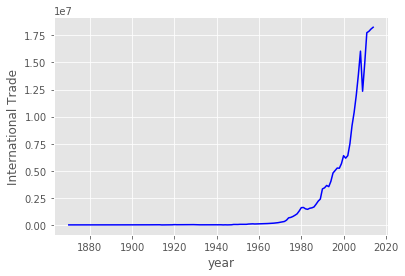

In [5]:
plt.plot(df.groupby(['year'])['flow'].sum(), c = 'blue')
plt.xlabel('year')
plt.ylabel('International Trade')

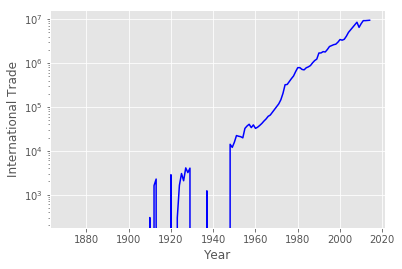

In [6]:
plt.plot(data.groupby(['year'])['flow1'].sum(), c = 'blue')
plt.xlabel('Year')
plt.ylabel('International Trade')
plt.yscale('log')

In [7]:
n_nodes = []
n_edges = []
for i in range(1950,2015):
    data_more_1950 = df.loc[np.where(df.year==i)[0], :]
    n_nodes.append(data_more_1950['Country_A'].nunique())
    n_edges.append(len(data_more_1950))

In [8]:
df_resume = pd.DataFrame({'year':[i for i in range(1950,2015)], 'Nb_nodes': n_nodes, 'Nb_edges':n_edges})

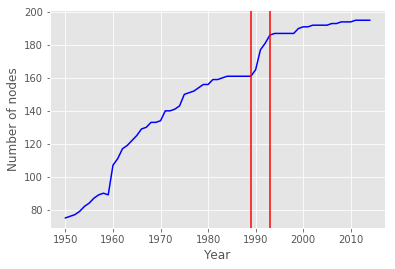

In [9]:
plt.plot(df_resume.year, df_resume.Nb_nodes, c = 'blue')
plt.xlabel('Year')
plt.ylabel('Number of nodes')
plt.axvline(x=1989, c = 'red')
plt.axvline(x=1993, c = 'red')

The number of country in the network increases.

Text(0,0.5,'Number of edges')

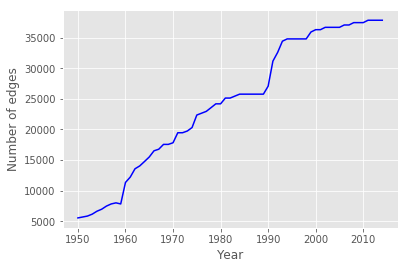

In [10]:
plt.plot(df_resume.year, df_resume.Nb_edges, c = 'blue')
plt.xlabel('Year')
plt.ylabel('Number of edges')

The number of exchanges increases.

Text(0,0.5,'Number of exchanges per country')

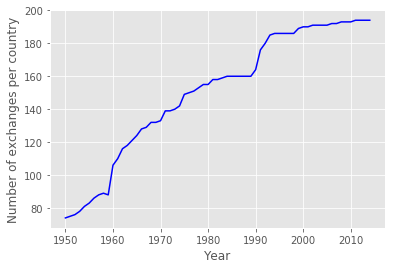

In [11]:
plt.plot(df_resume.year, df_resume.Nb_edges / df_resume.Nb_nodes, c = 'blue')
#plt.axvline(x=1989, c = 'red')
#plt.axvline(x=1993, c = 'red')
plt.xlabel('Year')
plt.ylabel('Number of exchanges per country')

The number of relation per country increases.

We can notice a drop in the years 1991-1993. It can come from the explosion of URSS. I will verify it.

In [12]:
lost_countries = list(set(df.loc[np.where(df.year==1989)[0],:].Country_A) - 
                      set(df.loc[np.where(df.year==1993)[0],:].Country_A))
new_countries = list(set(df.loc[np.where(df.year==1993)[0],:].Country_A) - 
                      set(df.loc[np.where(df.year==1989)[0],:].Country_A))

In [13]:
geolocator = Nominatim()
# Get coordinated of new countries
coordinates_new_countries = []
for i in new_countries:
    try:
        location = geolocator.geocode(i)
        coordinates_new_countries.append((location.latitude, location.longitude))
    except:
        coordinates_new_countries.append(('lat not found', 'lon not found'))
# Get coordinated of lost countries
coordinates_lost_countries = []
for i in lost_countries:
    try:
        location = geolocator.geocode(i)
        coordinates_lost_countries.append((location.latitude, location.longitude))
    except:
        coordinates_lost_countries.append(('lat not found', 'lon not found'))

In [14]:
df = pd.DataFrame({'Name': new_countries, 'lat': [i[0] for i in coordinates_new_countries], 'long': [i[1] for i in coordinates_new_countries]})

In [15]:
data = [ dict(
        type = 'scattergeo',
        lon = df['long'],
        lat = df['lat'],
        text = df['Name'],
        mode = 'markers',
        marker = dict(
            size = 3,
            opacity = 1,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            color='red'
        ))]

layout = dict(
        title = 'New countries between 1989 and 1993',
        colorbar = True,
        geo = dict(
            scope = 'europe',
            projection=dict( type='mollweide' ),
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )

fig = dict( data=data, layout=layout )
plotly.offline.iplot( fig, validate=False)

### Compute the evolution of the similarity between similarity matrices over time 

In [16]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
data.head()

,year,importer1,importer2,flow1,flow2
0,1920,United States of America,Canada,611.85999,735.47998
1,1921,United States of America,Canada,335.44000,442.98999
2,1922,United States of America,Canada,364.01999,502.84000
3,1923,United States of America,Canada,416.00000,598.14001
4,1924,United States of America,Canada,399.14001,496.32001


In [17]:
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_1['key'] = data_flow_1['Country_A'] + '-' + data_flow_1['Country_B']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
data_flow_2['key'] = data_flow_2['Country_B'] + '-' + data_flow_2['Country_A']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
# drop nan
df = df.dropna()
# We keep years from 1950
df = df[df.year>=1950].reset_index(drop=True)

In [18]:
# This gives us the proportion of importation of Country_A from Country_B at for each yer
df['flow'] = df['flow'] / df.groupby(['year', 'Country_A'])['flow'].transform(sum) *100
# drop nan
df = df.dropna().reset_index(drop=True)

Here, we delete countries for which we do not know the value of their import.

For each year, we compute squared symmetric average exchanges' intensity matrix.

## Using Frobesnium norm

In [20]:
list_intensity_matrix = []
list_intensity_matrix_col = []
list_intensity_matrix_index = []
for i in list(df.year.unique()):
    inter_df = df[df.year==i]
    # Get squared similarity matrix
    data = pd.pivot_table(inter_df, values='flow', index=['Country_A'], columns=['Country_B'], fill_value=0)
    list_intensity_matrix.append(data)
    list_intensity_matrix_col.append(list(data.columns))
    list_intensity_matrix_index.append(list(data.index))

In [21]:
diff_frobenius_norm = []
for i in range(len(list_intensity_matrix)-1):
    aligned_mat_left = list_intensity_matrix[i].align(list_intensity_matrix[i+1], join='inner')[0].as_matrix()
    aligned_mat_right = list_intensity_matrix[i].align(list_intensity_matrix[i+1], join='inner')[1].as_matrix()
    diff_frobenius_norm.append(np.linalg.norm(aligned_mat_left-aligned_mat_right, 'fro'))

__Bollinger bands method__

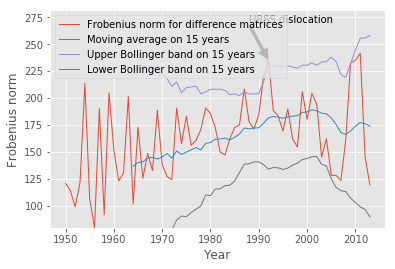

In [22]:
window_size = 15

ma_y = pd.Series(diff_frobenius_norm).rolling(window=window_size).mean()
std_y = pd.Series(diff_frobenius_norm).rolling(window=window_size).std()
Bollinger_dict = {'MA_y': ma_y, 'UB_y': ma_y+1.96*std_y, 'LB_y': ma_y-1.96*std_y}

fig = plt.figure()
ax = fig.add_subplot(111)

line, = ax.plot(list(df.year.unique())[:-1], diff_frobenius_norm, lw=1)
line, = ax.plot(list(df.year.unique())[:-1], Bollinger_dict['MA_y'], lw=1)
line, = ax.plot(list(df.year.unique())[:-1], Bollinger_dict['UB_y'], lw=1)
line, = ax.plot(list(df.year.unique())[:-1], Bollinger_dict['LB_y'], lw=1)

ax.annotate('URSS dislocation', xy=(1992, 235), xytext=(1988, 270),
            arrowprops=dict(facecolor='black'),)
ax.set_ylim(min(diff_frobenius_norm),max(diff_frobenius_norm)+40)
#plt.title('Norm of the differences of the intensity matrices')
plt.xlabel('Year')
plt.ylabel('Frobenius norm')
plt.legend(loc = 'upper left', labels = ['Frobenius norm for difference matrices',
                                         'Moving average on {} years'.format(window_size),
                                         'Upper Bollinger band on {} years'.format(window_size),
                                         'Lower Bollinger band on {} years'.format(window_size)])

In [23]:
from itertools import compress
'The years where values of the norm are greater than the upper Bollinger band are {}'.format(
    list(compress(list(df.year.unique())[:-1], list(diff_frobenius_norm > Bollinger_dict['UB_y']))))

'The years where values of the norm are greater than the upper Bollinger band are [1987, 1991, 1992, 2009]'

We know from the previous analysis that the anomaly detected in 1991 and 1992 come from the URSS dislication. Now, we try to understand what happened in 2009.

In [24]:
loc_2009 = np.where(df.year.unique()==1991)[0][0]
mat_2009 = list_intensity_matrix[loc_2009]
mat_2010 = list_intensity_matrix[loc_2009+1]
aligned_mat_2009 = mat_2009.align(mat_2010, join='inner')[0].as_matrix()
aligned_mat_2010 = mat_2009.align(mat_2010, join='inner')[1].as_matrix()

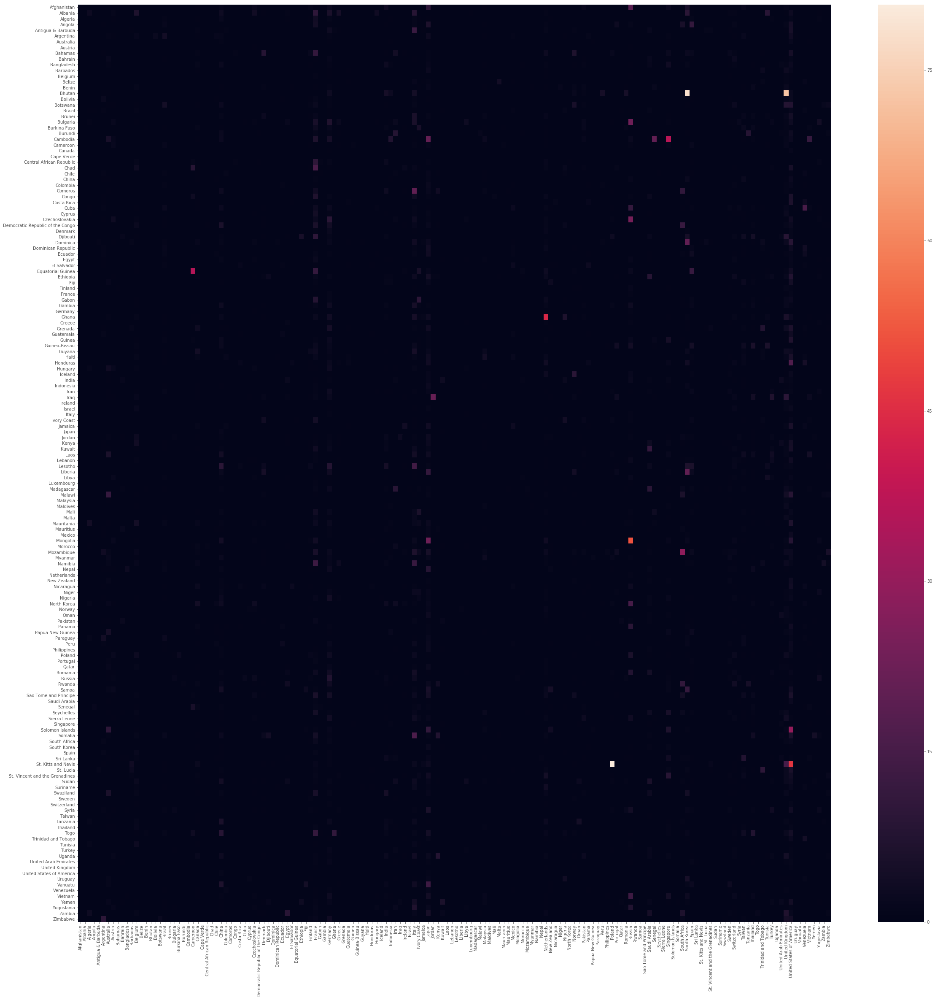

In [25]:
fig, ax = plt.subplots(figsize=(40,40)) 
sns.heatmap(abs(aligned_mat_2010-aligned_mat_2009), xticklabels = list_intensity_matrix_col[loc_2009],
           yticklabels = list_intensity_matrix_index[loc_2009])

From this heatmap, it is hard to say which country contributes the most to the increase of the Frobenius norm. Theredore, we are going to look at the evolution of the Frobenius norm inside each continent.

__Twitter detection anomalie method__ <-- NOT WORKING FOR OUR PROBLEM

In [28]:
from pyculiarity import detect_ts
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib
matplotlib.style.use('ggplot')

ImportError: No module named 'pyculiarity'

In [27]:
twitter_example_data = pd.read_csv('raw_data.csv', usecols=['timestamp', 'count'])
twitter_example_data.timestamp = twitter_example_data.timestamp.apply(lambda x: time.mktime(datetime.datetime.strptime(x, "%Y-%m-%d %H:%M:%S").timetuple()))

FileNotFoundError: File b'raw_data.csv' does not exist

/Users/Linger/anaconda/lib/python3.5/site-packages/pyculiarity/detect_anoms.py:81: FutureWarning:

convert_objects is deprecated.  Use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.



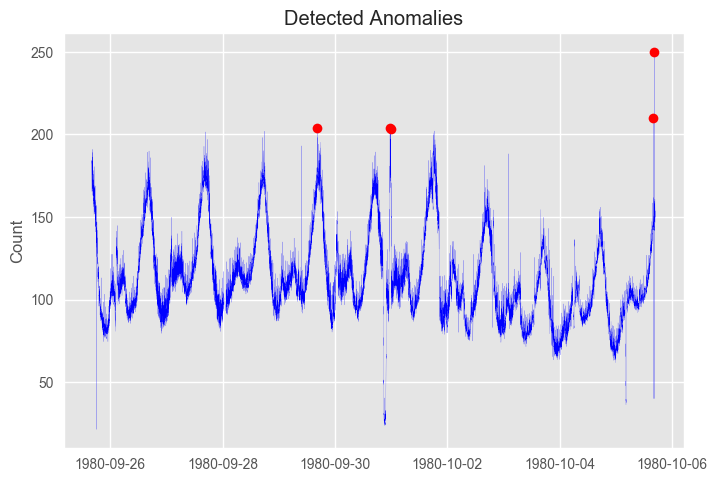

In [476]:
# first run the models
results = detect_ts(twitter_example_data, max_anoms=0.1, alpha=0.1, direction='both')

# format the twitter data nicely
twitter_example_data['timestamp'] = pd.to_datetime(twitter_example_data['timestamp'])
twitter_example_data.set_index('timestamp', drop=True)

# make a nice plot
f, ax = plt.subplots(1, 1, sharex=True)
ax.plot(twitter_example_data['timestamp'], twitter_example_data['count'], 'b', lw=0.1)
ax.plot(results['anoms'].index, results['anoms']['anoms'], 'ro')
ax.set_title('Detected Anomalies')
ax.set_ylabel('Count')
plt.show()

__Other method here__

In [477]:
import pickdetect

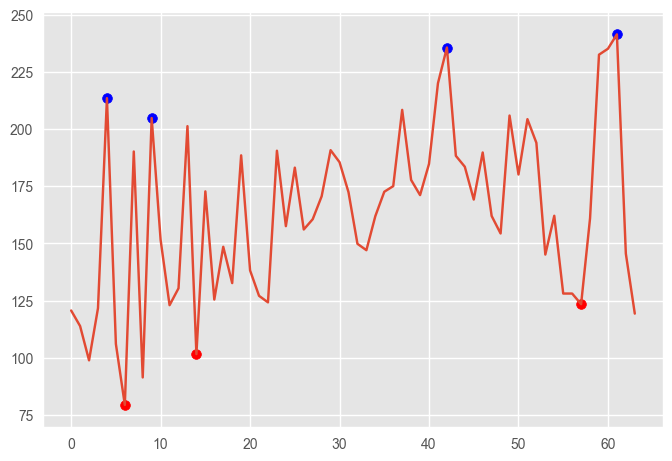

In [488]:
from matplotlib.pyplot import plot, scatter, show
series = diff_frobenius_norm
maxtab, mintab = pickdetect.peakdet(series,100)
plot(series)
scatter(np.array(maxtab)[:,0], np.array(maxtab)[:,1], color='blue')
scatter(np.array(mintab)[:,0], np.array(mintab)[:,1], color='red')
show()

This method is too naive so we would make use of the Bollinger bands.

### We look at continents subgraphs

In [354]:
continent = eval(open("continent.py").read())

In [355]:
continent_dict = {}
for i, j in enumerate(continent):
    continent_dict.update({continent[i]['name']: continent[i]['continent']})

In [356]:
countries = list(df.Country_A.unique())

In [357]:
len([i for i in list(map(continent_dict.get, countries)) if i != None])/len(list(map(continent_dict.get, countries)))

0.8814432989690721

On a 88% des pays attachés à un continent en utilisant la méthode du dict. Je vais rajouter les autres à la main...

In [358]:
continent_dict.update({'United States of America': 'North America', 'St. Lucia':'North America','St. Vincent and the Grenadines':'North America',
 'Antigua & Barbuda':'North America', 'St. Kitts and Nevis':'North America', 'Ireland':'Europe', 'Netherlands':'Europe',
 'German Federal Republic':'Europe', 'German Democratic Republic':'Europe', 'Czechoslovakia':'Europe',
 'Yugoslavia':'Europe', 'Kosovo':'Europe', 'Sao Tome and Principe':'Africa','Gambia':'Africa', 'Ivory Coast':'Africa',
 'Congo':'Africa','Zanzibar':'Africa','South Sudan':'Africa', 'Yemen Arab Republic':'Asia',
 'Yemen People\'s Republic':'Asia', 'China':'Asia', 'Taiwan':'Asia', 'Republic of Vietnam':'Asia', 'Brunei':'Asia'})

In [359]:
len([i for i in list(map(continent_dict.get, countries)) if i != None])/len(list(map(continent_dict.get, countries)))

1.0

Maintenant on a un mapping parfait

In [360]:
df['continent'] = list(map(continent_dict.get, df.Country_A))
df['continent_B'] = list(map(continent_dict.get, df.Country_B))

On coupe les liens entre des pays de continents différents de manière à travailler sur les sous-graphes.

In [361]:
df_sub_cont = df.iloc[np.where(df.continent == df.continent_B)[0], :]
df_sub_cont = df_sub_cont.drop(['continent_B'], axis=1)

L'analyse par continent peut maintenant commencer

In [362]:
df_sub_cont = [df_sub_cont[df_sub_cont.continent==i] for i in list(df_sub_cont.continent.unique())]

In [17]:
[i.continent.unique() for i in df_sub_cont]

[array(['North America'], dtype=object),
 array(['South America'], dtype=object),
 array(['Europe'], dtype=object),
 array(['Asia'], dtype=object),
 array(['Africa'], dtype=object),
 array(['Oceania'], dtype=object)]

Text(0.9,0,'Year')

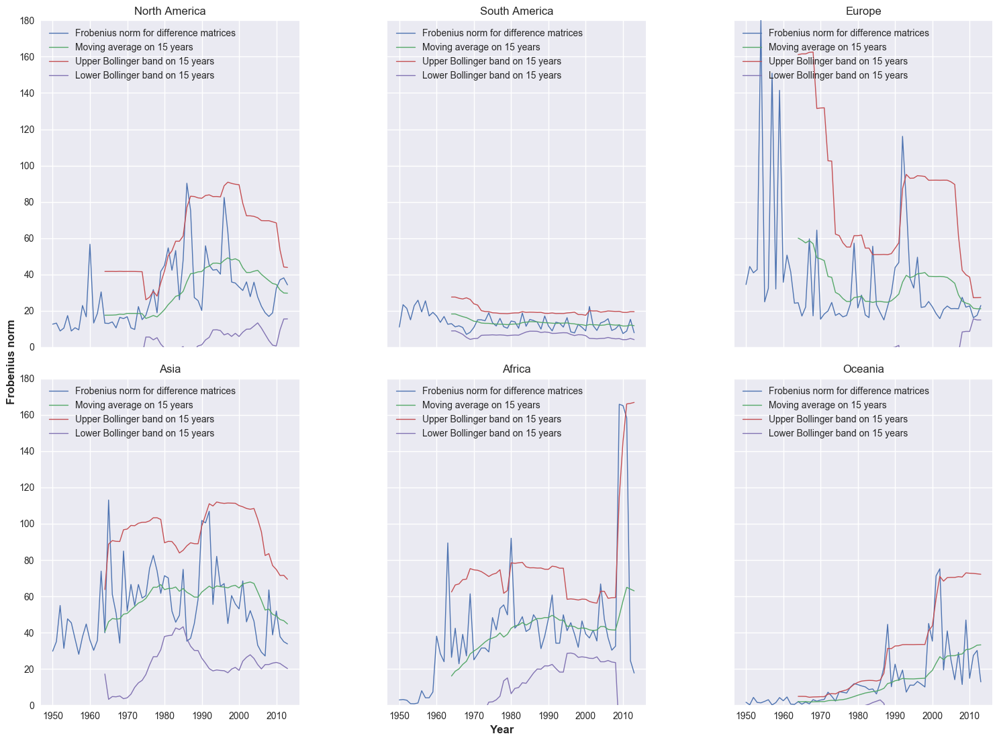

In [19]:
from itertools import compress
window_size = 15



fig,axn = plt.subplots(2, 3, sharex=True, sharey=True)
ax = axn.flat



years = list(df_sub_cont[0].year.unique())
pics = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
list_intensity_matrix = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
list_intensity_matrix_col = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
list_intensity_matrix_index = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
for z, data in enumerate(df_sub_cont):
    continent = data.continent.unique()[0]
    for j in years:
        inter_df = data[data.year==j]
        # Get squared similarity matrix
        inter_df = pd.pivot_table(inter_df, values='flow', index=['Country_A'], columns=['Country_B'], fill_value=0)
        list_intensity_matrix[continent].append(inter_df)
        list_intensity_matrix_col[continent].append(list(inter_df.columns))
        list_intensity_matrix_index[continent].append(list(inter_df.index))
    diff_frobenius_norm = []
    for i in range(len(list_intensity_matrix[continent])-1):
        aligned_mat_left = list_intensity_matrix[continent][i].align(list_intensity_matrix[continent][i+1], join='inner')[0].as_matrix()
        aligned_mat_right = list_intensity_matrix[continent][i].align(list_intensity_matrix[continent][i+1], join='inner')[1].as_matrix()
        diff_frobenius_norm.append(np.linalg.norm(aligned_mat_left-aligned_mat_right, 'fro'))
        
    ma_y = pd.Series(diff_frobenius_norm).rolling(window=window_size).mean()
    std_y = pd.Series(diff_frobenius_norm).rolling(window=window_size).std()
    Bollinger_dict = {'MA_y': ma_y, 'UB_y': ma_y+1.96*std_y, 'LB_y': ma_y-1.96*std_y}
    
    pics[data.continent.unique()[0]].append(list(compress(list(years)[:-1], list(diff_frobenius_norm > Bollinger_dict['UB_y']))))
    
    ax[z].plot(list(df.year.unique())[:-1], diff_frobenius_norm, lw=1)
    ax[z].plot(list(df.year.unique())[:-1], Bollinger_dict['MA_y'], lw=1)
    ax[z].plot(list(df.year.unique())[:-1], Bollinger_dict['UB_y'], lw=1)
    ax[z].plot(list(df.year.unique())[:-1], Bollinger_dict['LB_y'], lw=1)
    
    ax[z].set_title(list(df.continent.unique())[z])
    #ax[z].set_xlabel('Year')
    #ax[z].set_ylabel('Frobenius norm')
    ax[z].legend(loc = 'upper left', labels = ['Frobenius norm for difference matrices',
                                         'Moving average on {} years'.format(window_size),
                                         'Upper Bollinger band on {} years'.format(window_size),
                                         'Lower Bollinger band on {} years'.format(window_size)])
    ax[z].set_ylim(0,180)

fig.tight_layout(rect=[0, 0, 2, 2])
fig.text(0,1.1,'Frobenius norm', rotation='vertical', weight = 'heavy')
fig.text(.9,0,'Year', weight = 'heavy')

Le contiennt le plus calme semble être l'Amérique du sud dans le mesure où il ne recense qu'un pic significatif.

In [23]:
[i for i in list_intensity_matrix]

['South America', 'Europe', 'Oceania', 'Africa', 'Asia', 'North America']

Pour ces années, nous allons plotter les heatmaps par continent de manière à voir quels pays sont impliqués dans le changement de la structure des échanges.

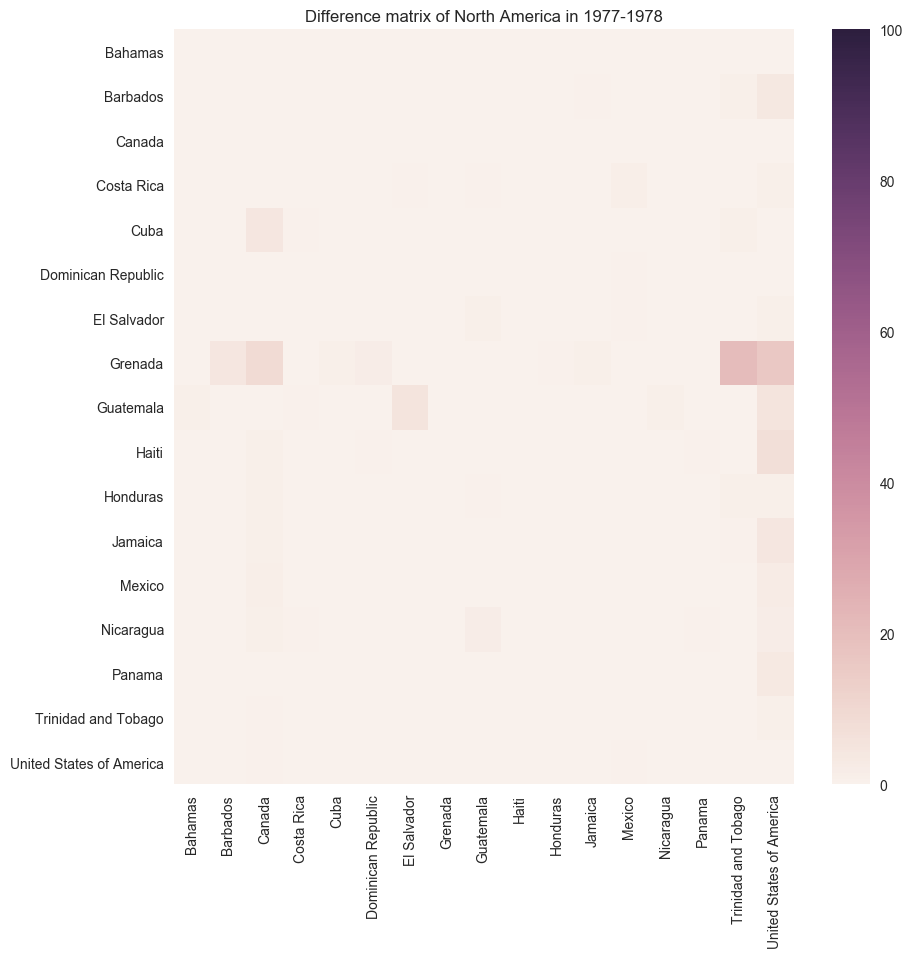

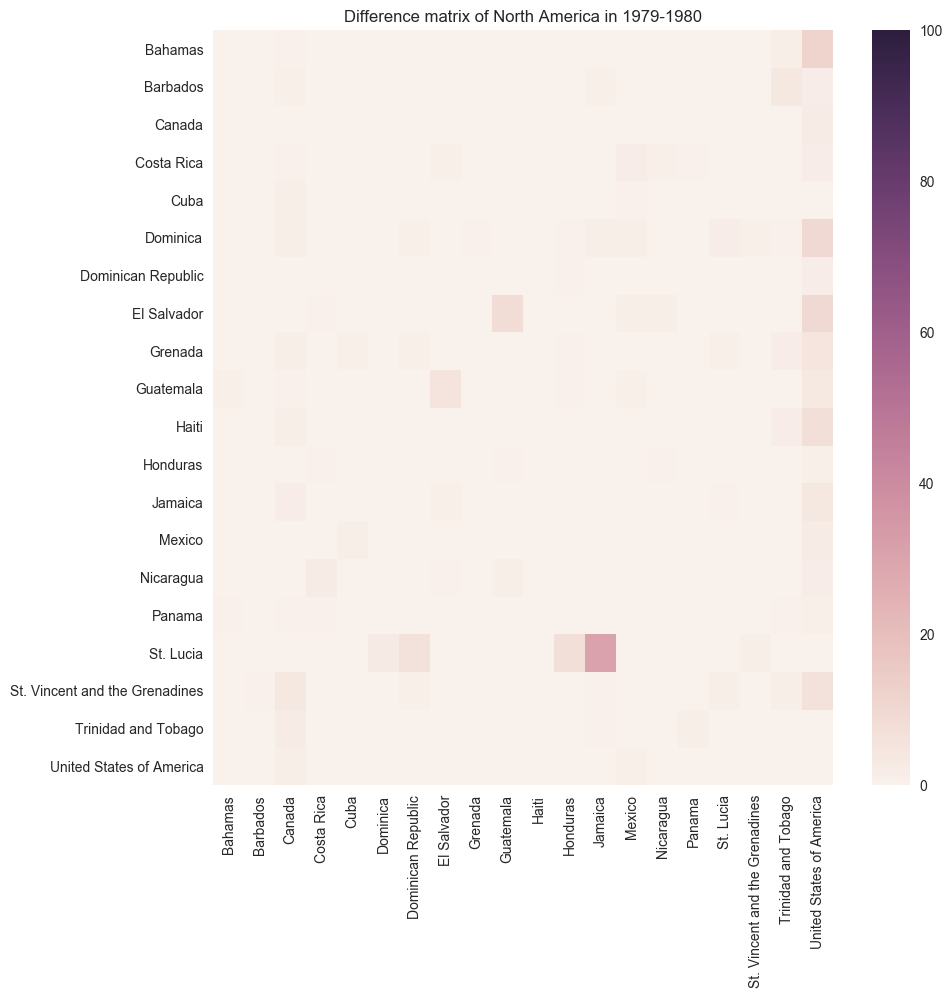

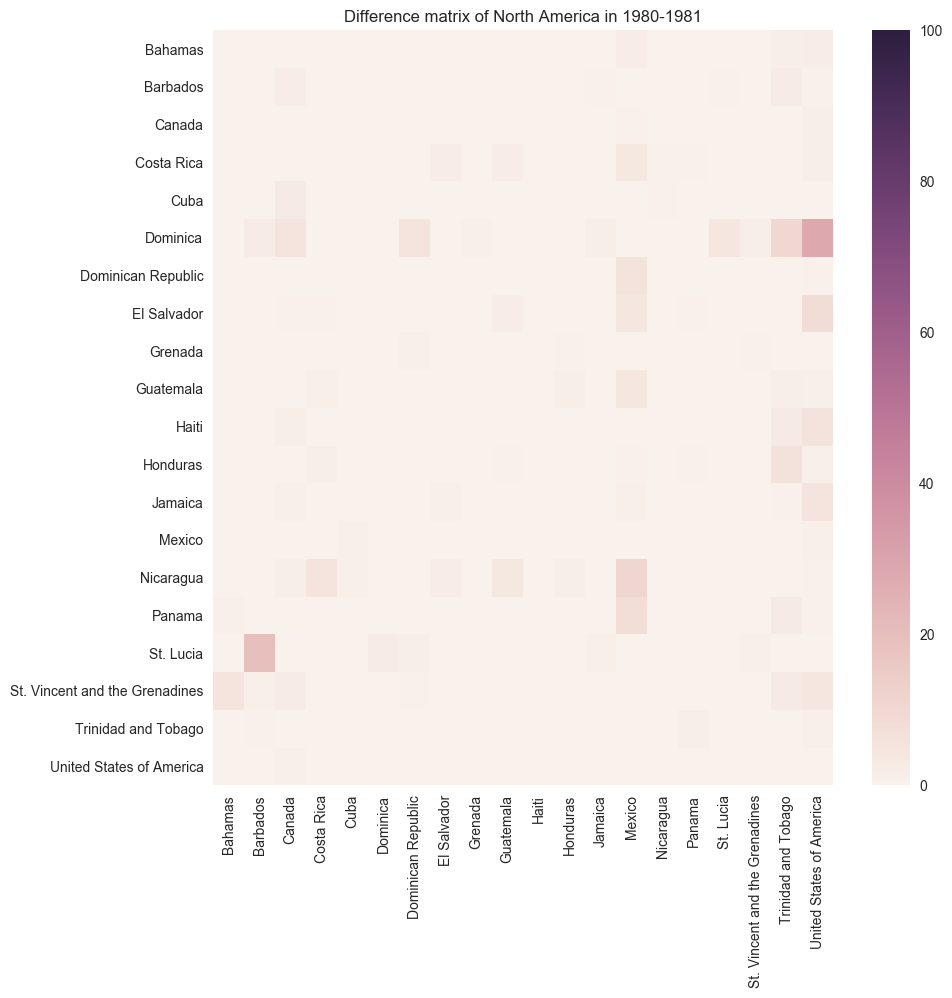

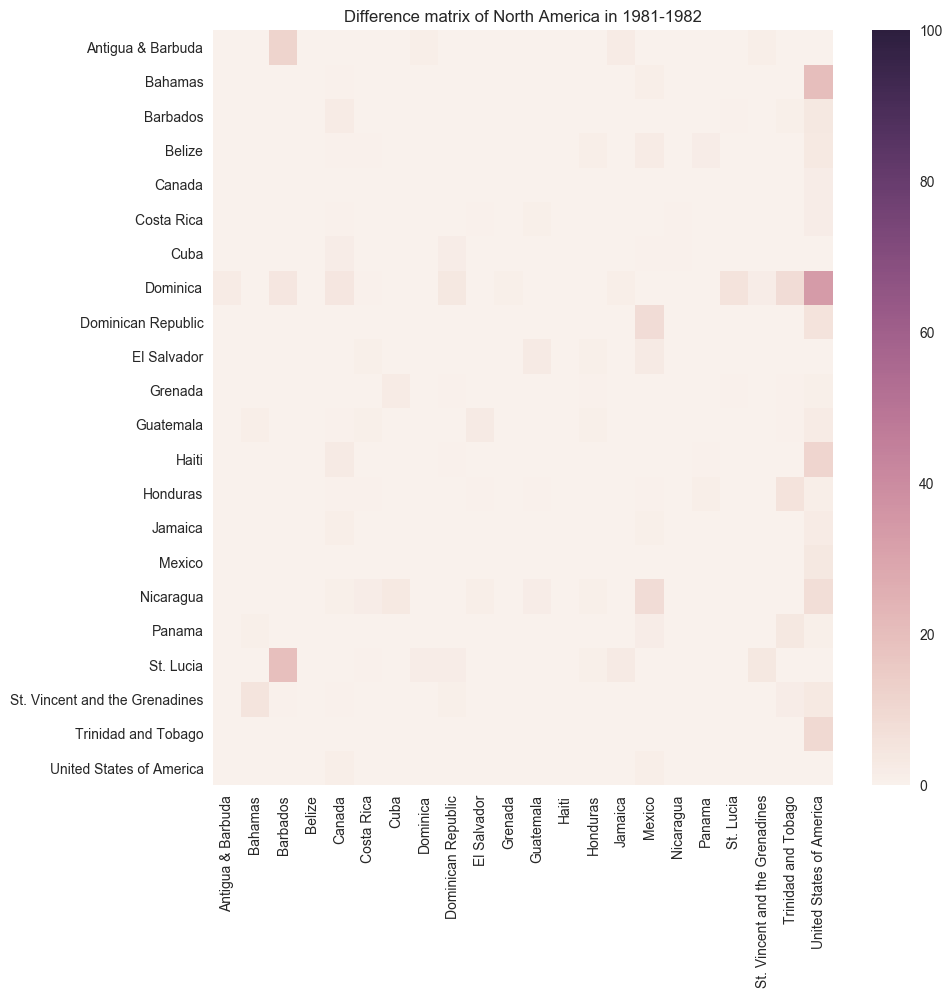

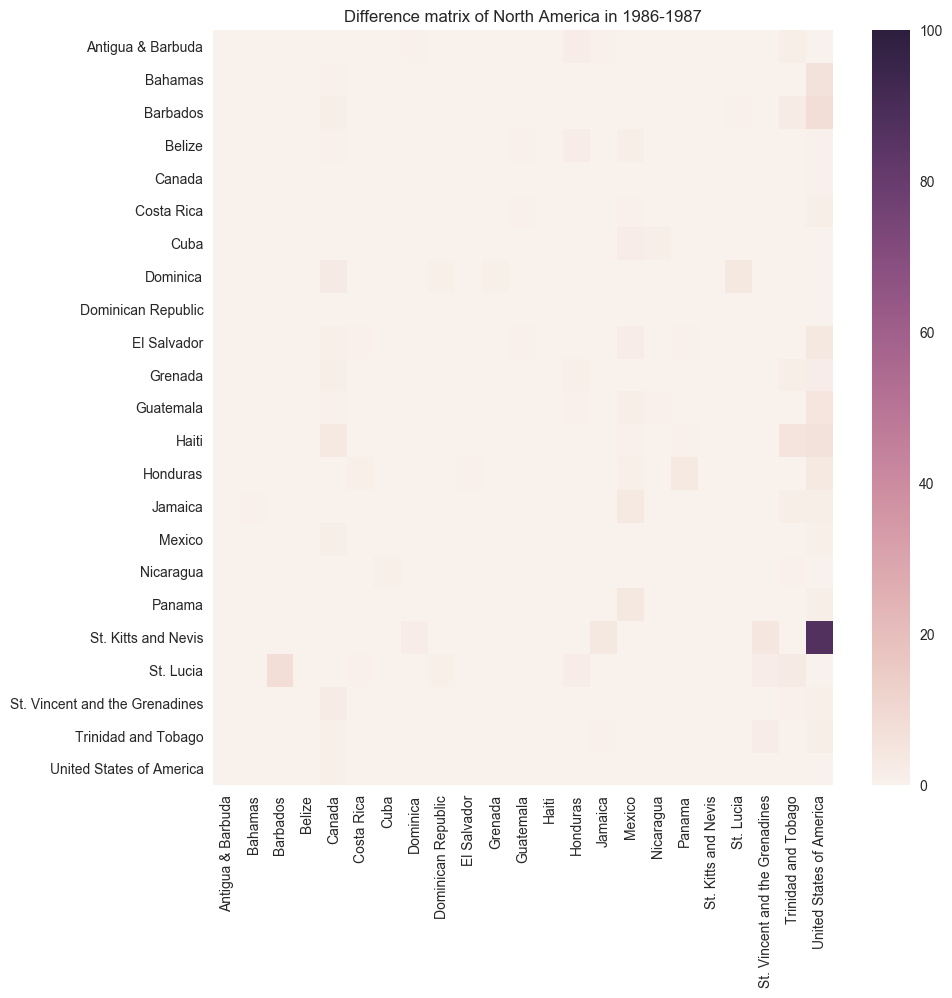

...

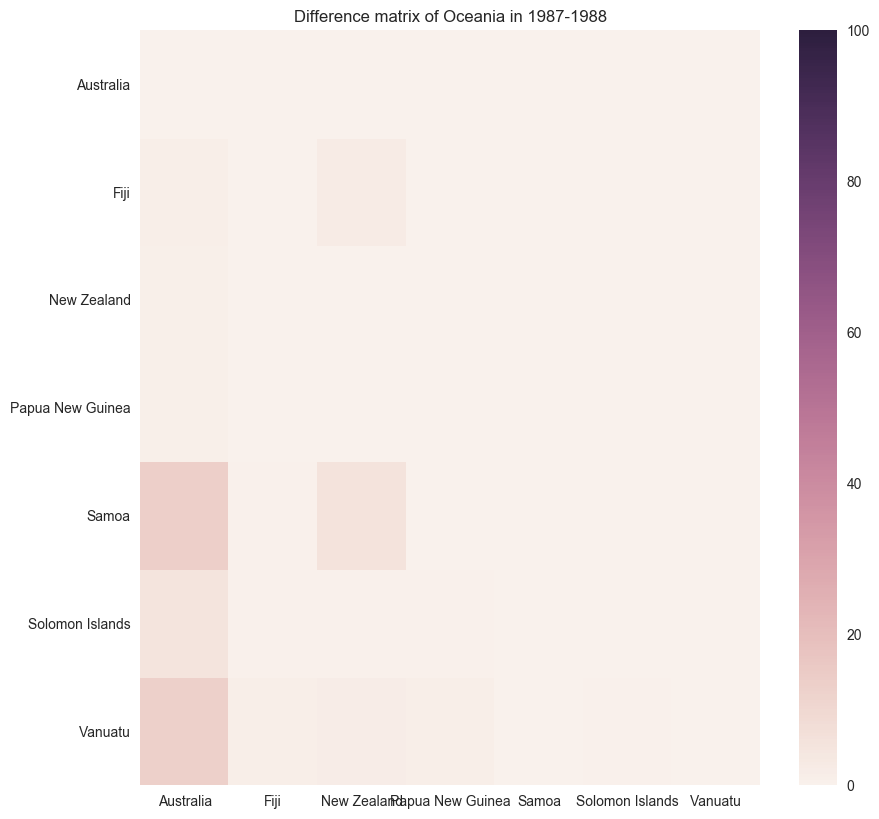

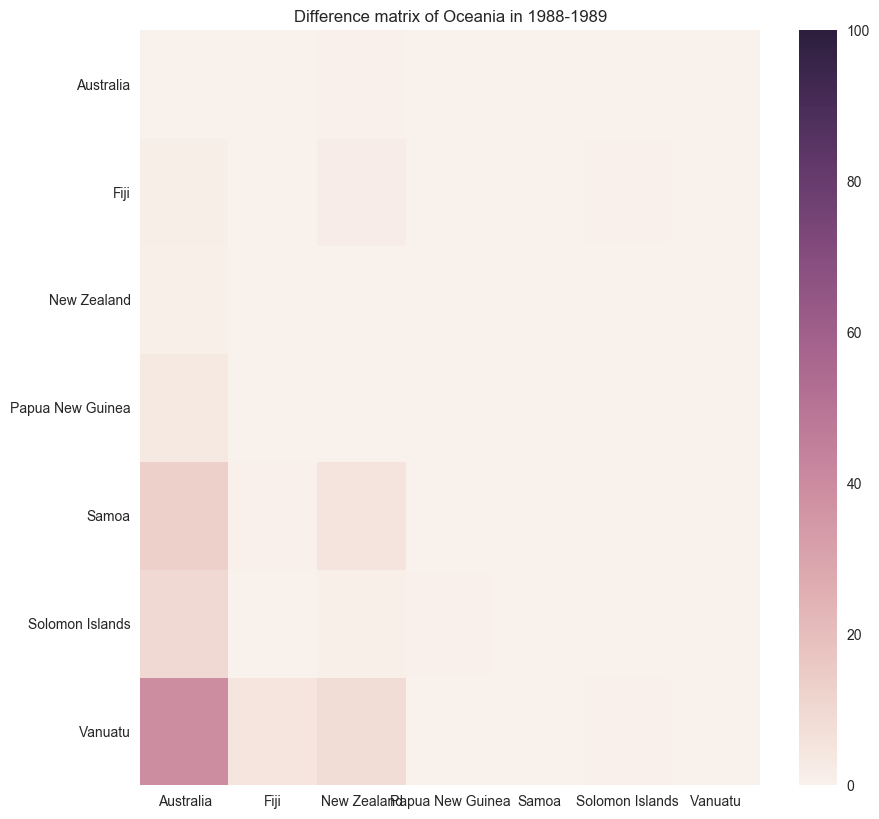

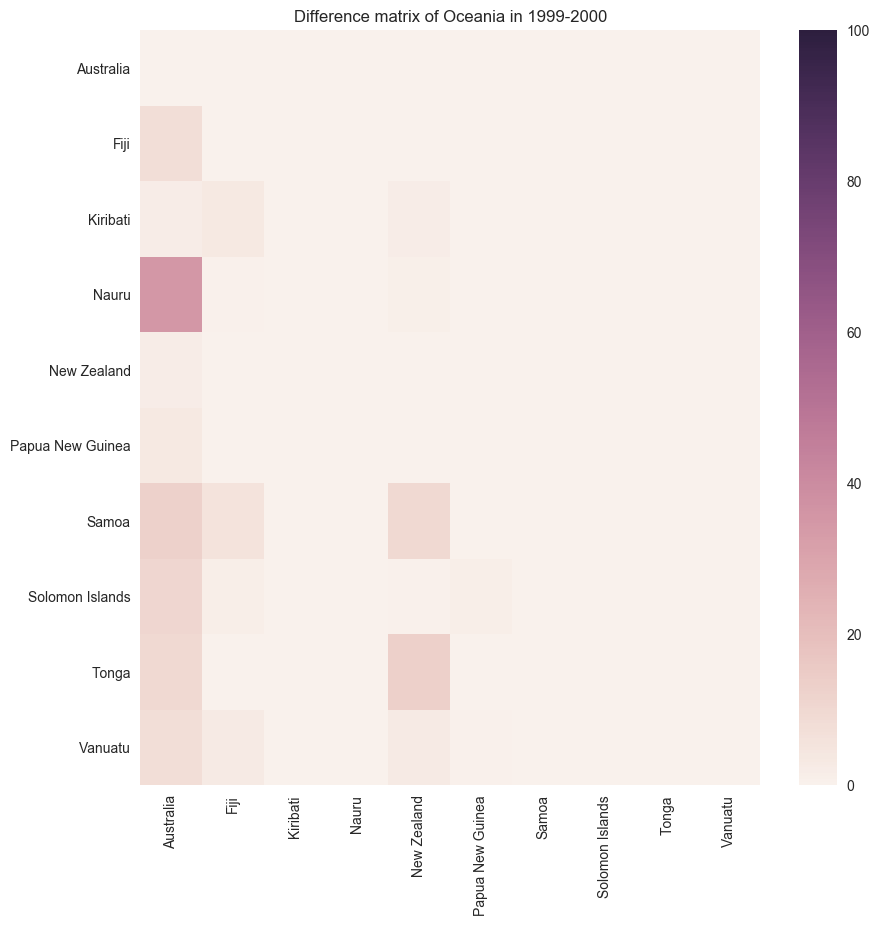

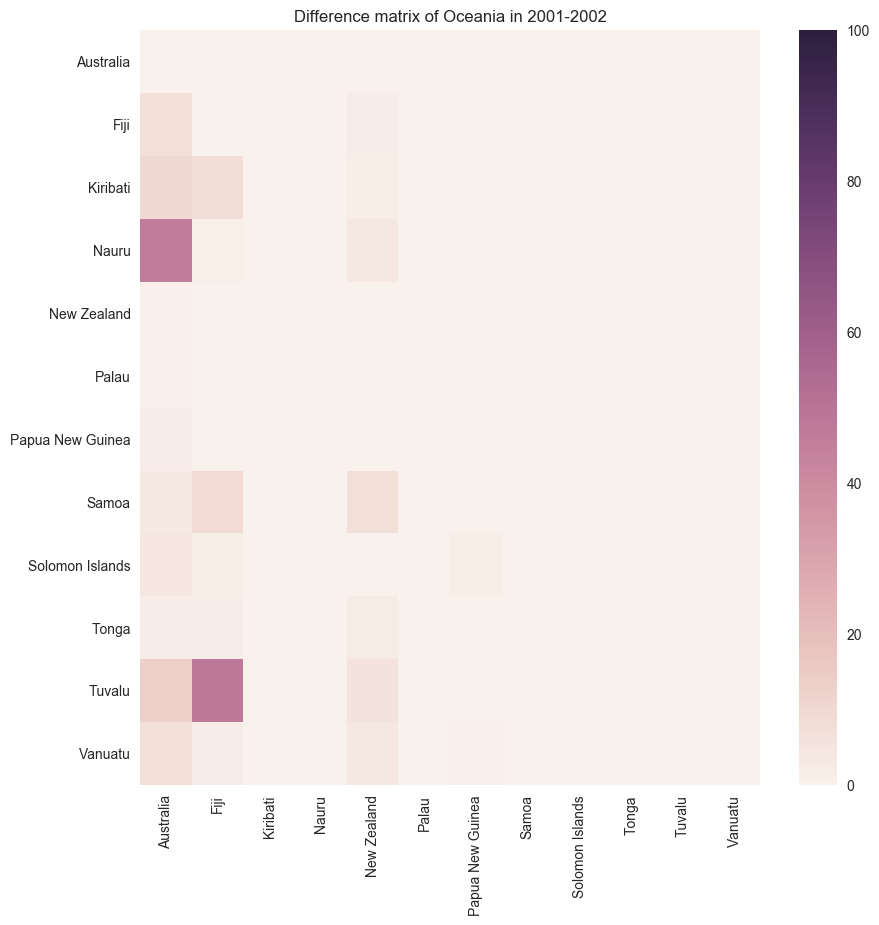

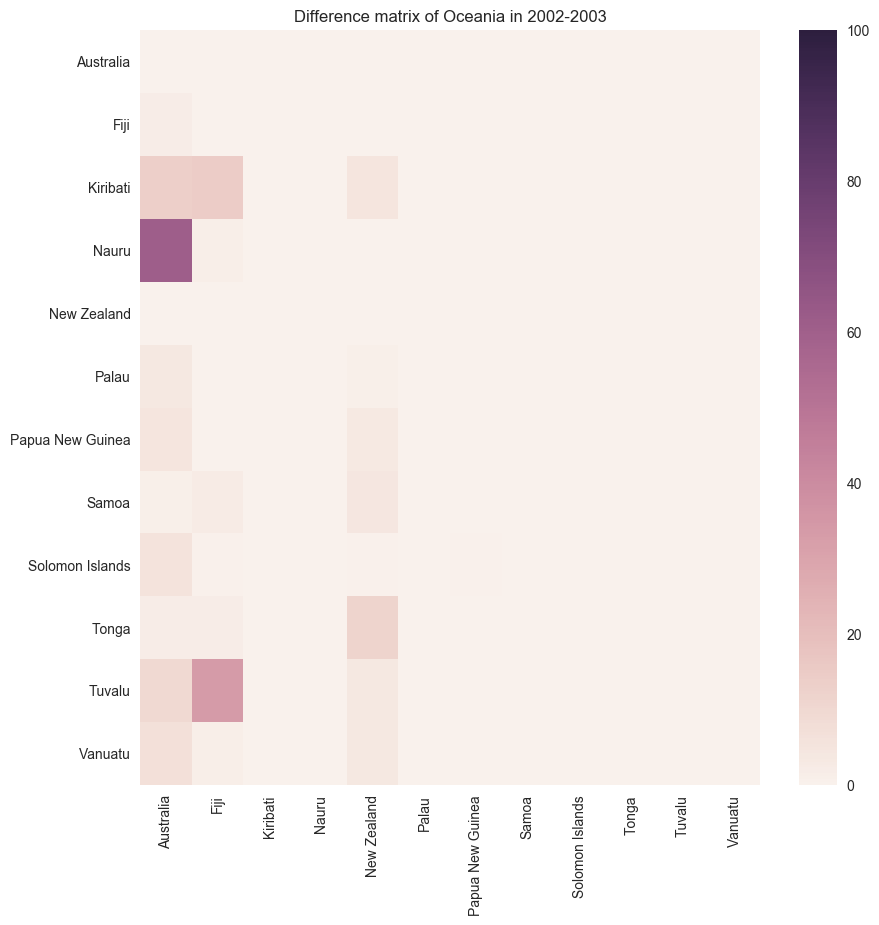

In [21]:
for data in df_sub_cont:
    continent = data.continent.unique()[0]
    years_pic = pics[continent][0]
    for k in years_pic:
        loc = np.where(np.array(years)==k)[0][0]
        mat_1 = list_intensity_matrix[continent][loc]
        mat_2 = list_intensity_matrix[continent][loc+1]
        aligned_mat_1 = mat_1.align(mat_2, join='inner')[0].as_matrix()
        aligned_mat_2 = mat_1.align(mat_2, join='inner')[1].as_matrix()
        plt.figure(figsize=(10,10))
        sns.heatmap(abs(aligned_mat_1-aligned_mat_2), xticklabels = list_intensity_matrix_col[continent][loc],
                   yticklabels = list_intensity_matrix_index[continent][loc], vmin=0, vmax=100)
        plt.title('Difference matrix of {} in {}-{}'.format(continent, k, k+1))
        plt.show()

__Explanation African spike__

Le pic en Afrique entre 2009 et 2010 est dû à 4 pays d'Afrique qui se sont mis à beaucoup commercer avec l'Afrique du Sud. Ces 4 pays sont le Botswana, le Lesotho, la Namibia et le Swaziland. Avec l'Afrique du Sud, ces 5 pays forment l'Union douanière d'Afrique australe (Southern African Custom Union (SACU) en anglais). Nous pouvons donc penser qu'un accord au sein de cette union pourrait être à l'initiative de ce changement.

/Users/Linger/anaconda/lib/python3.5/site-packages/matplotlib/figure.py:2267: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



Text(0.7,0,'Exporter')

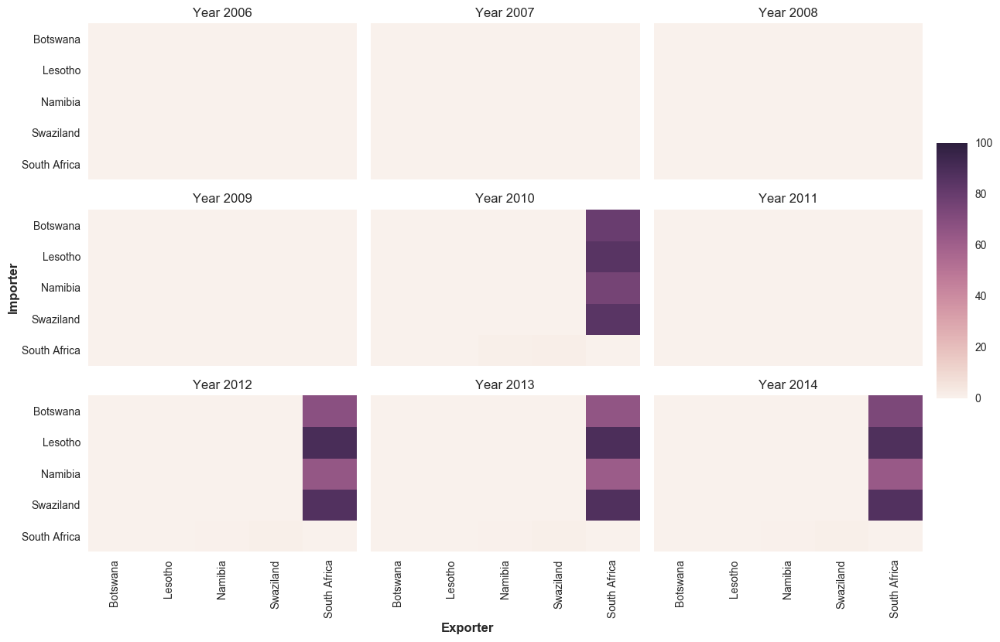

In [25]:
fig,axn = plt.subplots(3, 3, sharex=True, sharey=True)

ax = axn.flat
cbar_ax = fig.add_axes([1.5, .55, .05, .6])
    
for i, k in enumerate([l for l in range(2006,2015)]):
    loc = np.where(np.array(years)==k)[0][0]
    inter_df = list_intensity_matrix['Africa'][loc].loc[['Botswana', 'Lesotho', 'Namibia', 'Swaziland', 'South Africa'],
                                ['Botswana', 'Lesotho', 'Namibia', 'Swaziland', 'South Africa']]
    inter_df.columns.name = ''
    inter_df.index.name = ''
    sns.heatmap(inter_df, vmin=0, vmax=100, ax = ax[i], cbar=i == 0, cbar_ax=None if i else cbar_ax)
    ax[i].set_title('Year {}'.format(k))
    
fig.tight_layout(rect=[0, 0, 1.5, 1.5])
fig.text(0,.85,'Importer', rotation='vertical', weight = 'heavy')
fig.text(.7,0,'Exporter', weight = 'heavy')

The spikes around 2010 are explained by the fact that countries inside SACU started to report their exchanges between each others. Before, the 5 countries inside SECU didn't report their exchanges between each other.

___Explanation European spike in 1984-1985___

18.560505873537565


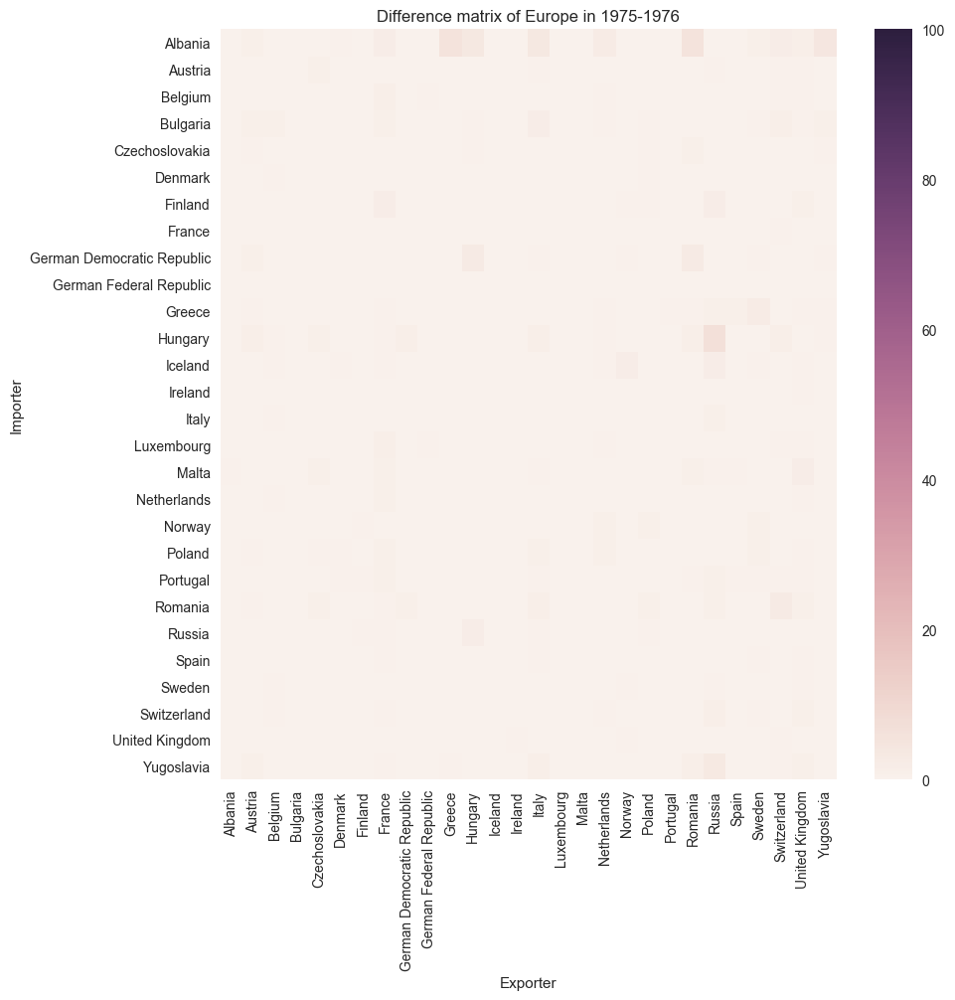

16.650510021975624


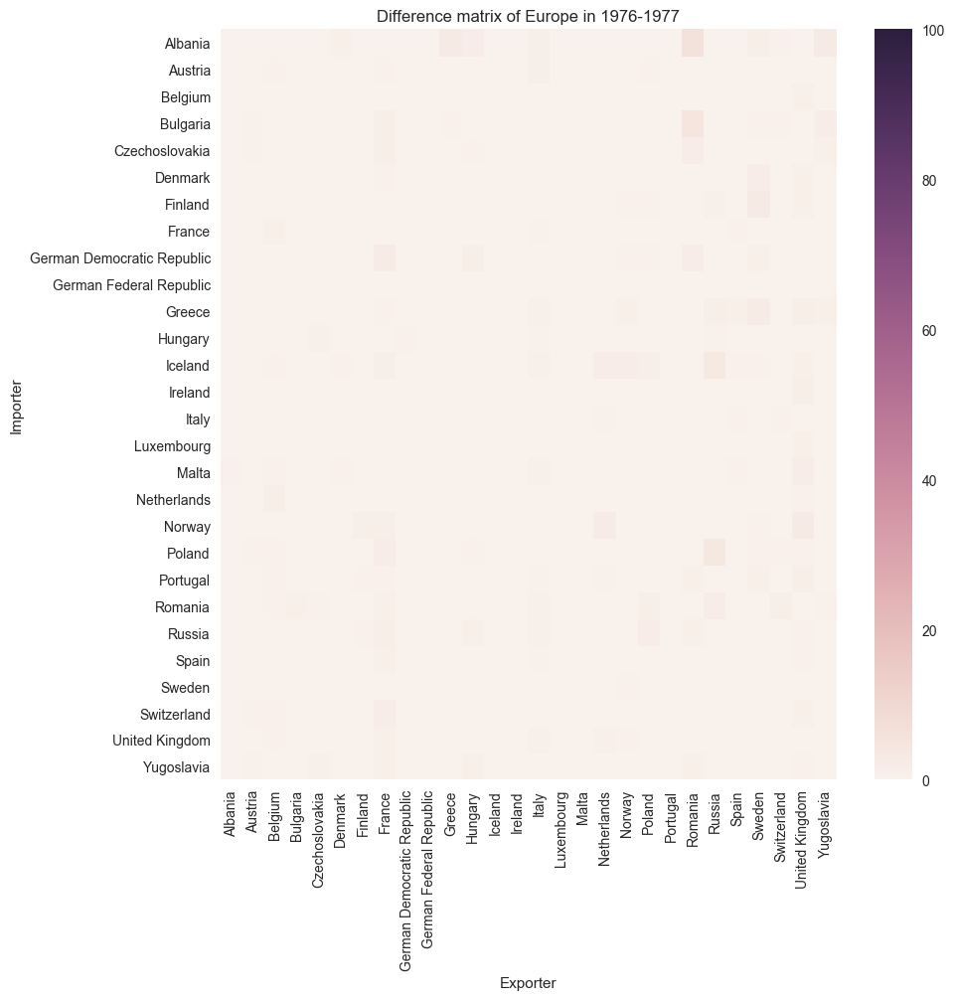

17.435503764334044


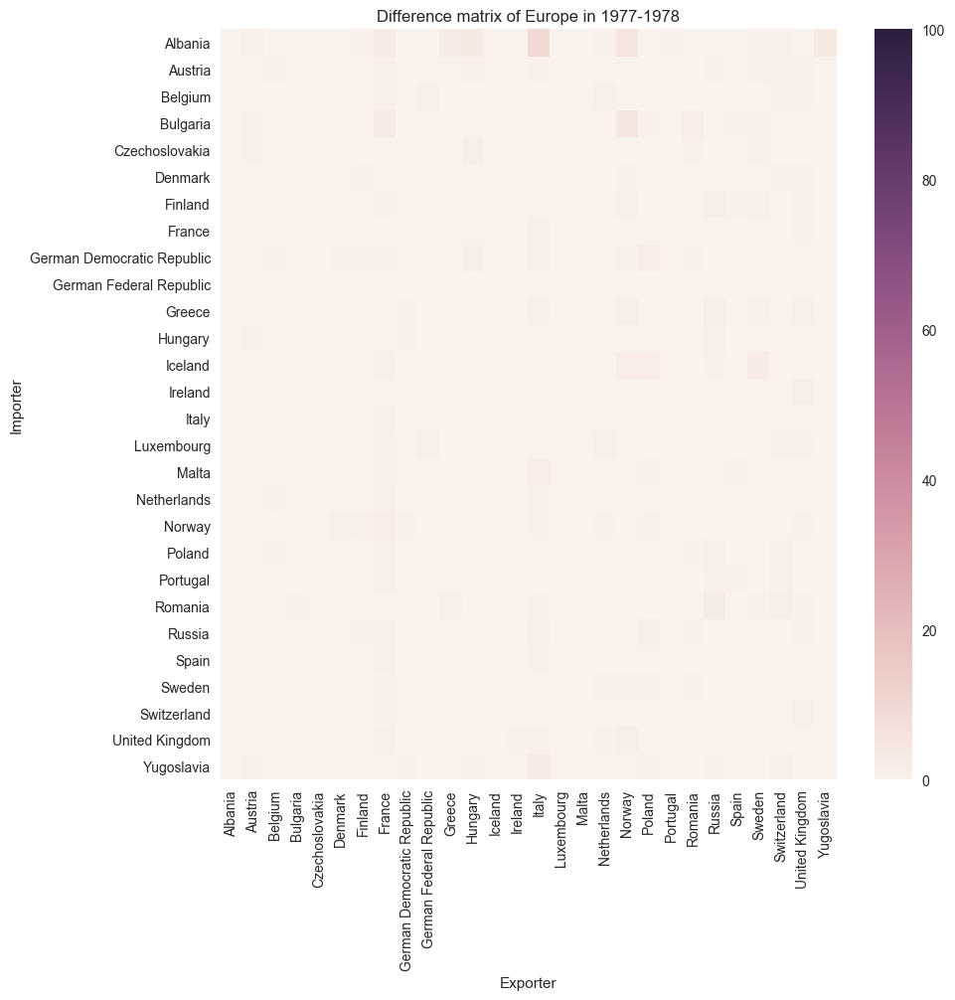

23.727668292280878


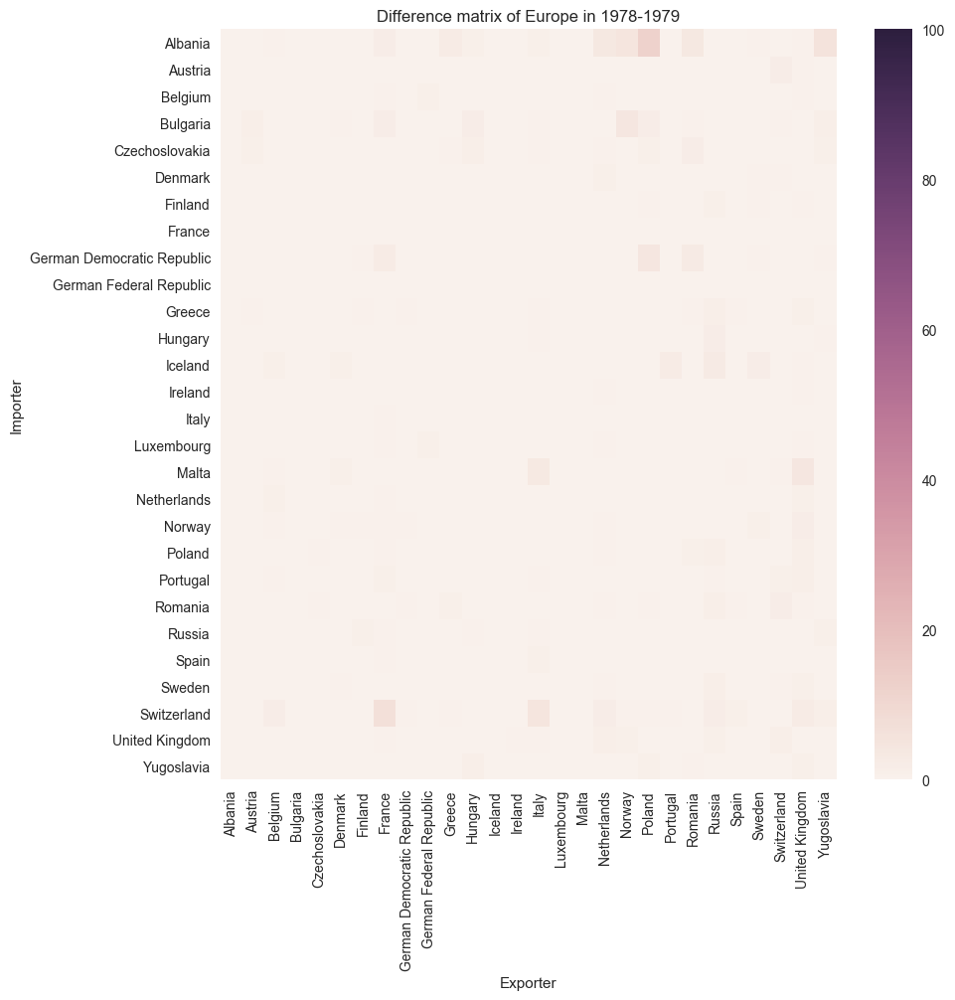

57.26326074888292


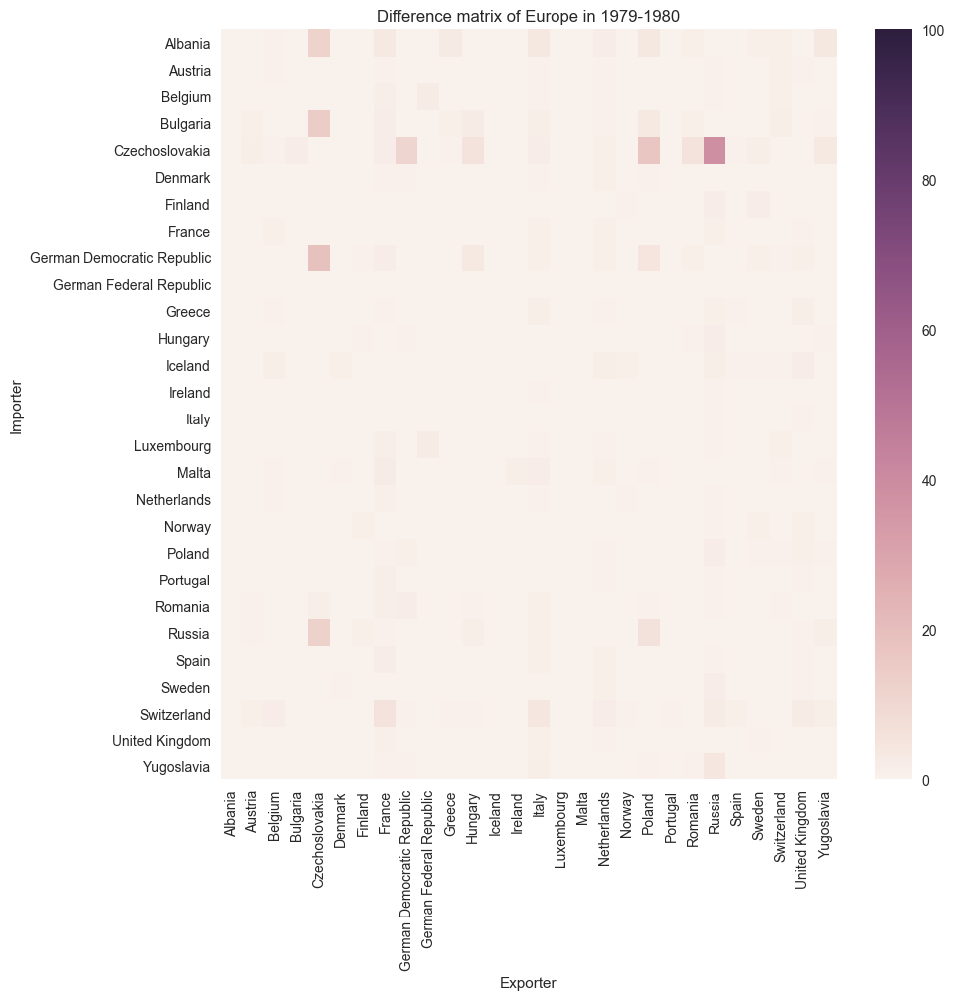

21.551753941476615


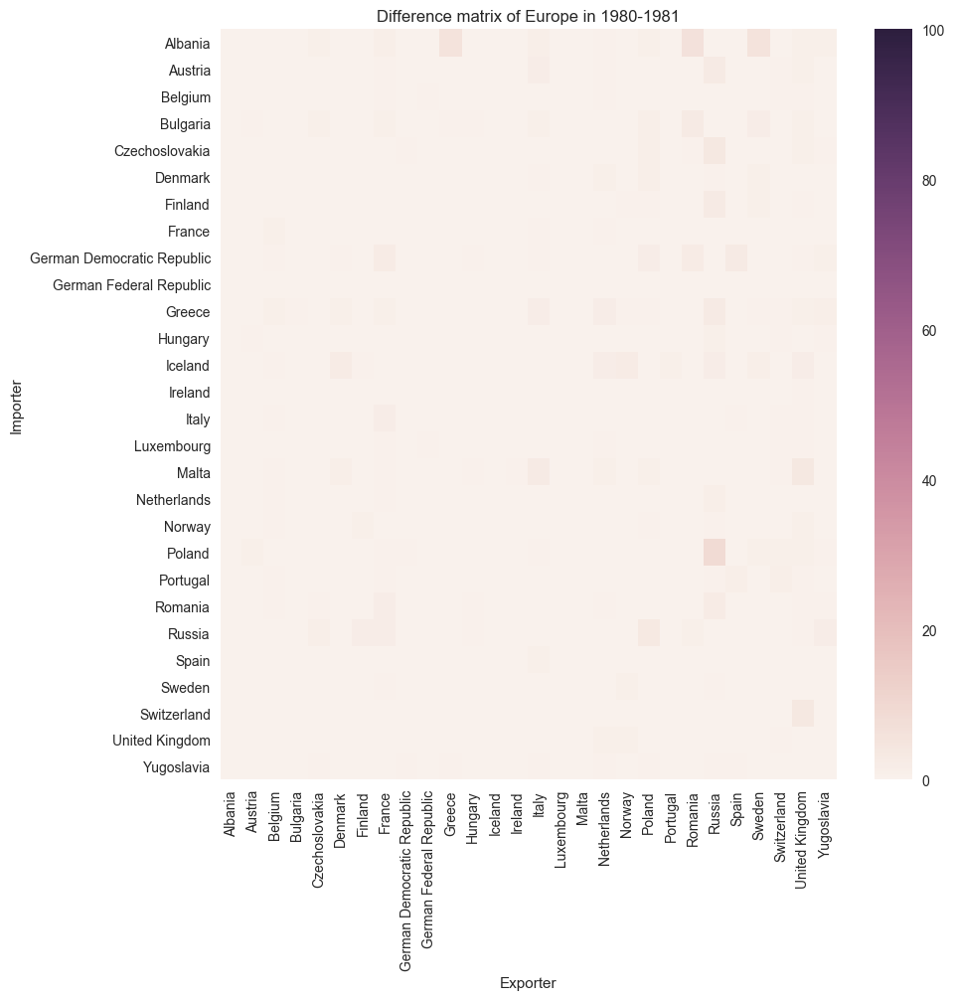

28.63619295344672


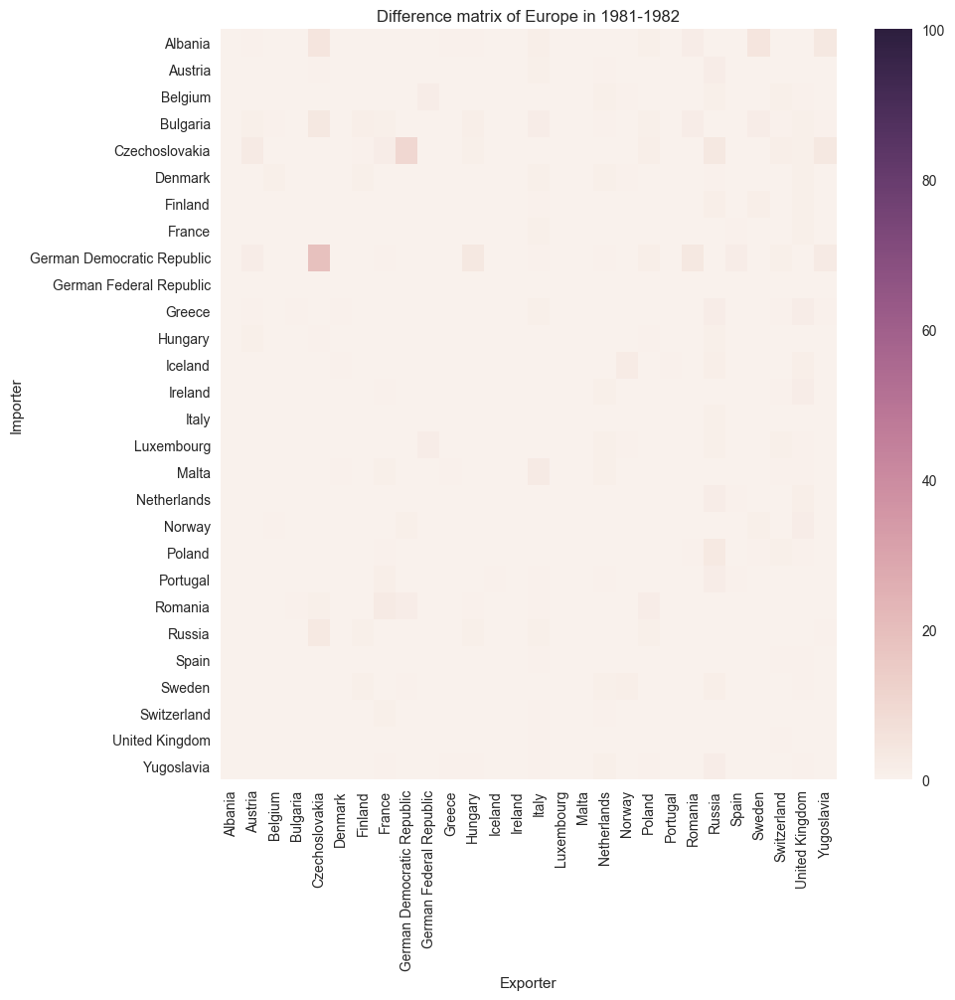

17.711531920122198


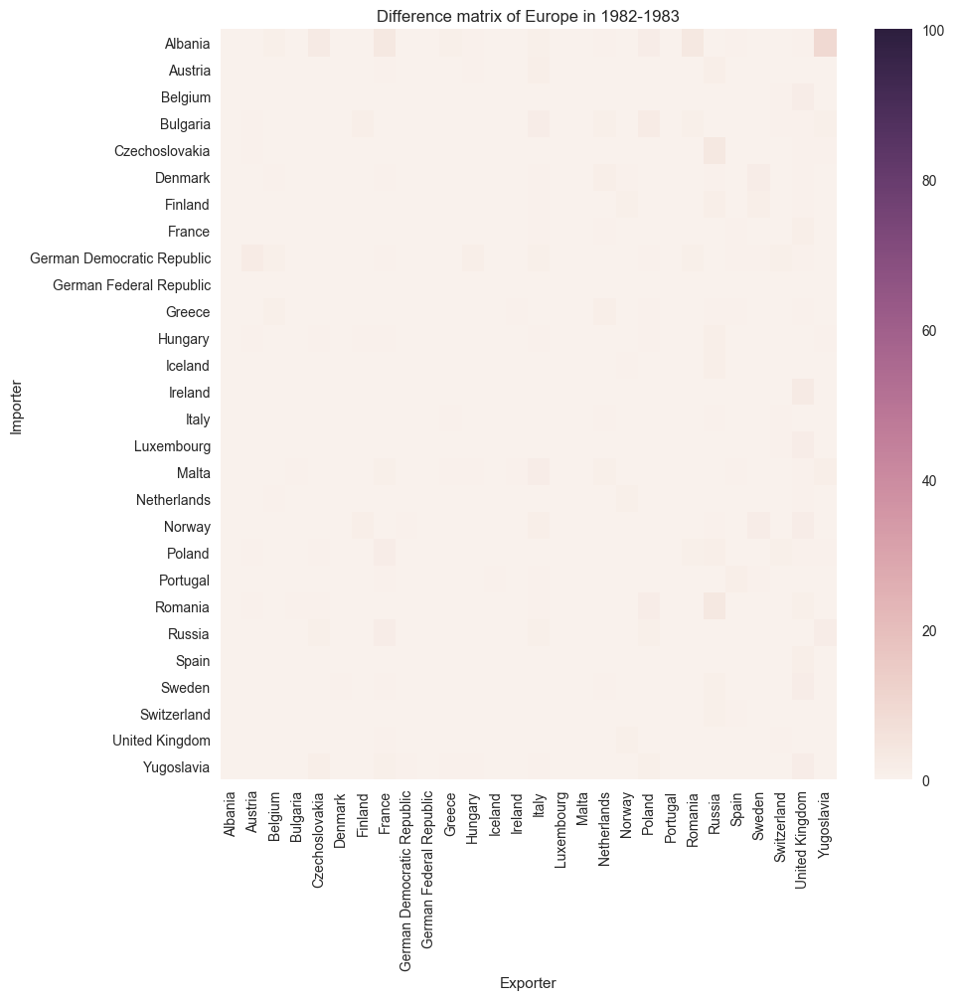

16.252168795064996


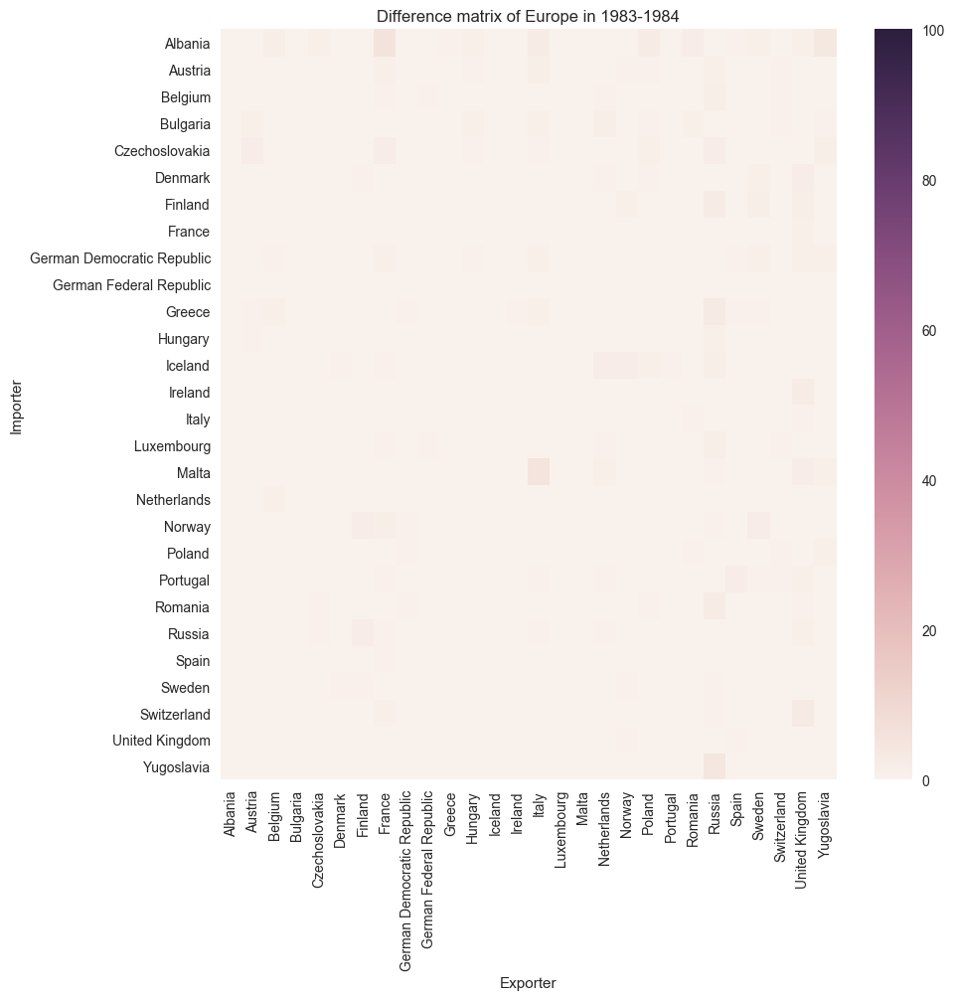

55.5630393451403


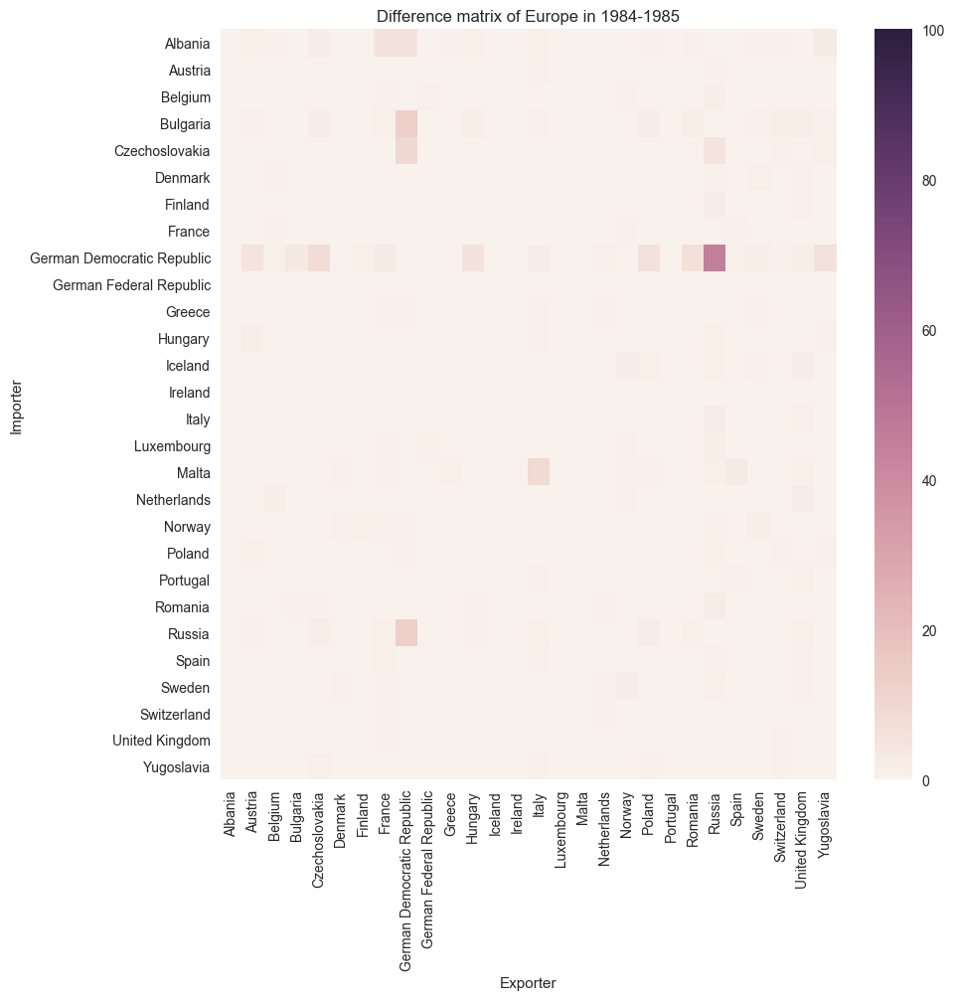

23.395740584726205


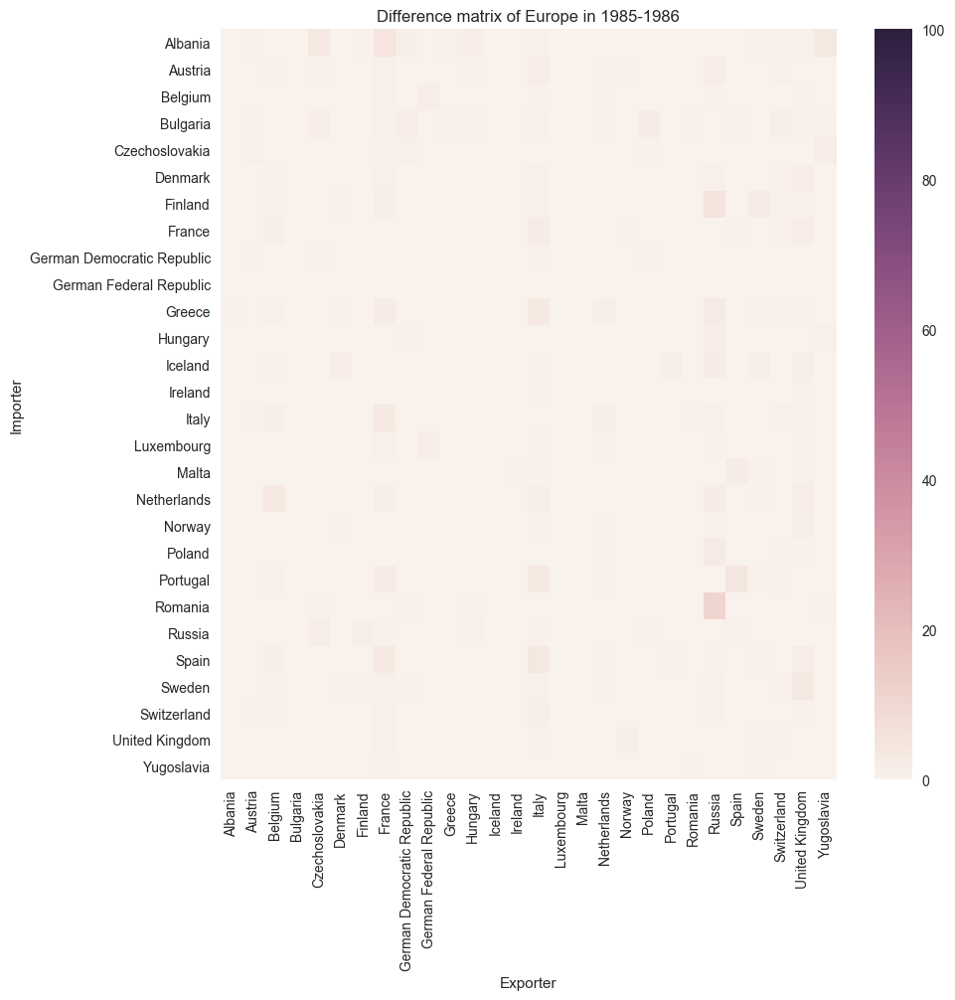

19.00493546928499


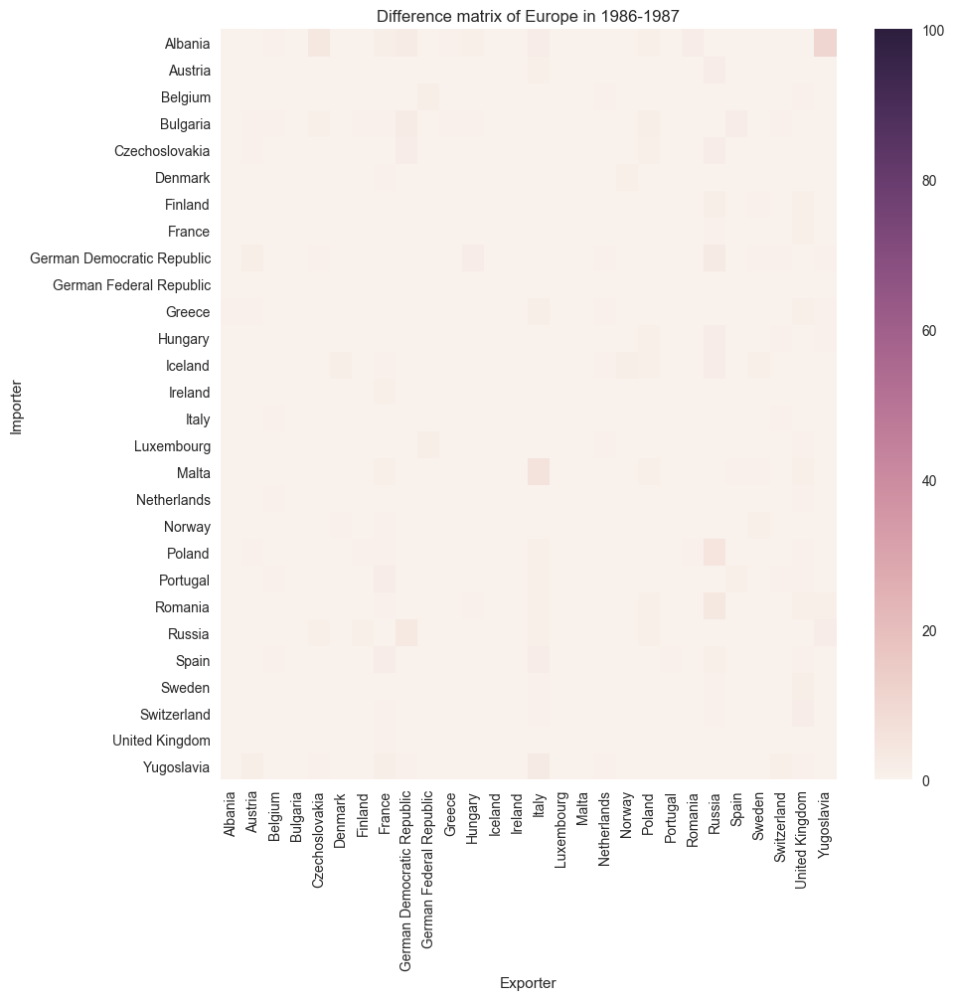

14.95693463714885


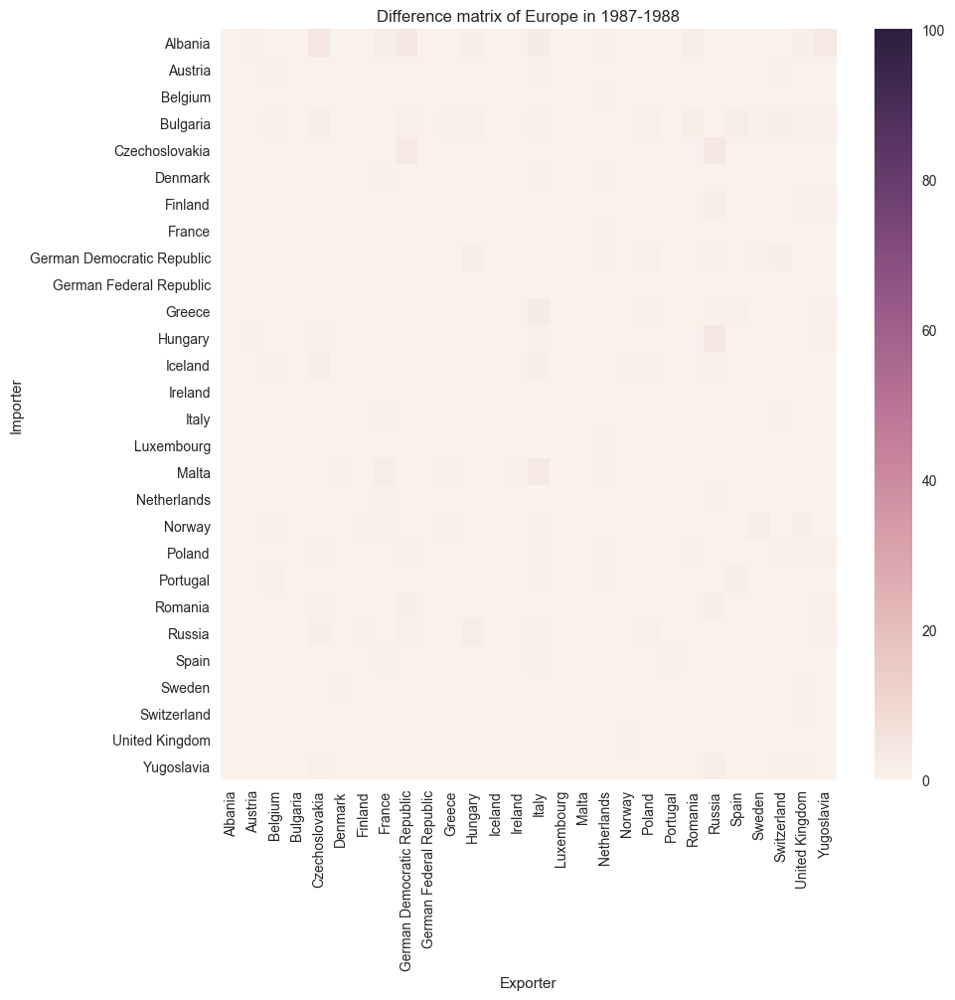

22.48724295428703


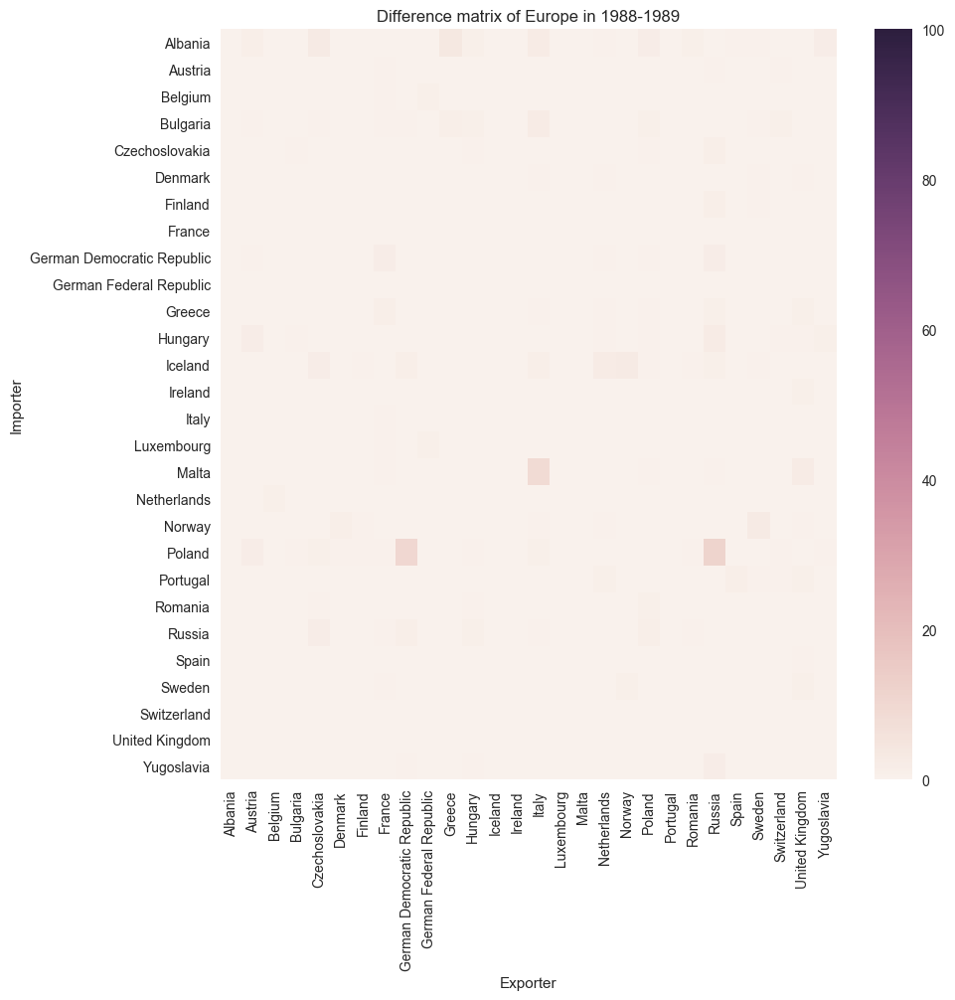

29.655038973331465


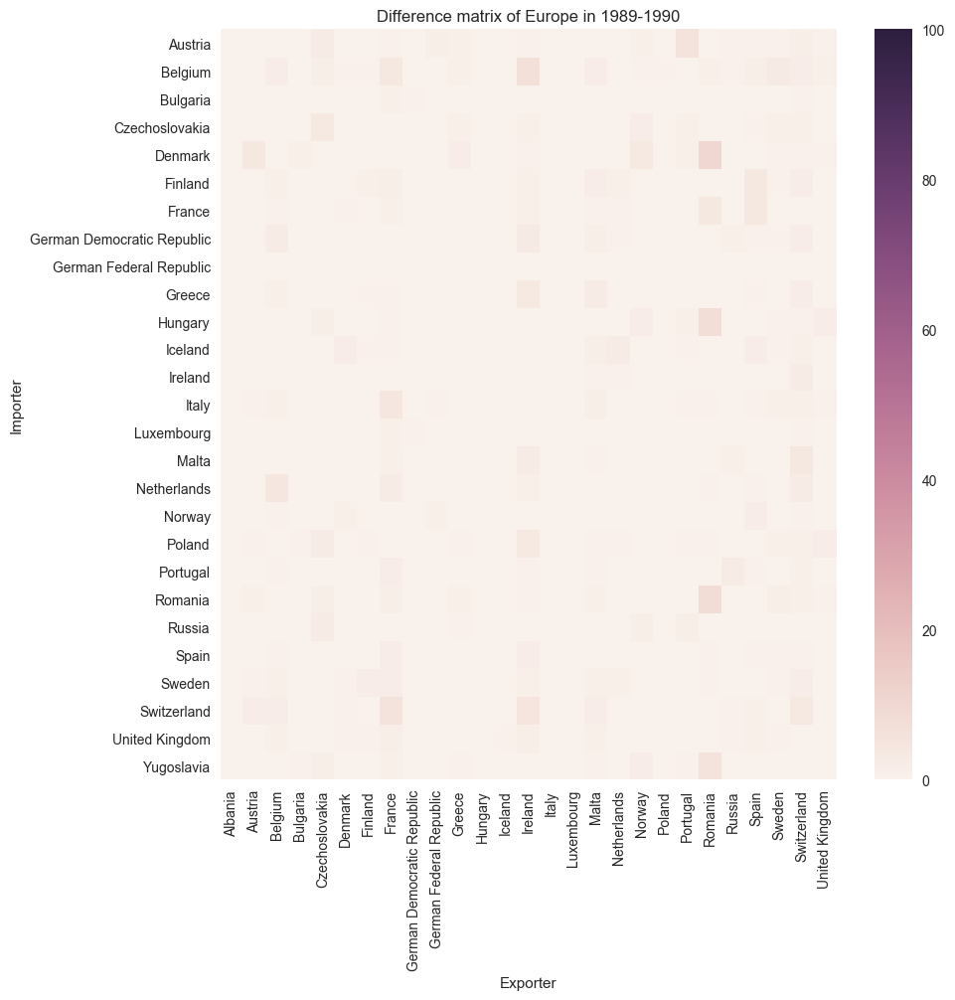

43.80217757563533


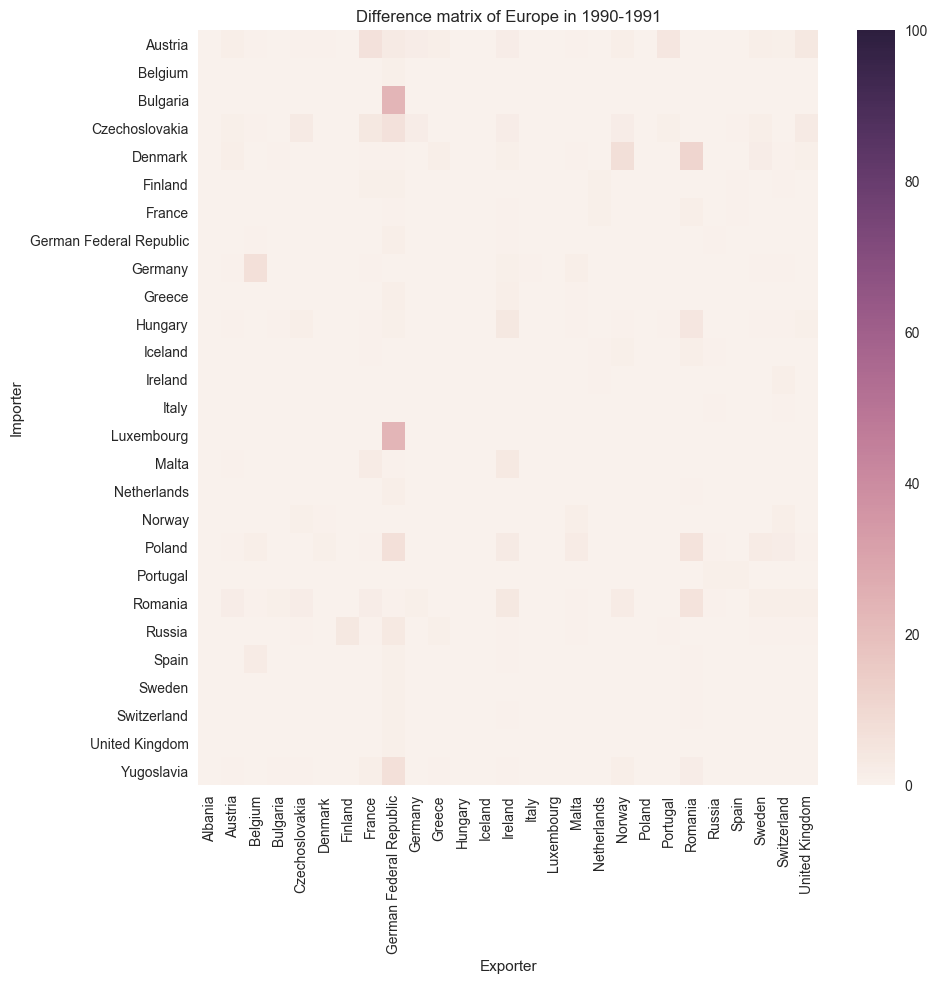

46.58921994903931


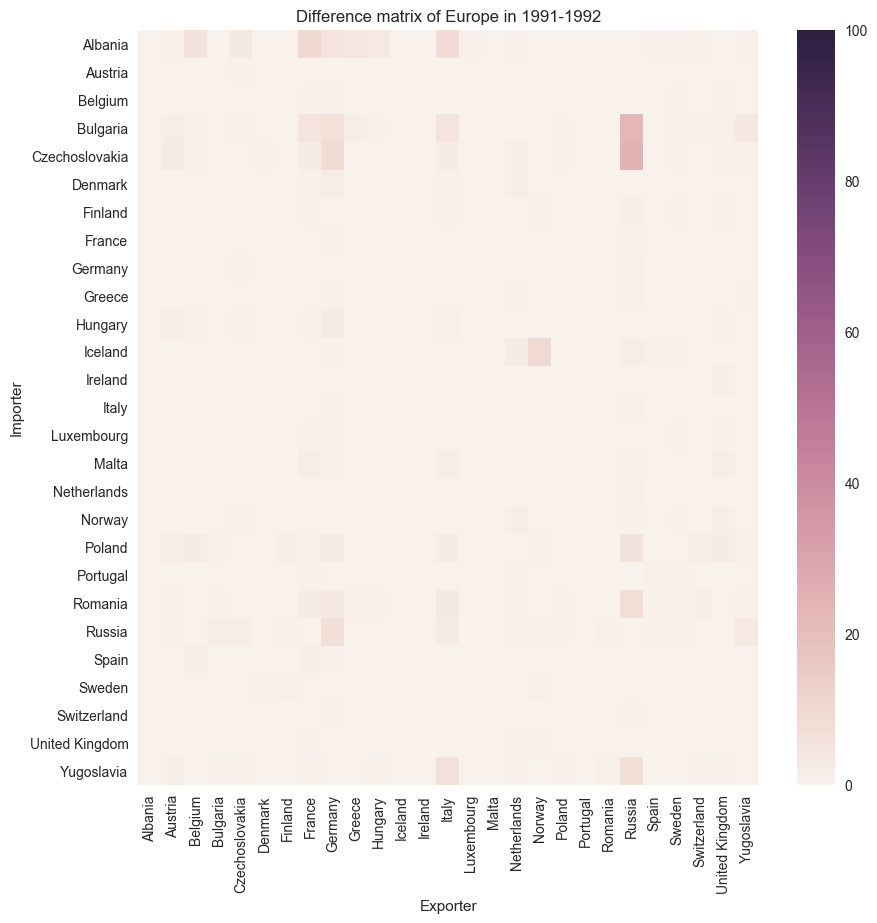

116.12544784000522


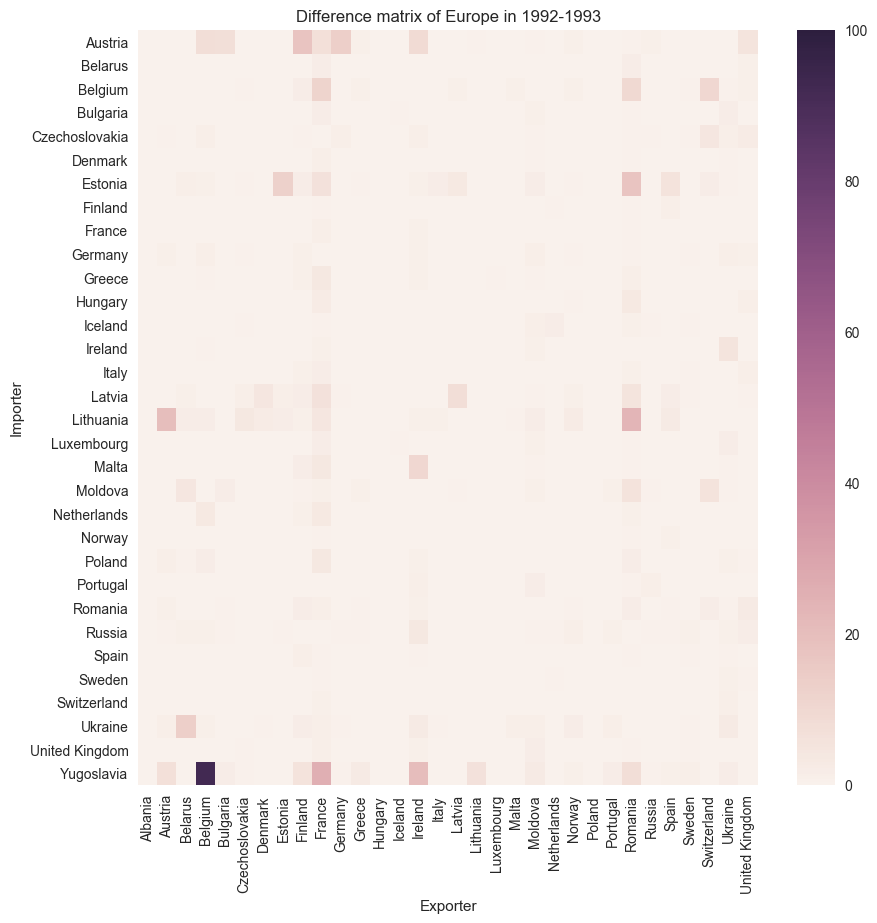

79.89259258135965


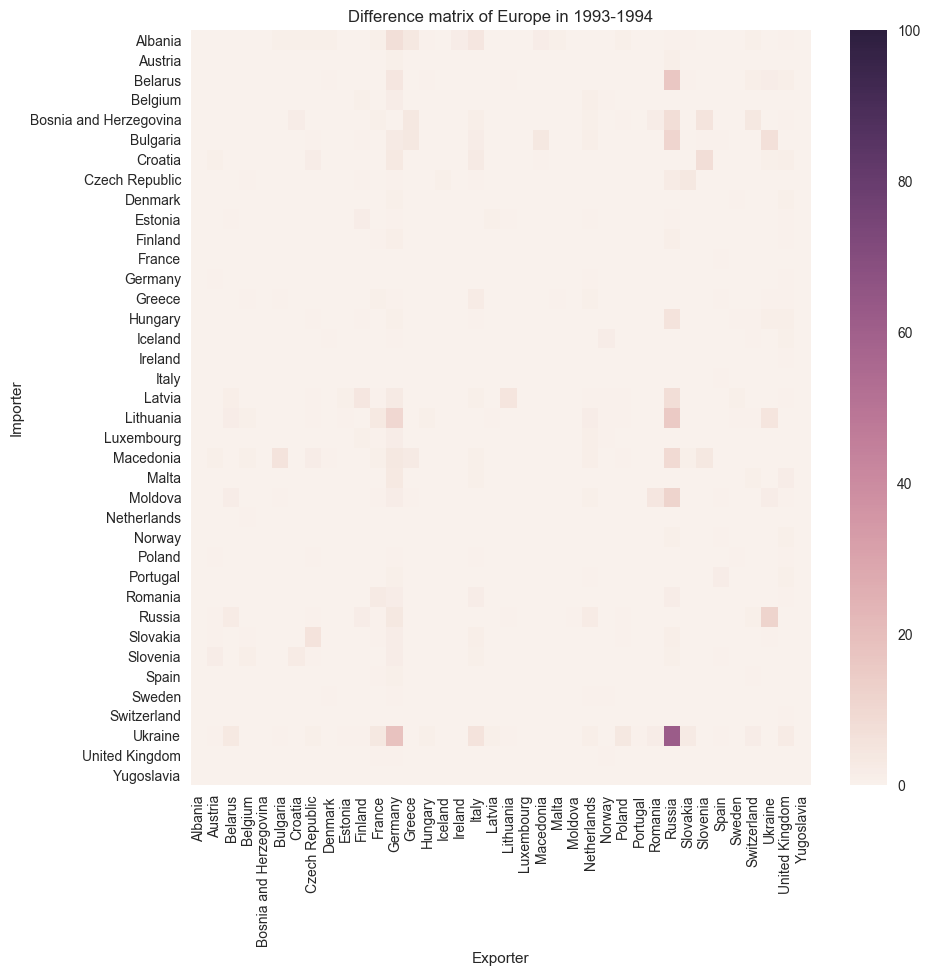

37.95202666858278


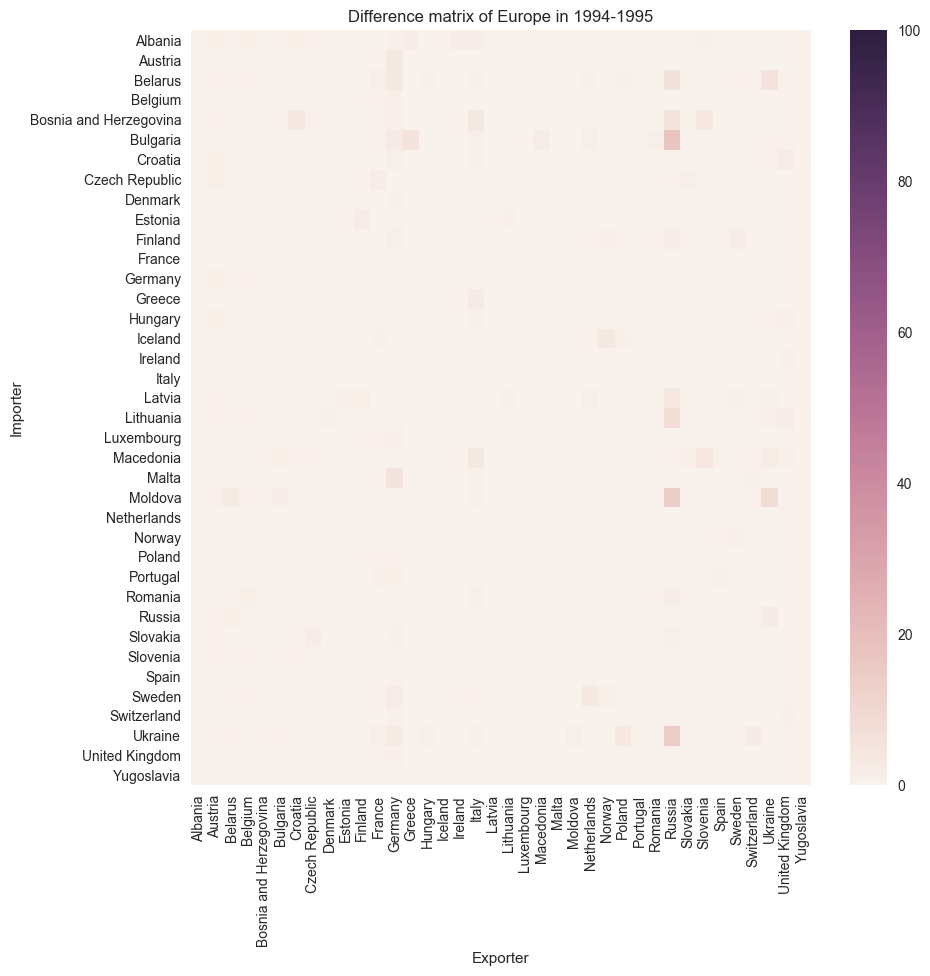

32.51363350307377


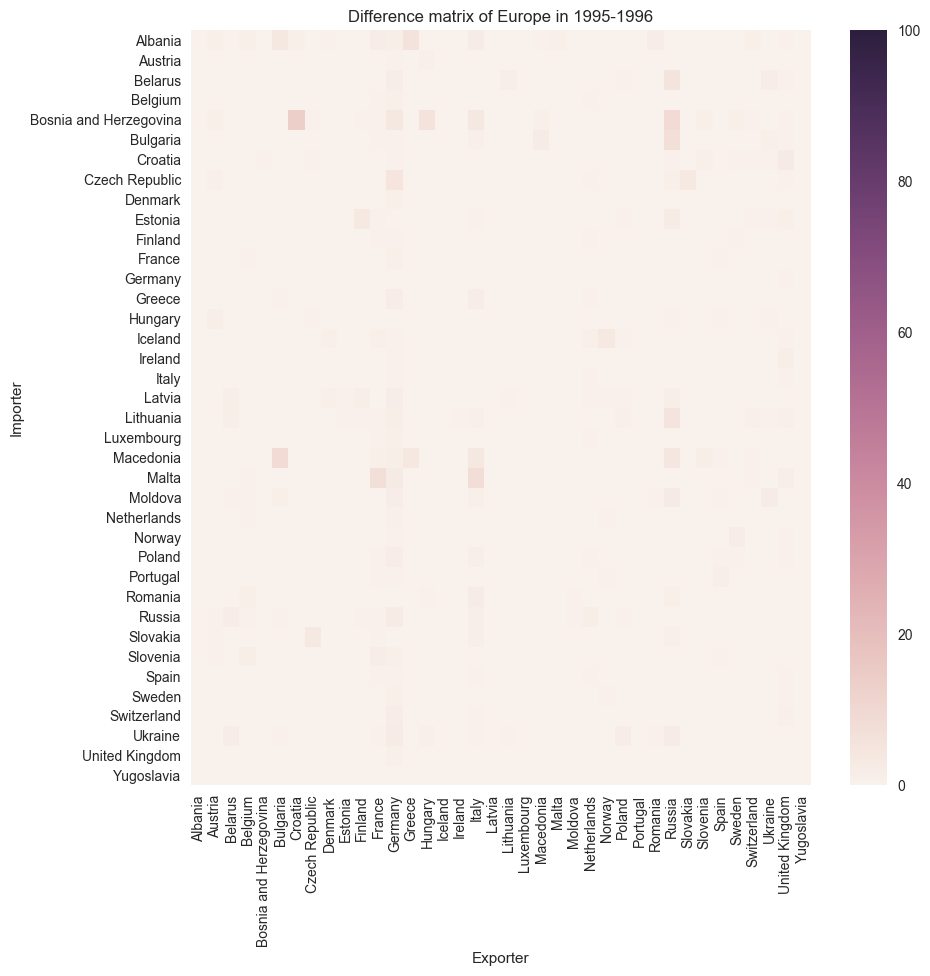

49.52669530337584


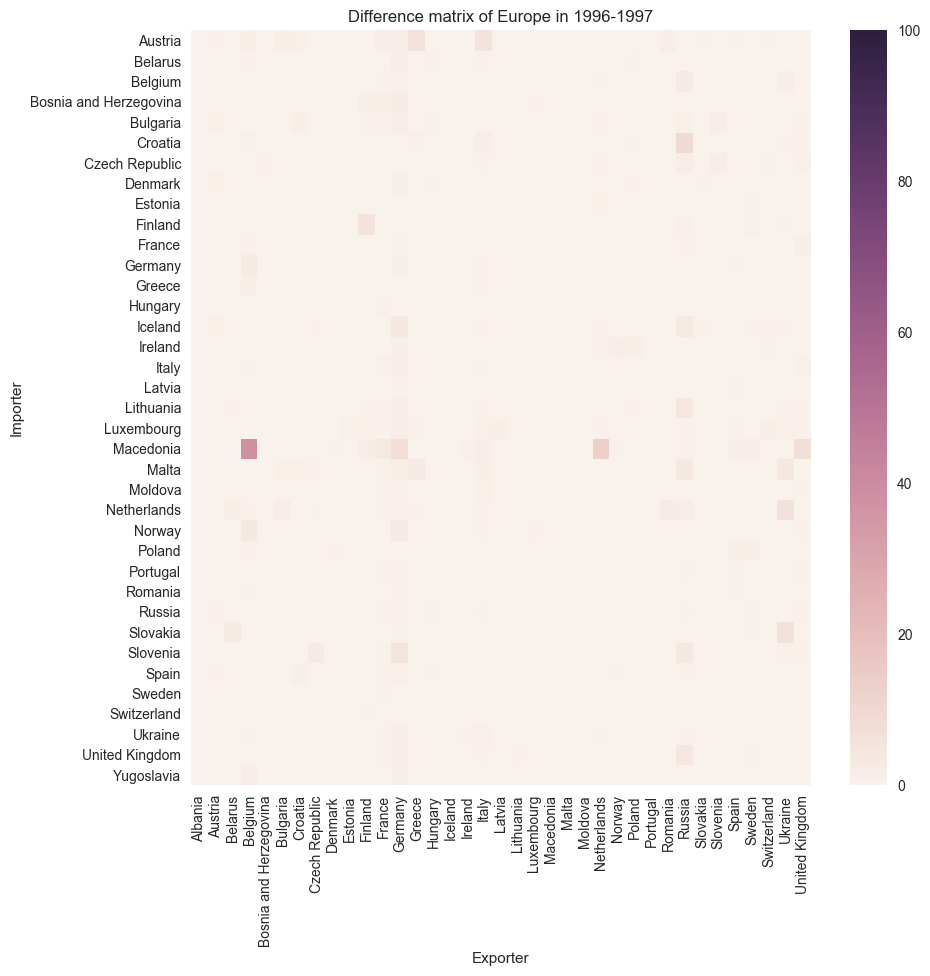

21.861642186277443


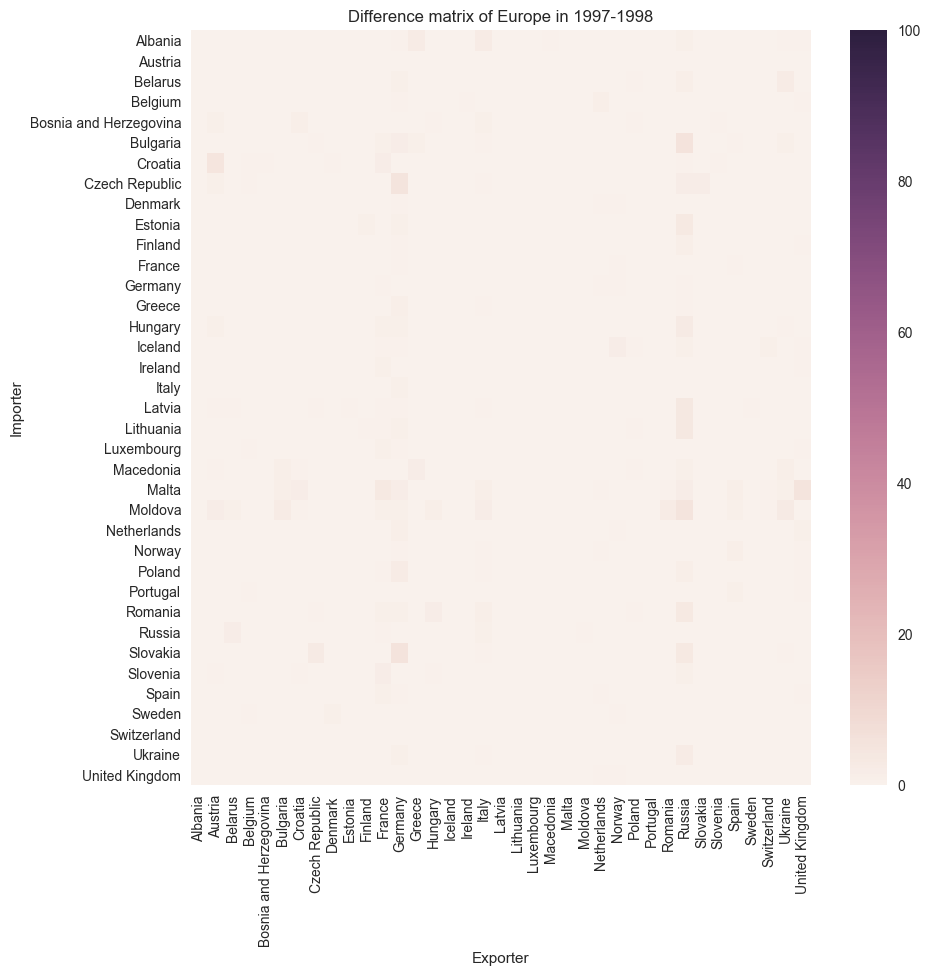

22.22977760425606


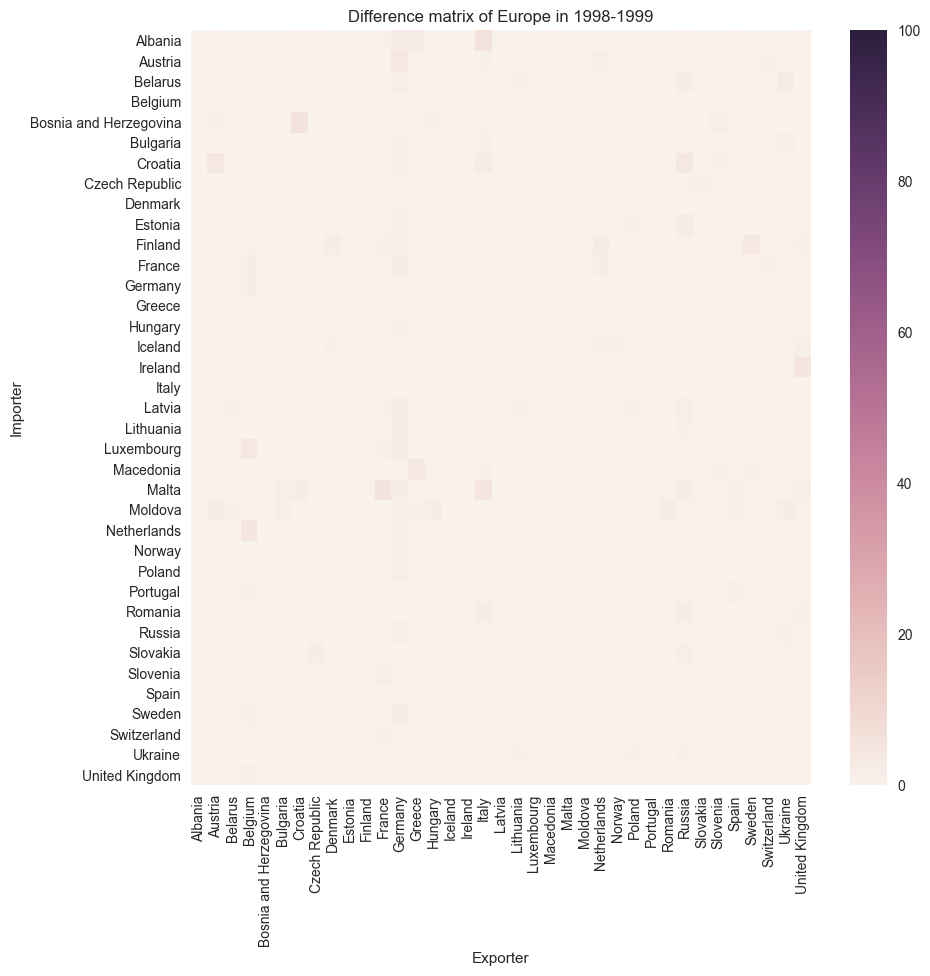

25.10178917936769


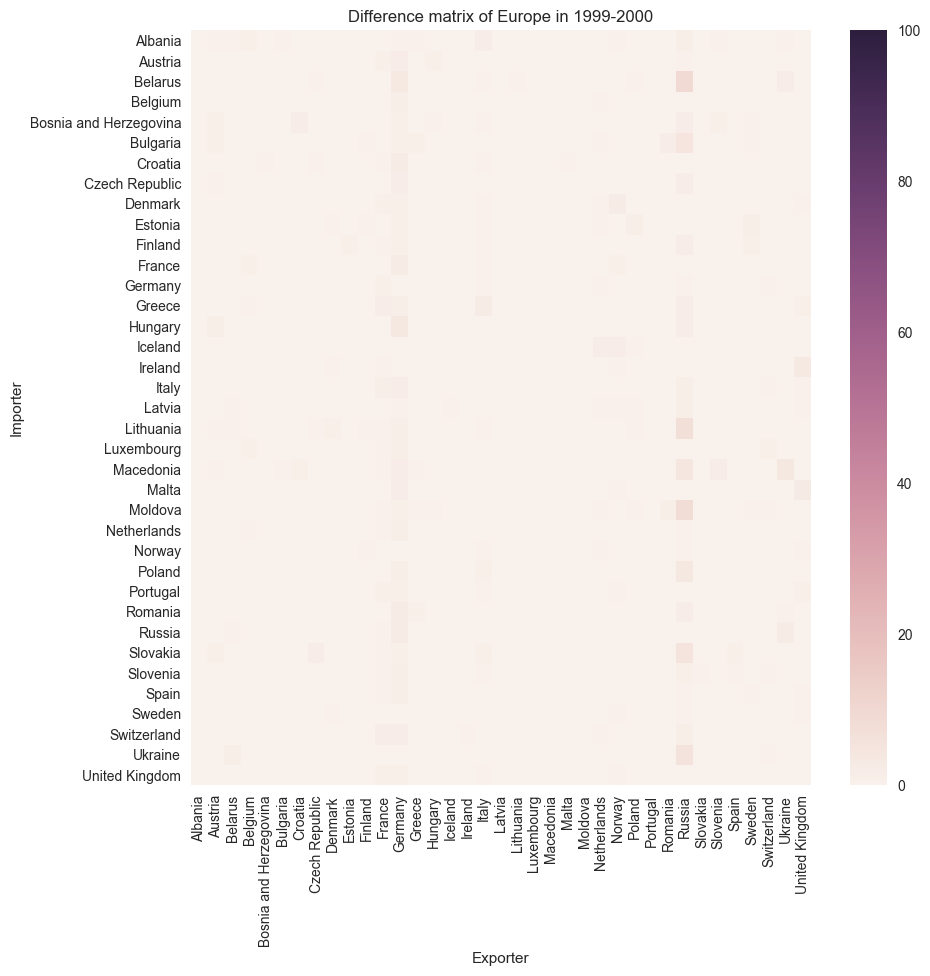

22.194551529837558


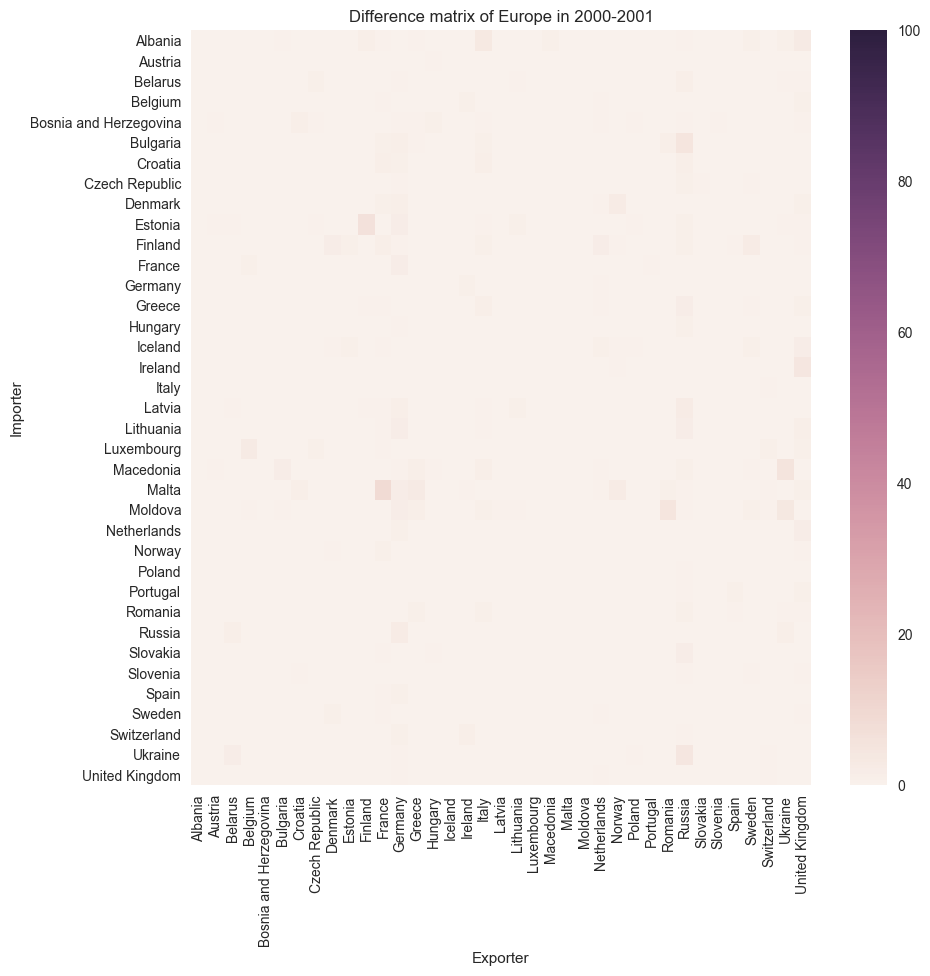

18.468031964652


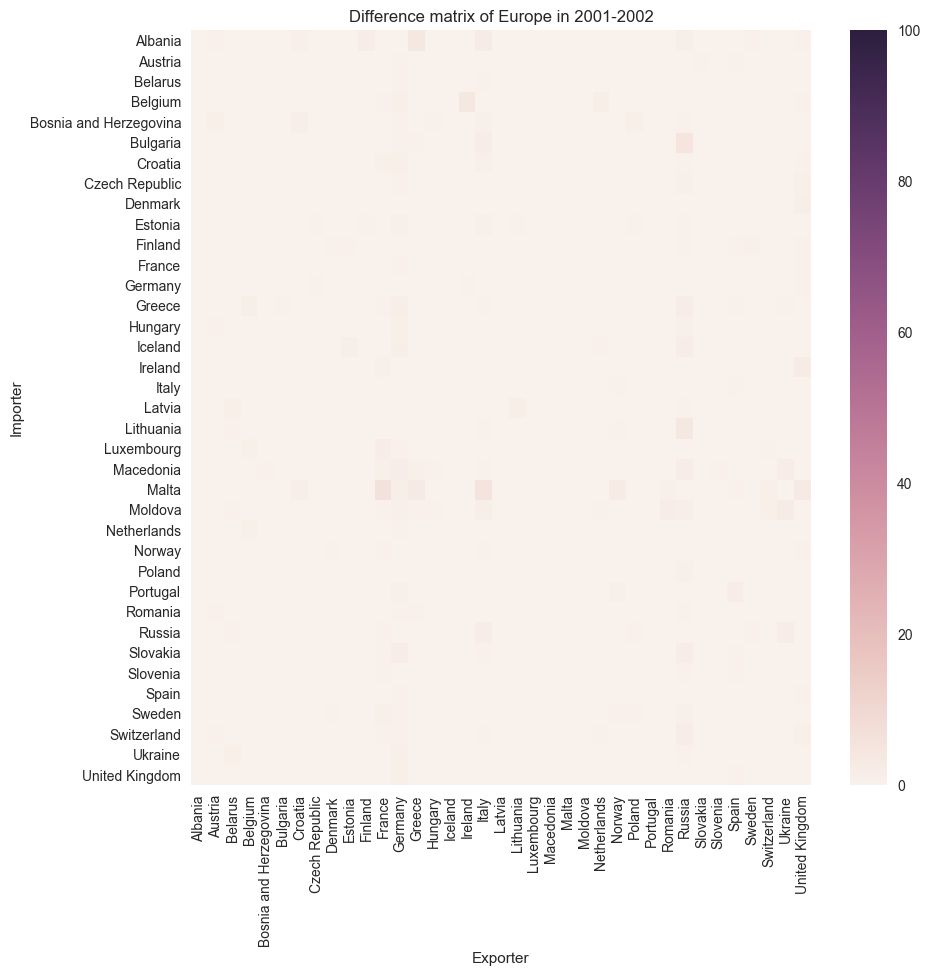

15.694503579625378


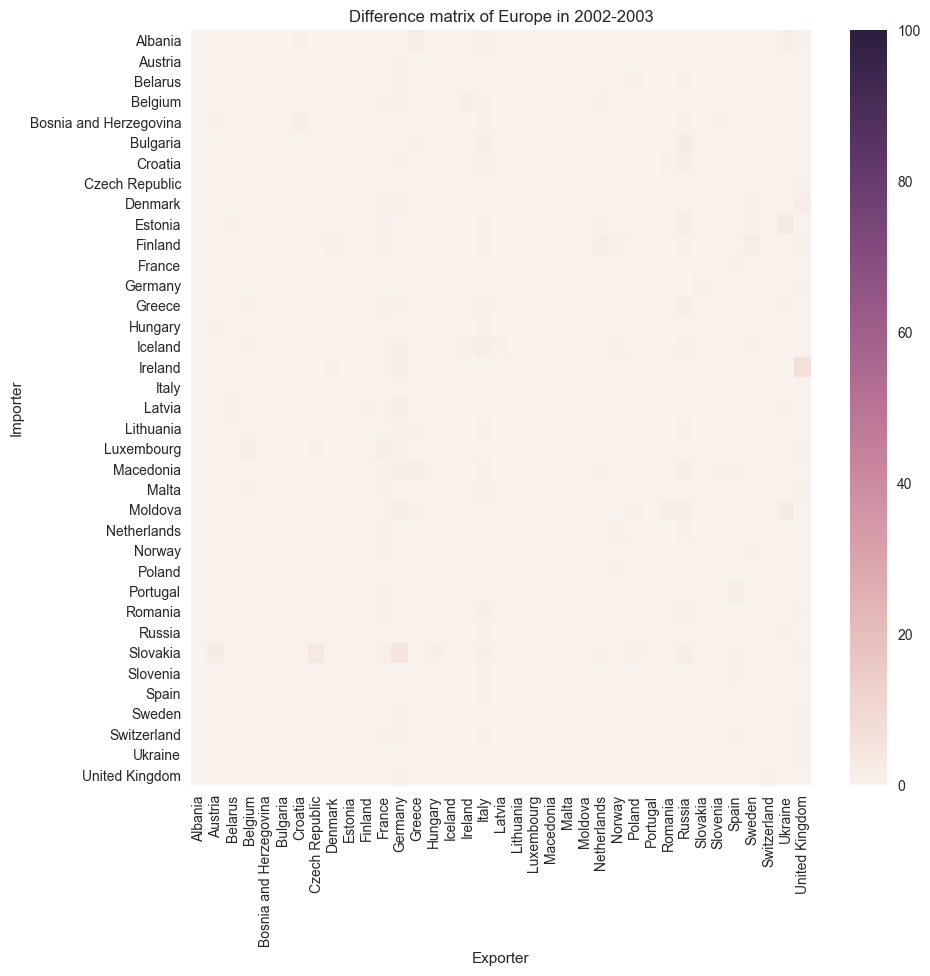

20.71806323306827


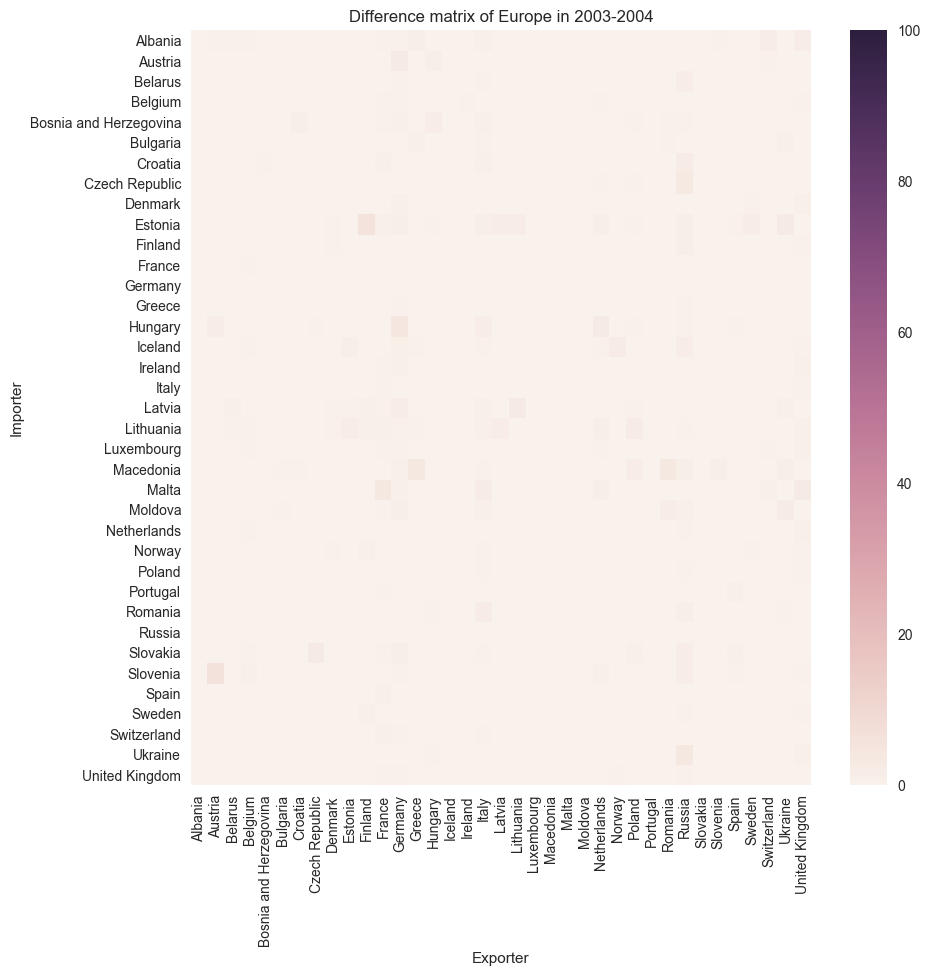

22.610103331290976


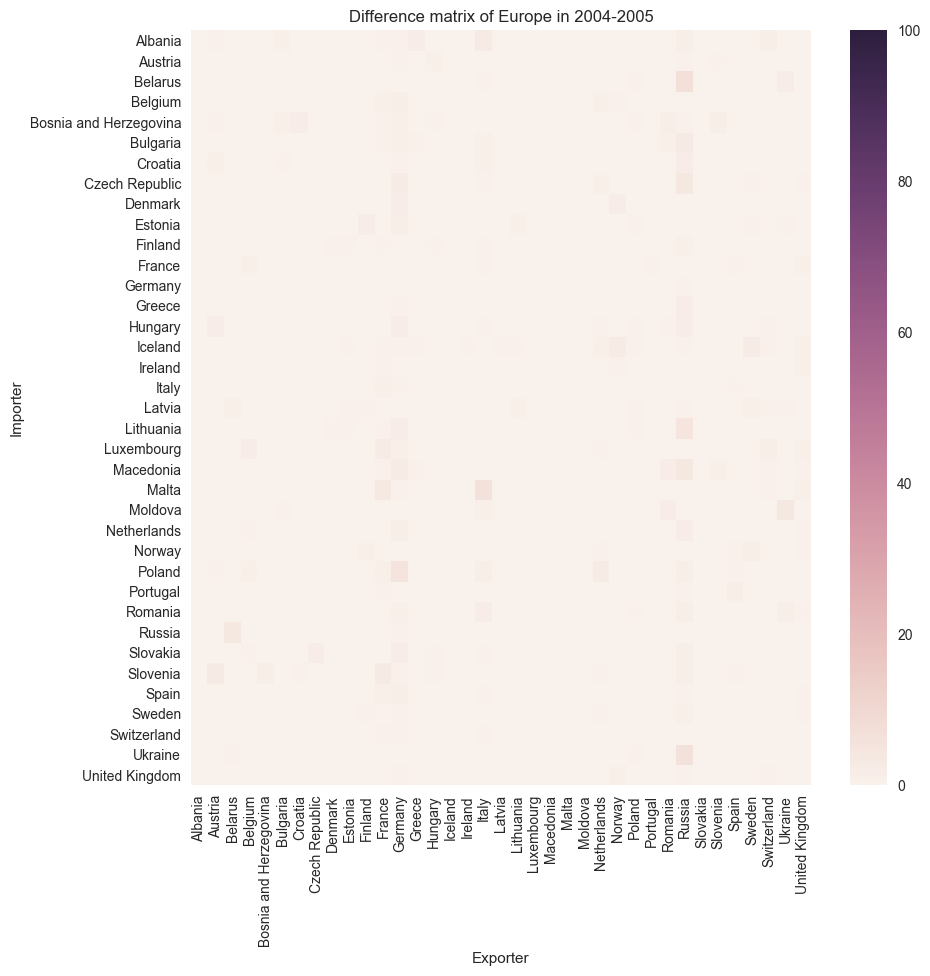

21.16178655653509


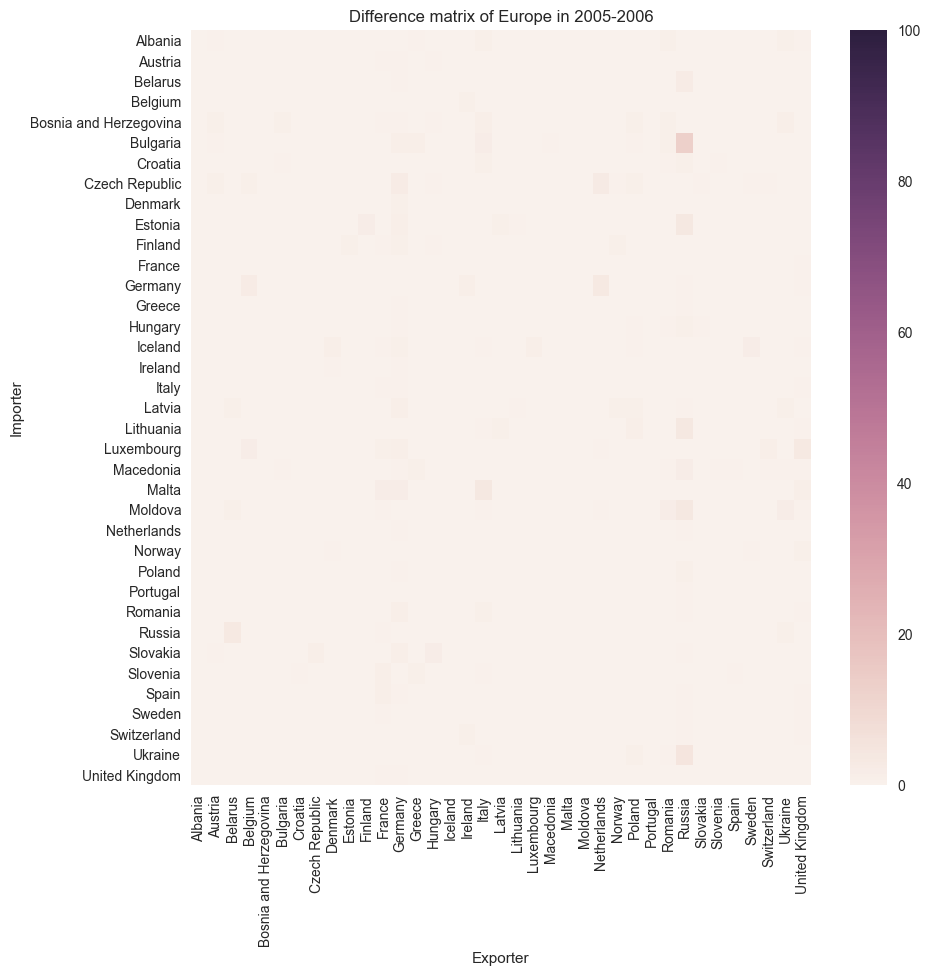

21.23333616371947


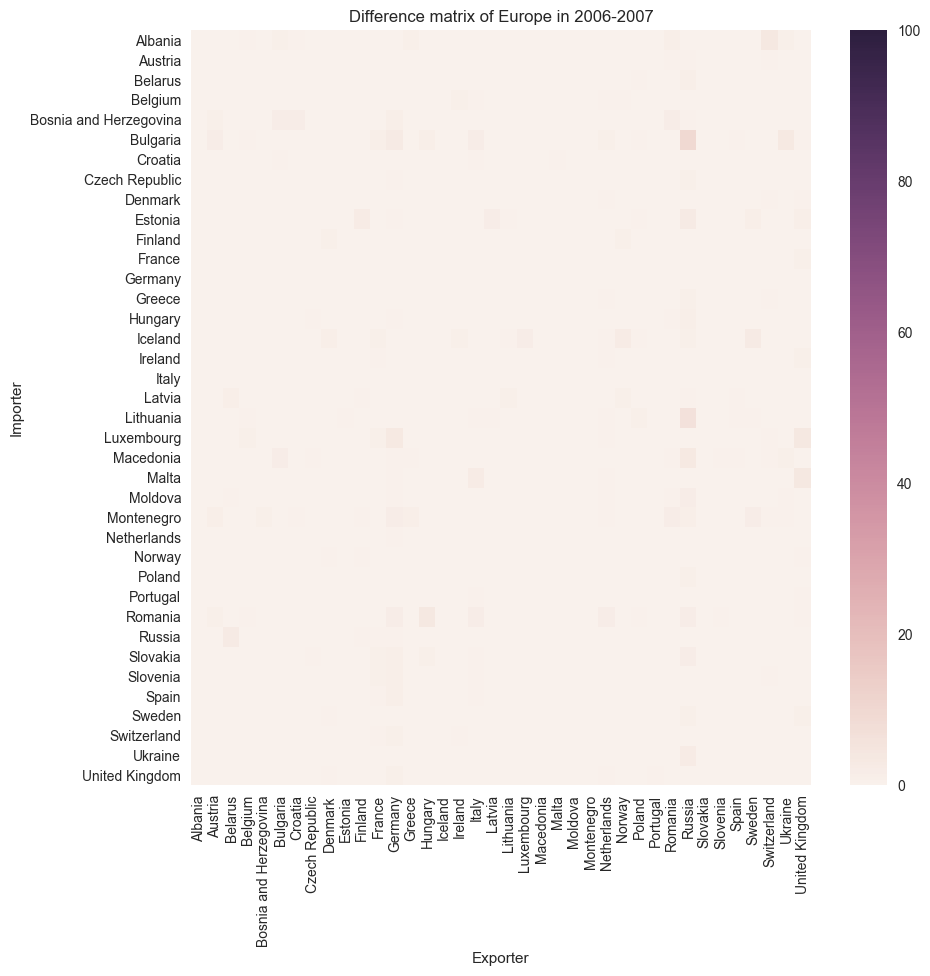

21.128644387553752


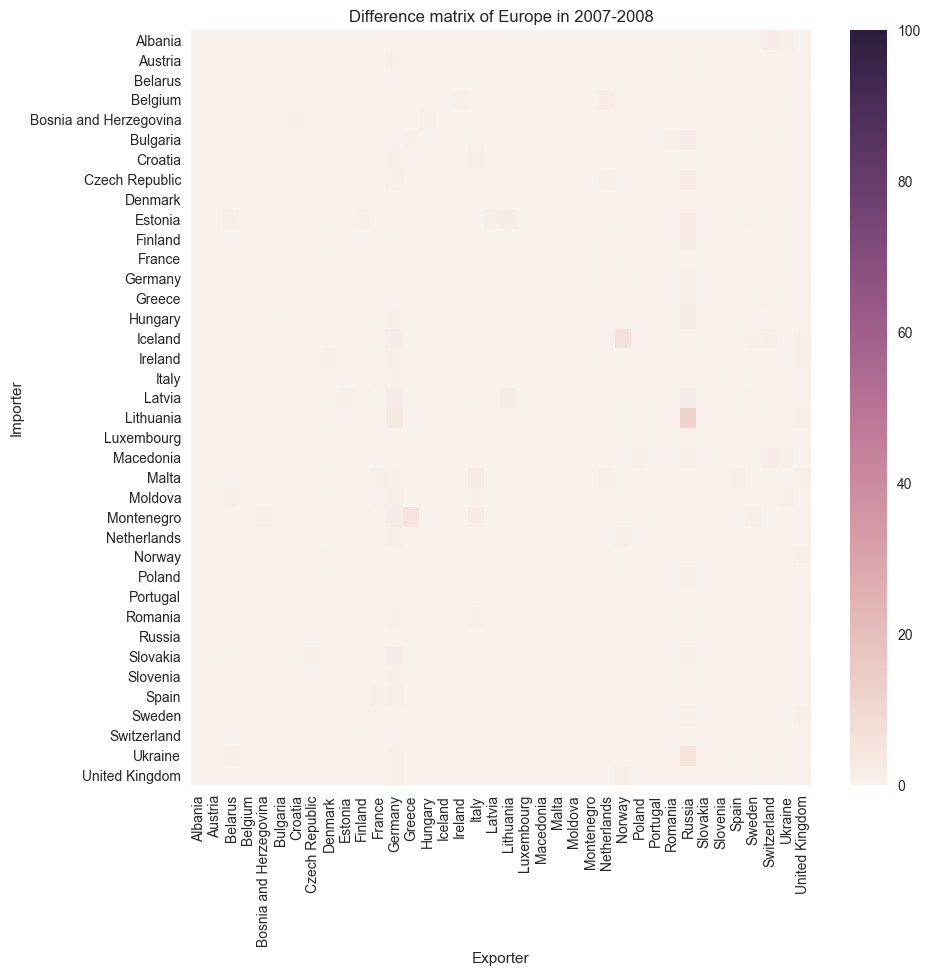

27.415544714777354


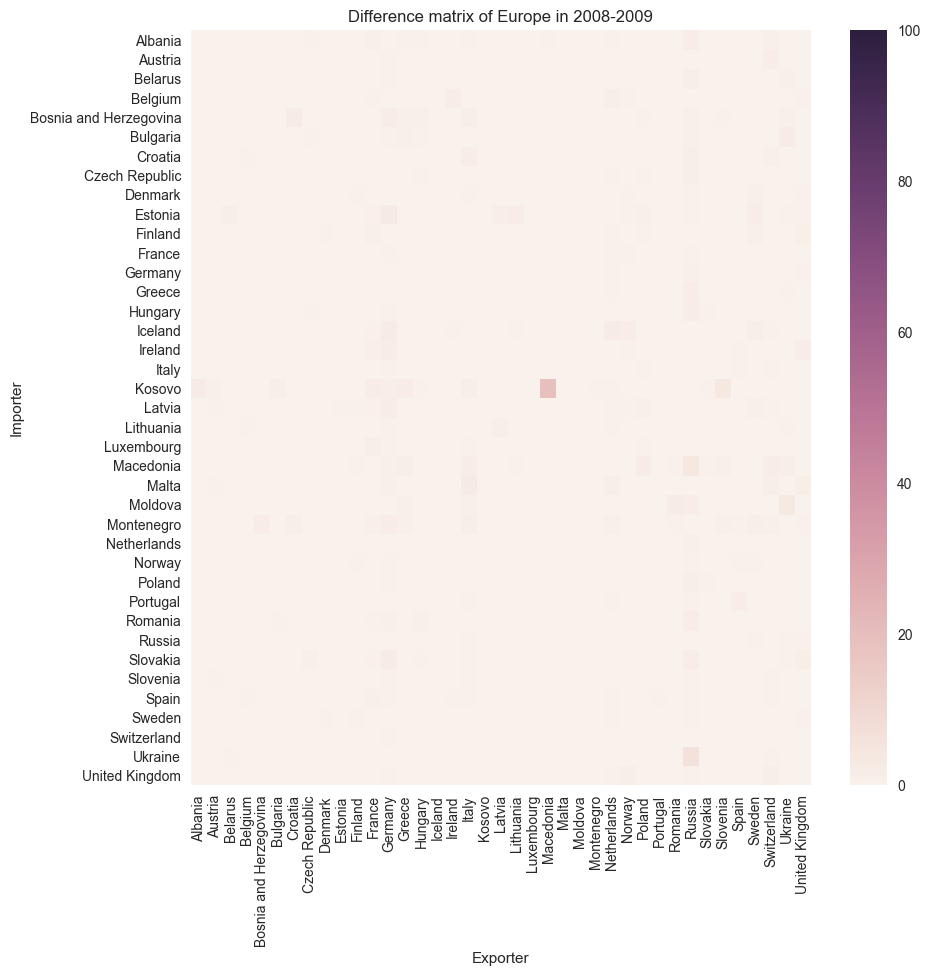

22.009622862086232


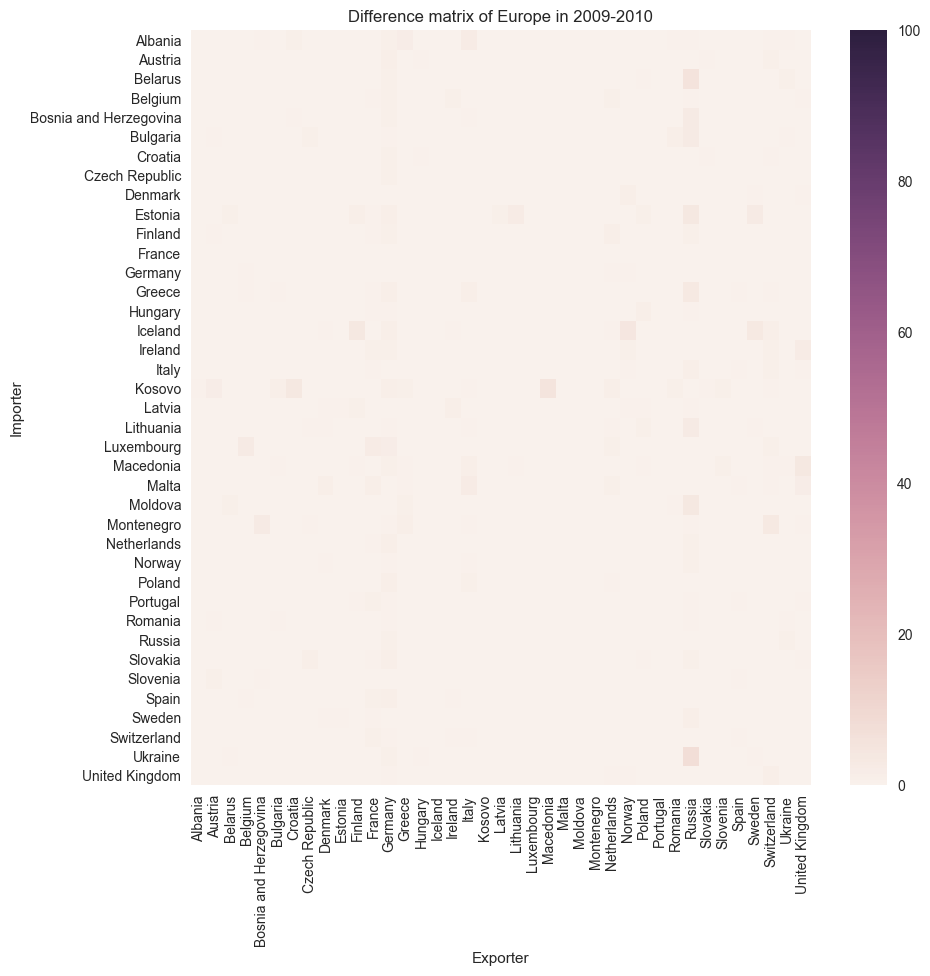

22.662867677708032


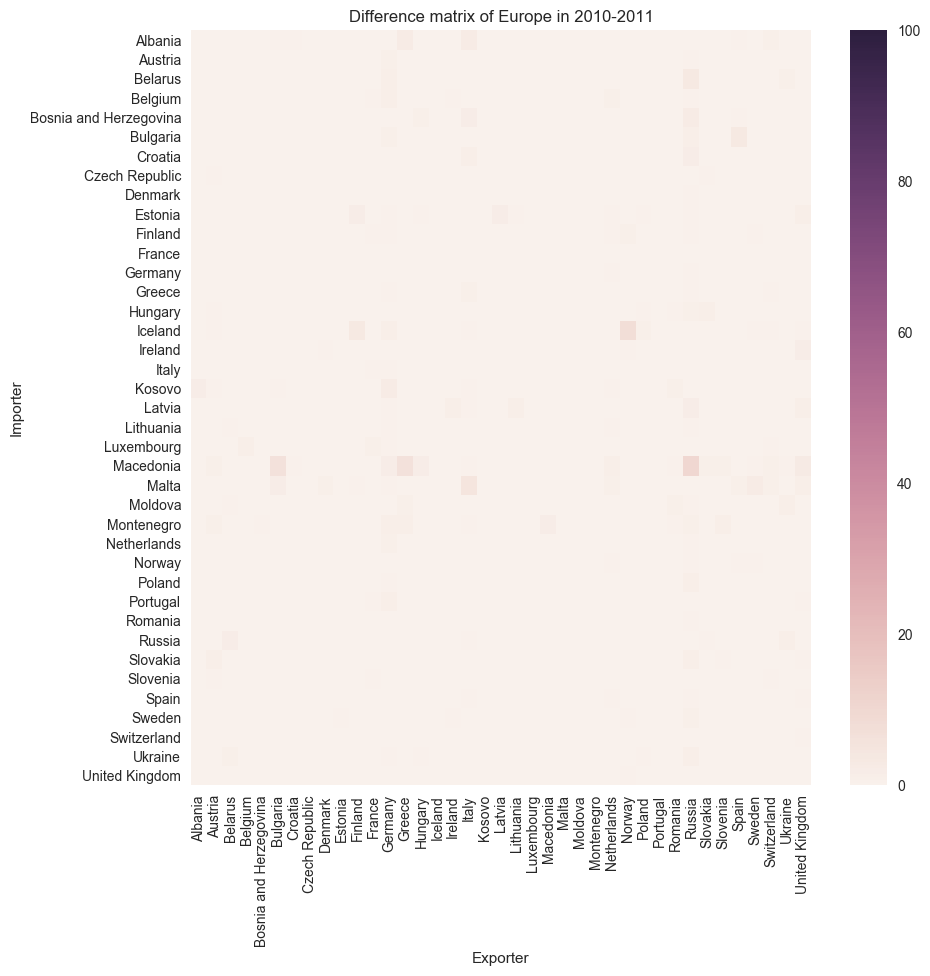

16.198698398573537


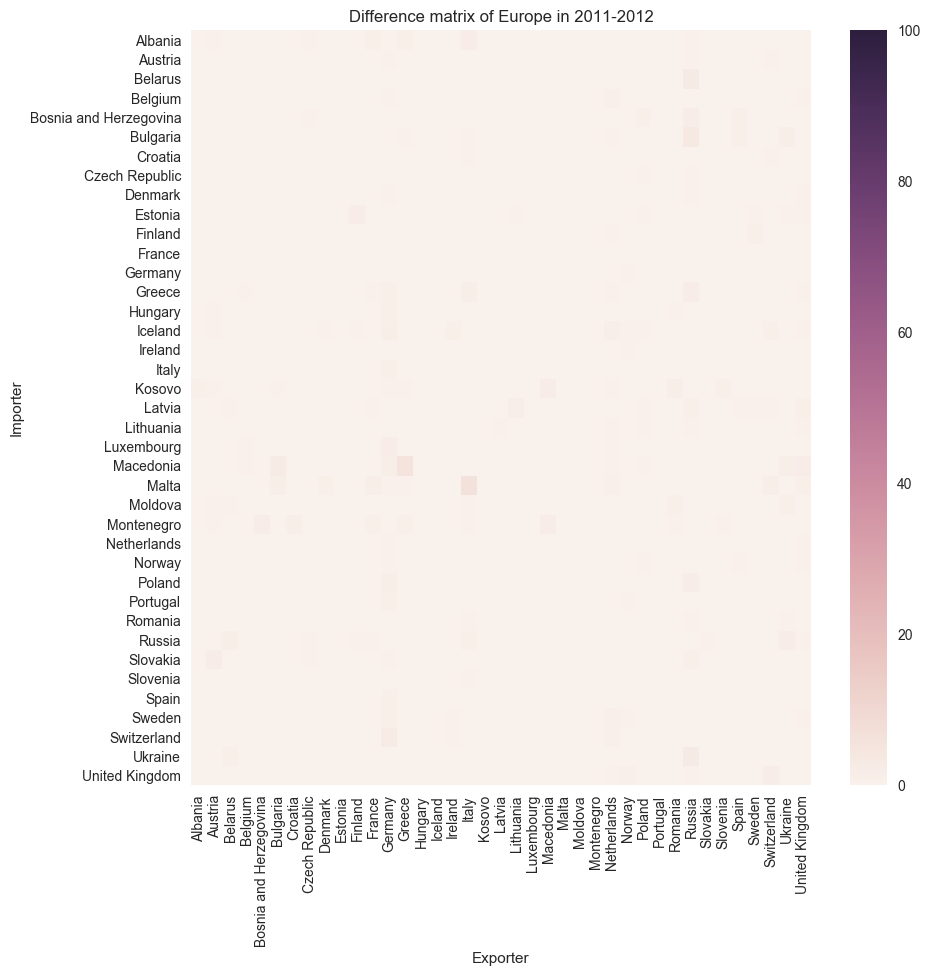

17.507979626881514


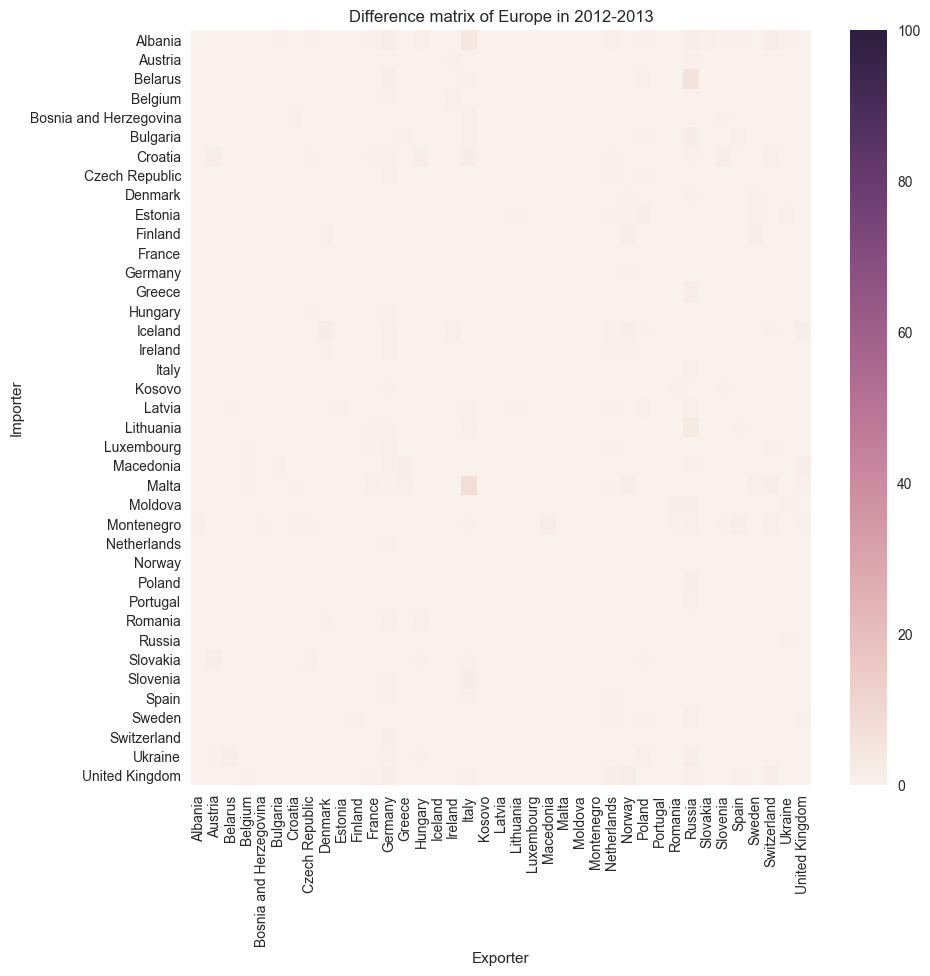

22.914450411254453


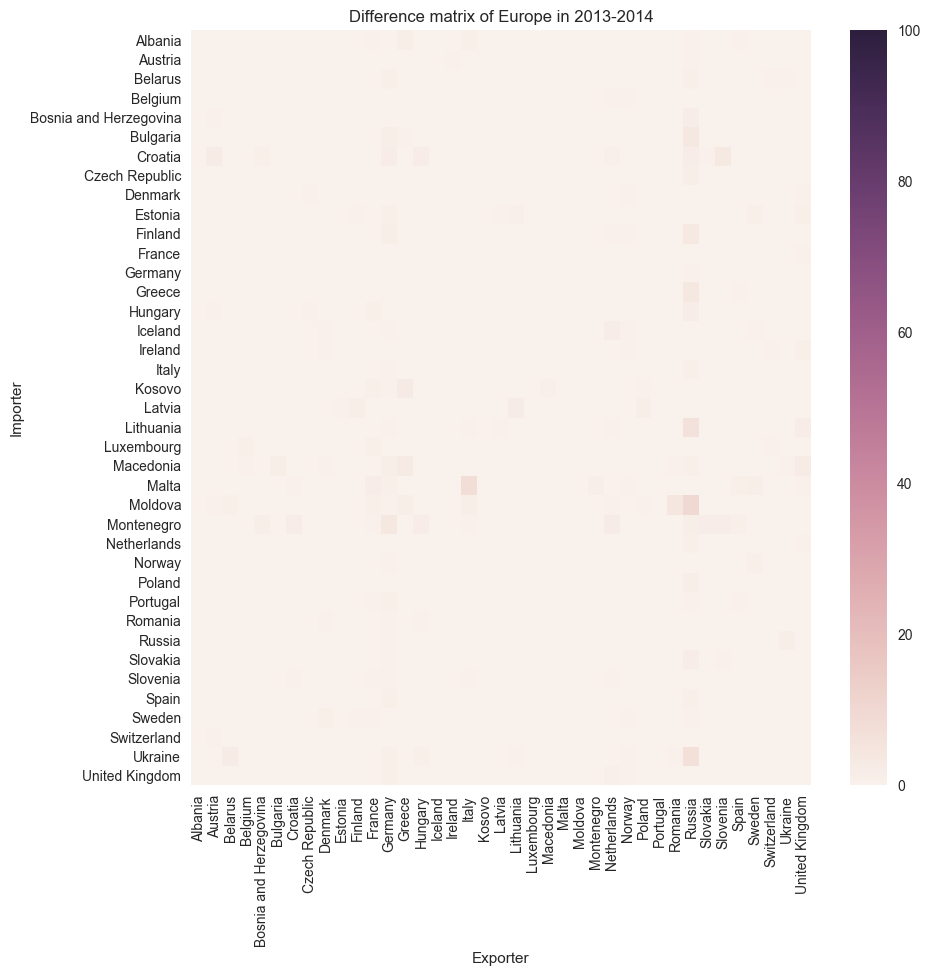

IndexError: list index out of range

In [33]:
continent = 'Europe'
for i, k in enumerate([l for l in range(1975,2015)]):
    loc = np.where(np.array(years)==k)[0][0]
    mat_1 = list_intensity_matrix[continent][loc]
    mat_2 = list_intensity_matrix[continent][loc+1]
    aligned_mat_1 = mat_1.align(mat_2, join='inner')[0].as_matrix()
    aligned_mat_2 = mat_1.align(mat_2, join='inner')[1].as_matrix()
    plt.figure(figsize=(10,10))
    df_inter = abs(aligned_mat_1-aligned_mat_2)
    print(np.linalg.norm(df_inter))
    sns.heatmap(df_inter, xticklabels = list_intensity_matrix_col[continent][loc],
               yticklabels = list_intensity_matrix_index[continent][loc], vmin=0, vmax=100)
    plt.title('Difference matrix of Europe in {}-{}'.format(k, k+1))
    plt.xlabel('Exporter')
    plt.ylabel('Importer')
    plt.show()

We can see that the change in the strucutre of the exchanges between 1984 and 1985 probably comes from the German Democratic Republic.

In [29]:
loc = np.where(np.array(years)==1984)[0][0]
demo_german_1984 = list_intensity_matrix['Europe'][loc].loc['German Democratic Republic', :]
demo_german_1985 = list_intensity_matrix['Europe'][loc+1].loc['German Democratic Republic', :]

NameError: name 'years' is not defined

In [109]:
geolocator = Nominatim()
# Get coordinated of countries
coordinates_countries = {}
for i in list(demo_german_1984.index):
    try:
        location = geolocator.geocode(i)
        coordinates_countries.update({i: (location.latitude, location.longitude)})
    except:
        coordinates_countries.update({i: ('lat not found', 'lon not found')})

In [110]:
coordinates_countries['United Kingdom'] = (53.067484, -2.650098)
coordinates_countries['Yugoslavia'] = (43.459501, 19.310925)
coordinates_countries['Czechoslovakia'] = (48.940088, 17.626917)
coordinates_countries['Russia'] = (54.655063, 35.882270)

In [137]:
# 1984
demo_german_1984 = pd.DataFrame(demo_german_1984).reset_index()
demo_german_1984['lat'] = [j[0] for j in list(map(coordinates_countries.get, demo_german_1984.Country_B))]
demo_german_1984['lon'] = [j[1] for j in list(map(coordinates_countries.get, demo_german_1984.Country_B))]
demo_german_1984.columns = ['Exporter', 'Flow', 'lat', 'lon']
demo_german_1984['text'] = demo_german_1984.apply(lambda x: str(np.round(x['Flow'], 2)) + '% of GRD imports comes from ' + x['Exporter'], axis = 1)

# 1985
demo_german_1985 = pd.DataFrame(demo_german_1985).reset_index()
demo_german_1985['lat'] = [j[0] for j in list(map(coordinates_countries.get, demo_german_1985.Country_B))]
demo_german_1985['lon'] = [j[1] for j in list(map(coordinates_countries.get, demo_german_1985.Country_B))]
demo_german_1985.columns = ['Exporter', 'Flow', 'lat', 'lon']
demo_german_1985['text'] = demo_german_1985.apply(lambda x: str(np.round(x['Flow'], 2)) + '% of GRD imports comes from ' + x['Exporter'], axis = 1)

In [142]:
# Map in 1984
data = [ dict(
        type = 'scattergeo',
        lon = demo_german_1984['lon'],
        lat = demo_german_1984['lat'],
        text = demo_german_1984['text'],
        mode = 'markers',
        marker = dict(
            size = demo_german_1984['Flow'],
            opacity = 1,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            color='red'
        ))]

layout = dict(
        title = 'Exportater of German Democratic Republic in 1984',
        colorbar = True,
        geo = dict(
            scope = 'europe',
            projection=dict( type='mollweide' ),
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )

fig = dict( data=data, layout=layout )
plotly.offline.iplot( fig, validate=False)

In [141]:
# Map in 1984
data = [ dict(
        type = 'scattergeo',
        lon = demo_german_1985['lon'],
        lat = demo_german_1985['lat'],
        text = demo_german_1985['text'],
        mode = 'markers',
        marker = dict(
            size = demo_german_1985['Flow'],
            opacity = 1,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            color='red'
        ))]

layout = dict(
        title = 'Exportater of German Democratic Republic in 1985',
        colorbar = True,
        geo = dict(
            scope = 'europe',
            projection=dict( type='mollweide' ),
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )

fig = dict( data=data, layout=layout )
plotly.offline.iplot( fig, validate=False)

In [148]:
for k in range(1980,2000):
    try:
        loc = np.where(np.array(years)==k)[0][0]
        df_inter = list_intensity_matrix['Europe'][loc].loc['German Democratic Republic', 'Russia']
        print('In {}, the imports of GDR from Russia were {}'.format(k, np.round(df_inter.sum(), 2)))
    except:
        continue

In 1980, the imports of GDR from Russia were 0.0
In 1981, the imports of GDR from Russia were 0.0
In 1982, the imports of GDR from Russia were 0.0
In 1983, the imports of GDR from Russia were 0.0
In 1984, the imports of GDR from Russia were 0.0
In 1985, the imports of GDR from Russia were 45.27
In 1986, the imports of GDR from Russia were 45.45
In 1987, the imports of GDR from Russia were 42.63
In 1988, the imports of GDR from Russia were 41.82
In 1989, the imports of GDR from Russia were 39.52


Again here, the spike in 1984-1985 doesn't come from a real change in the network's structure, but from the fact that GDR and Russia started to be transparent regarding their exchanges.

## Anomaly detection with Wasserstein Distance

In [30]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
data.head()

,year,importer1,importer2,flow1,flow2
0,1920,United States of America,Canada,611.85999,735.47998
1,1921,United States of America,Canada,335.44000,442.98999
2,1922,United States of America,Canada,364.01999,502.84000
3,1923,United States of America,Canada,416.00000,598.14001
4,1924,United States of America,Canada,399.14001,496.32001


In [31]:
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_1['key'] = data_flow_1['Country_A'] + '-' + data_flow_1['Country_B']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
data_flow_2['key'] = data_flow_2['Country_B'] + '-' + data_flow_2['Country_A']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
# drop nan
df = df.dropna()
# We keep years from 1950
df = df[df.year>=1950].reset_index(drop=True)

In [32]:
# This gives us the proportion of importation of Country_A from Country_B at for each yer
df['prop world flow'] = df['flow'] / df.groupby(['year'])['flow'].transform(sum) *100
# drop nan
df = df.dropna().reset_index(drop=True)

### World trade Analysis 

In [33]:
from scipy.stats import wasserstein_distance

In [34]:
world_distance_wass = pd.DataFrame(np.zeros((3,len(df['year'].unique()[1:].tolist()))),
                                   columns = df['year'].unique()[1:].tolist())

In [35]:
for y, year in enumerate(df['year'].unique()[1:]):
    world_distance_wass.iloc[0, y] =  wasserstein_distance(df[df['year']==year].groupby(['Country_A'])['prop world flow'].sum().values,
                                                           df[df['year']==(year-1)].groupby(['Country_A'])['prop world flow'].sum().values)

In [36]:
window_size = 15
world_distance_wass.iloc[1,] = pd.Series(world_distance_wass.iloc[0,]).rolling(window=window_size).mean() + 2*pd.Series(world_distance_wass.iloc[0,]).rolling(window=window_size).std()
world_distance_wass.iloc[2,] = pd.Series(world_distance_wass.iloc[0,]).rolling(window=window_size).mean() - 2*pd.Series(world_distance_wass.iloc[0,]).rolling(window=window_size).std()
world_distance_wass.reindex(labels = ['Wassersetein of world trade distribution', 'Bollinger upper bound', 'Bollinger lower bound'])

,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
Wassersetein of world trade distribution,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bollinger upper bound,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bollinger lower bound,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


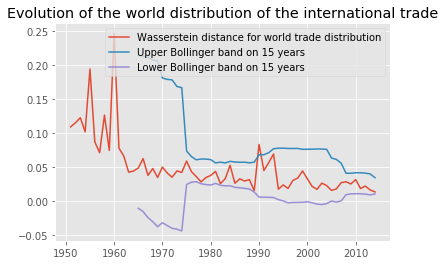

<Figure size 720x720 with 0 Axes>

In [37]:
plt.plot(df['year'].unique()[1:], world_distance_wass.iloc[0,:])
plt.plot(df['year'].unique()[1:], world_distance_wass.iloc[1,:])
plt.plot(df['year'].unique()[1:], world_distance_wass.iloc[2,:])
plt.legend(loc = 'upper right', labels = ['Wasserstein distance for world trade distribution',
                                         'Upper Bollinger band on {} years'.format(window_size),
                                         'Lower Bollinger band on {} years'.format(window_size)])
plt.title('Evolution of the world distribution of the international trade')
plt.figure(figsize=(10, 10))
plt.show()

## Regionial Analysis

In [38]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
data.head()

,year,importer1,importer2,flow1,flow2
0,1920,United States of America,Canada,611.85999,735.47998
1,1921,United States of America,Canada,335.44000,442.98999
2,1922,United States of America,Canada,364.01999,502.84000
3,1923,United States of America,Canada,416.00000,598.14001
4,1924,United States of America,Canada,399.14001,496.32001


In [39]:
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_1['key'] = data_flow_1['Country_A'] + '-' + data_flow_1['Country_B']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
data_flow_2['key'] = data_flow_2['Country_B'] + '-' + data_flow_2['Country_A']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
# drop nan
df = df.dropna()
# We keep years from 1950
df = df[df.year>=1950].reset_index(drop=True)

In [40]:
continent = eval(open("continent.py").read())

In [41]:
continent_dict = {}
for i, j in enumerate(continent):
    continent_dict.update({continent[i]['name']: continent[i]['continent']})

In [42]:
continent_dict.update({'United States of America': 'North America', 'St. Lucia':'North America','St. Vincent and the Grenadines':'North America',
 'Antigua & Barbuda':'North America', 'St. Kitts and Nevis':'North America', 'Ireland':'Europe', 'Netherlands':'Europe',
 'German Federal Republic':'Europe', 'German Democratic Republic':'Europe', 'Czechoslovakia':'Europe',
 'Yugoslavia':'Europe', 'Kosovo':'Europe', 'Sao Tome and Principe':'Africa','Gambia':'Africa', 'Ivory Coast':'Africa',
 'Congo':'Africa','Zanzibar':'Africa','South Sudan':'Africa', 'Yemen Arab Republic':'Asia',
 'Yemen People\'s Republic':'Asia', 'China':'Asia', 'Taiwan':'Asia', 'Republic of Vietnam':'Asia', 'Brunei':'Asia'})

In [43]:
df['continent'] = list(map(continent_dict.get, df.Country_A))
df['continent_B'] = list(map(continent_dict.get, df.Country_B))

In [44]:
df_sub_cont = df.iloc[np.where(df.continent == df.continent_B)[0], :]
df_sub_cont = df_sub_cont.drop(['continent_B'], axis=1)

In [45]:
df_sub_cont = [df_sub_cont[df_sub_cont.continent==i] for i in list(df_sub_cont.continent.unique())]

In [46]:
[i.continent.unique() for i in df_sub_cont]

[array(['North America'], dtype=object),
 array(['South America'], dtype=object),
 array(['Europe'], dtype=object),
 array(['Asia'], dtype=object),
 array(['Africa'], dtype=object),
 array(['Oceania'], dtype=object)]

In [47]:
from itertools import compress

In [48]:
for z, data in enumerate(df_sub_cont):
    data['flow'] = data['flow']/data.groupby(['year'])['flow'].transform(sum)*100

In [49]:
sum(df_sub_cont[4][df_sub_cont[4]['year']==1980]['flow'])

100.0000000000002

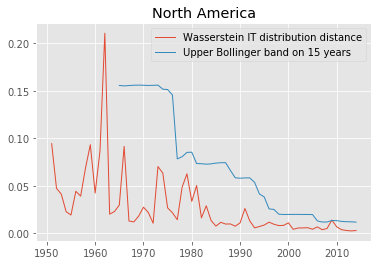

<Figure size 432x288 with 0 Axes>

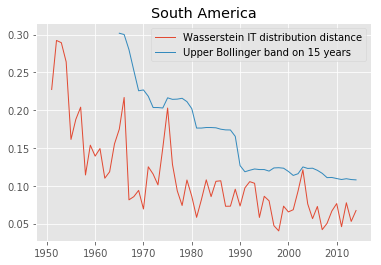

<Figure size 432x288 with 0 Axes>

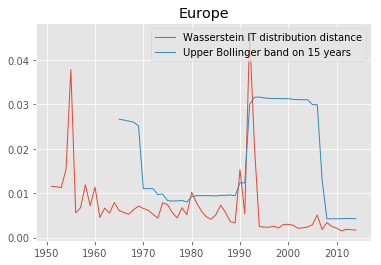

<Figure size 432x288 with 0 Axes>

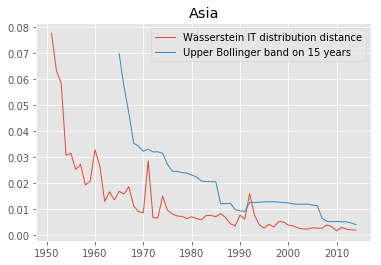

<Figure size 432x288 with 0 Axes>

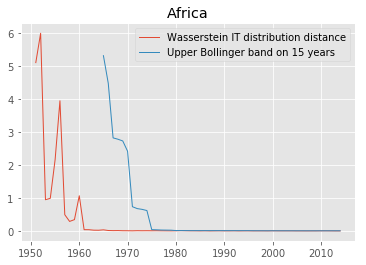

<Figure size 432x288 with 0 Axes>

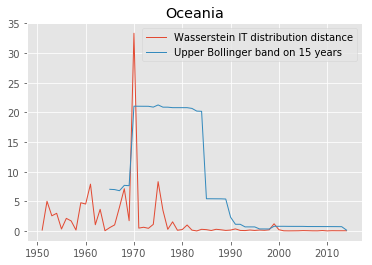

<Figure size 432x288 with 0 Axes>

In [50]:
#fig,axn = plt.subplots(2, 3, sharex=True, sharey=True)
#ax = axn.flat

years = list(np.sort(df_sub_cont[0].year.unique())[1:])

region_pics_wasserstein = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
region_wasserstein = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}
region_upper_bollinger = {'North America': [], 'South America': [], 'Europe': [], 'Asia': [], 'Africa': [], 'Oceania': []}

for z, data in enumerate(df_sub_cont):
    #data['flow'] = data['flow']/data.groupby(['year'])['flow'].transform(sum)
    continent = data.continent.unique()[0]
    for j in years:
        region_wasserstein[continent].append(wasserstein_distance(data[data['year']==(j-1)].flow,
                                                                  data[data['year']==j].flow))
    ma_y = pd.Series(region_wasserstein[continent]).rolling(window=window_size).mean()
    std_y = pd.Series(region_wasserstein[continent]).rolling(window=window_size).std()
    region_upper_bollinger[continent] = ma_y +1.96*std_y
    continent = data.continent.unique()[0]
    region_pics_wasserstein[continent].append(list(compress(list(years), list(region_wasserstein[continent] > region_upper_bollinger[continent]))))
    
    plt.plot(years, region_wasserstein[continent], lw=1)
    plt.plot(years, region_upper_bollinger[continent], lw=1)
    
    plt.title(continent)
    plt.legend(loc = 'upper right', labels = ['Wasserstein IT distribution distance',
                                         'Upper Bollinger band on {} years'.format(window_size)])
    plt.figure(facecolor='w')
    plt.show()

    

In [51]:
region_pics_wasserstein

{'Africa': [[]],
 'Asia': [[1992]],
 'Europe': [[1980, 1990, 1992]],
 'North America': [[2009]],
 'Oceania': [[1970, 1999]],
 'South America': [[]]}

In [53]:
cont_na_2009 = df_sub_cont[0][df_sub_cont[0]['year']==2009].copy()
cont_na_2008 = df_sub_cont[0][df_sub_cont[0]['year']==2008].copy()
cont_na_2008['flow_2008'] = cont_na_2008['flow']
cont_na_2008.drop(['flow'], axis = 1)
cont_na_2008_2009 = cont_na_2009.merge(cont_na_2008, left_on='key', right_on='key', how='inner') 
cont_na_2008_2009['diff'] = cont_na_2008_2009['flow_x'] - cont_na_2008_2009['flow_2008']

In [54]:
cont_na_2008_2009.sort_values(by='diff')

,Country_A_x,Country_B_x,flow_x,key,year_x,continent_x,Country_A_y,Country_B_y,flow_y,year_y,continent_y,flow_2008,diff
1,Canada,United States of America,22.060064,United States of America-Canada,2009,North America,United States of America,Canada,31.088812,2008,North America,31.088812,-9.028748
58,Mexico,United States of America,15.123895,United States of America-Mexico,2009,North America,United States of America,Mexico,19.958211,2008,North America,19.958211,-4.834316
3,United States of America,Canada,27.926960,United States of America-Canada,2009,North America,United States of America,Canada,31.088812,2008,North America,31.088812,-3.161853
142,Mexico,Canada,0.982454,Canada-Mexico,2009,North America,Canada,Mexico,1.684645,2008,North America,1.684645,-0.702191
25,Trinidad and Tobago,United States of America,0.267575,United States of America-Trinidad and Tobago,2009,North America,United States of America,Trinidad and Tobago,0.866769,2008,North America,0.866769,-0.599194
21,United States of America,Jamaica,0.061265,United States of America-Jamaica,2009,North America,Jamaica,United States of America,0.302868,2008,North America,0.302868,-0.241603
16,United States of America,Dominican Republic,0.418301,United States of America-Dominican Republic,2009,North America,Dominican Republic,United States of America,0.630533,2008,North America,0.630533,-0.212232
85,United States of America,Panama,0.039376,United States of America-Panama,2009,North America,Panama,United States of America,0.242070,2008,North America,0.242070,-0.202694
27,United States of America,Trinidad and Tobago,0.687708,United States of America-Trinidad and Tobago,2009,North America,United States of America,Trinidad and Tobago,0.866769,2008,North America,0.866769,-0.179061
5,United States of America,Bahamas,0.103319,United States of America-Bahamas,2009,North America,Bahamas,United States of America,0.277871,2008,North America,0.277871,-0.174552


### Country Analysis

In [55]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
data.head()

,year,importer1,importer2,flow1,flow2
0,1920,United States of America,Canada,611.85999,735.47998
1,1921,United States of America,Canada,335.44000,442.98999
2,1922,United States of America,Canada,364.01999,502.84000
3,1923,United States of America,Canada,416.00000,598.14001
4,1924,United States of America,Canada,399.14001,496.32001


In [56]:
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_1['key'] = data_flow_1['Country_A'] + '-' + data_flow_1['Country_B']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
data_flow_2['key'] = data_flow_2['Country_B'] + '-' + data_flow_2['Country_A']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
# drop nan
df = df.dropna()
# We keep years from 1950
df = df[df.year>=1950].reset_index(drop=True)

In [57]:
df.head()

,Country_A,Country_B,flow,key,year
0,United States of America,Canada,2101.0000,United States of America-Canada,1950
1,Canada,United States of America,2162.1001,United States of America-Canada,1950
2,United States of America,Canada,2465.8000,United States of America-Canada,1951
3,Canada,United States of America,2941.3000,United States of America-Canada,1951
4,Canada,United States of America,3354.1001,United States of America-Canada,1952


In [58]:
df['flow'] = df['flow']/df.groupby(['Country_A', 'year'])['flow'].transform(sum)

In [59]:
from scipy.stats import wasserstein_distance

In [60]:
distance_wass = pd.DataFrame()
distance_wass['Country'] =df['Country_A'].unique()
distance_wass = distance_wass.reindex(columns = distance_wass.columns.tolist() + df['year'].unique()[1:].tolist())

In [61]:
for y, year in enumerate(df['year'].unique()[1:]):
    for c, country in enumerate(df['Country_A'].unique()):
        if (len(df["flow"][(df['Country_A']==country) & (df['year']==year)])!=0 and 
           len(df["flow"][(df['Country_A']==country) & (df['year']==year-1)])!=0):
            distance_wass.iloc[c, y+1] = wasserstein_distance(df["flow"][(df['Country_A']==country) & (df['year']==year)],
                                                         df["flow"][(df['Country_A']==country) & (df['year']==year-1)])


In [62]:
distance_wass.head()

,Country,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
0,United States of America,0.001253,0.001437,0.000796,0.001131,0.001149,0.000846,0.000835,0.000645,0.001133,0.002473,0.000845,0.000757,0.000363,0.000561,0.000738,0.000592,0.000635,0.000589,0.000552,0.000436,0.000572,0.000369,0.000672,0.001149,0.000612,0.000617,0.000357,0.000548,0.000605,0.000580,0.000690,0.000600,0.000517,0.000465,0.000423,0.000554,0.000457,0.000373,0.000323,0.000586,0.000323,0.000628,0.000329,0.000232,0.000265,0.000318,0.000241,0.000268,0.000320,0.000318,0.000242,0.000236,0.000336,0.000295,0.000293,0.000234,0.000186,0.000300,0.000496,0.000209,0.000239,0.000249,0.000253,0.000212
1,Canada,0.001230,0.001237,0.000820,0.000470,0.000767,0.000553,0.000673,0.000948,0.000550,0.002525,0.000496,0.000826,0.000368,0.000550,0.000534,0.000606,0.000259,0.000416,0.000251,0.000437,0.000460,0.000261,0.000428,0.000665,0.000617,0.000372,0.000380,0.000239,0.000418,0.000409,0.000473,0.000327,0.000382,0.000160,0.000168,0.000309,0.000183,0.000347,0.000164,0.000414,0.000200,0.000728,0.000386,0.000185,0.000150,0.000182,0.000116,0.000164,0.000257,0.000374,0.000164,0.000239,0.000321,0.000283,0.000302,0.000243,0.000160,0.000280,0.000330,0.000202,0.000236,0.000266,0.000218,0.000324
2,Bahamas,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001540,0.002031,0.003068,0.002258,0.002539,0.002711,0.002539,0.002786,0.001821,0.001918,0.002435,0.003497,0.002961,0.002267,0.002838,0.003472,0.002515,0.001516,0.001311,0.002142,0.002253,0.002457,0.003748,0.010320,0.008627,0.001231,0.001560,0.001532,0.002514,0.000774,0.000973,0.001571,0.001541,0.000504,0.001725,0.001271,0.001541,0.002009,0.001220,0.001813,0.001137
3,Cuba,0.001205,0.001020,0.000830,0.000548,0.001366,0.001212,0.000997,0.004790,0.004403,0.004216,0.010973,0.002618,0.005877,0.004042,0.004856,0.003887,0.003995,0.001723,0.003146,0.001527,0.001183,0.002693,0.002570,0.001863,0.001910,0.002239,0.001980,0.002545,0.001232,0.001351,0.002488,0.001409,0.001256,0.002275,0.001515,0.000737,0.001379,0.000974,0.001071,0.001154,0.001339,0.001444,0.000957,0.001511,0.000672,0.000879,0.001551,0.001010,0.001446,0.001830,0.001408,0.000864,0.000871,0.001215,0.000858,0.000990,0.000910,0.000910,0.000730,0.000717,0.000554,0.000506,0.000521,0.000683
4,Haiti,0.001641,0.001354,0.000946,0.001548,0.002139,0.001259,0.002589,0.001798,0.003811,0.004022,0.000908,0.000899,0.000959,0.001183,0.001105,0.000818,0.000460,0.000956,0.001307,0.001331,0.000754,0.000906,0.000908,0.001488,0.002048,0.000910,0.001028,0.001429,0.000789,0.001426,0.001694,0.002054,0.000684,0.000768,0.001160,0.001706,0.001940,0.001974,0.002059,0.001976,0.000654,0.001299,0.001052,0.001217,0.000660,0.000789,0.000713,0.000701,0.000646,0.002378,0.000931,0.000964,0.000762,0.001103,0.002036,0.001269,0.001484,0.000724,0.000974,0.000584,0.001065,0.000697,0.000704,0.000271


In [63]:
countries = pd.DataFrame(distance_wass['Country'])

In [64]:
ma_y = distance_wass.rolling(window=window_size, axis=1).mean()
std_y = distance_wass.rolling(window=window_size, axis =1).std()
upper_boll = ma_y+2*std_y
country_wasserstein_pics = distance_wass>upper_boll

In [65]:
country_wasserstein_pics['Country'] = countries
country_wasserstein_pics['Continent'] = pd.DataFrame(list(map(continent_dict.get, countries['Country'])))

In [66]:
country_wasserstein_pics.head()

,Country,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,Continent
0,United States of America,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,North America
1,Canada,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,North America
2,Bahamas,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,North America
3,Cuba,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,North America
4,Haiti,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,North America


In [67]:
type(country_wasserstein_pics)

pandas.core.frame.DataFrame

In [68]:
count_pic = np.sum(country_wasserstein_pics.iloc[:,1:65], axis=1)
np.sum(count_pic!=0)

113

In [69]:
continent_dict

{'Afghanistan': 'Asia',
 'Albania': 'Europe',
 'Algeria': 'Africa',
 'Andorra': 'Europe',
 'Angola': 'Africa',
 'Antigua & Barbuda': 'North America',
 'Antigua and Barbuda': 'North America',
 'Argentina': 'South America',
 'Armenia': 'Asia',
 'Australia': 'Oceania',
 'Austria': 'Europe',
 'Azerbaijan': 'Asia',
 'Bahamas': 'North America',
 'Bahrain': 'Asia',
 'Bangladesh': 'Asia',
 'Barbados': 'North America',
 'Belarus': 'Europe',
 'Belgium': 'Europe',
 'Belize': 'North America',
 'Benin': 'Africa',
 'Bhutan': 'Asia',
 'Bolivia': 'South America',
 'Bosnia and Herzegovina': 'Europe',
 'Botswana': 'Africa',
 'Brazil': 'South America',
 'Brunei': 'Asia',
 'Brunei Darussalam': 'Asia',
 'Bulgaria': 'Europe',
 'Burkina Faso': 'Africa',
 'Burundi': 'Africa',
 'Cambodia': 'Asia',
 'Cameroon': 'Africa',
 'Canada': 'North America',
 'Cape Verde': 'Africa',
 'Central African Republic': 'Africa',
 'Chad': 'Africa',
 'Chile': 'South America',
 'China': 'Asia',
 'Colombia': 'South America',
 'Comor

In [70]:
region_pics_wasserstein

{'Africa': [[]],
 'Asia': [[1992]],
 'Europe': [[1980, 1990, 1992]],
 'North America': [[2009]],
 'Oceania': [[1970, 1999]],
 'South America': [[]]}

North America


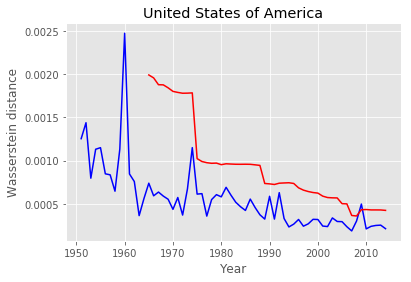

Oceania
Europe


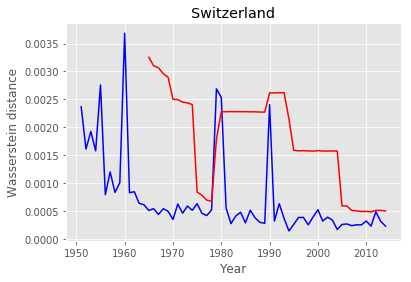

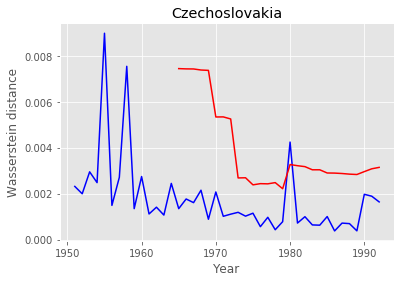

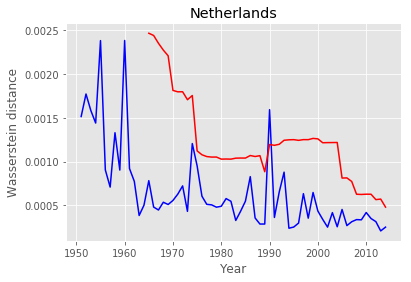

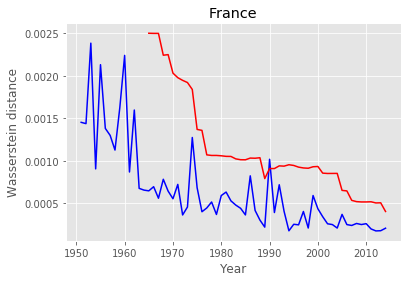

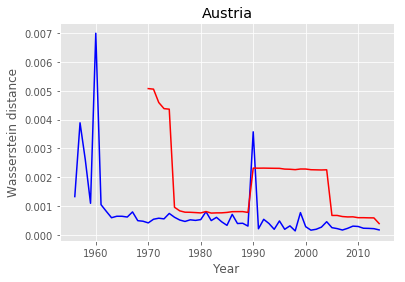

...

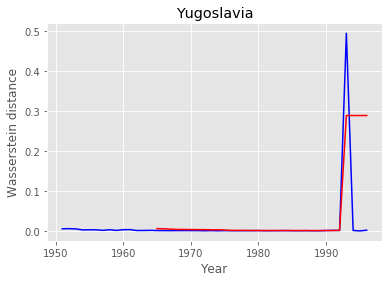

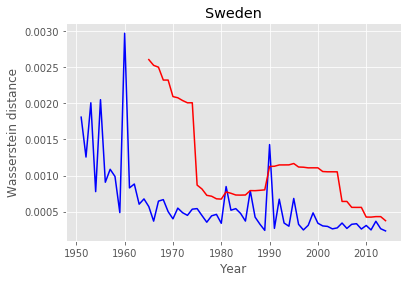

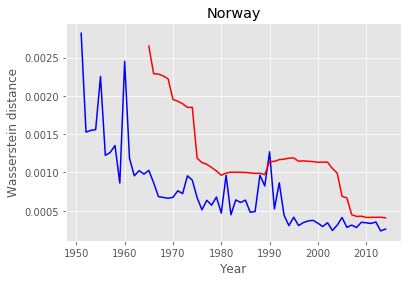

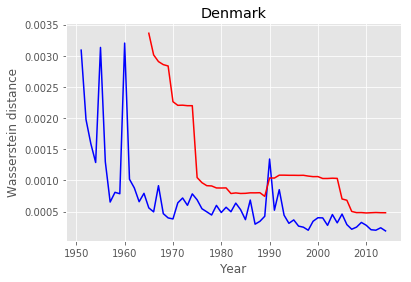

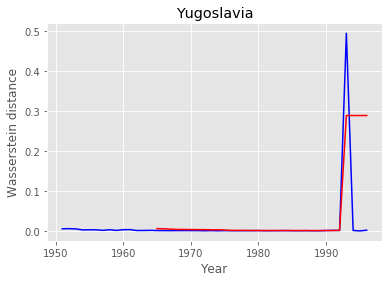

Africa
South America
Asia


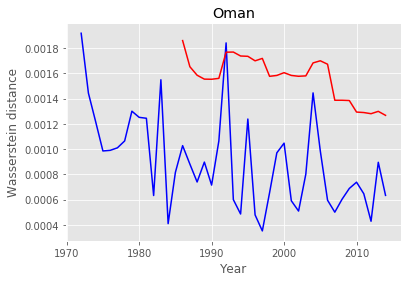

In [71]:
region_pics_wasserstein_ = region_pics_wasserstein
for k, v in region_pics_wasserstein_.items():
    data_temp_cont = country_wasserstein_pics[country_wasserstein_pics.Continent==k]
    print(k)
    for years in v:
        for year in years:
            if year!="":
                data_temp_cont_year =  data_temp_cont[data_temp_cont[year]==True]
                if data_temp_cont_year.shape[0]!=0:
                    for line in range(data_temp_cont_year.shape[0]):
                        country_to_print = data_temp_cont_year.iloc[line, 0]
        
                        wass_temp = distance_wass[distance_wass['Country']==country_to_print]
                        ma_y = wass_temp.iloc[0,1:].rolling(window=window_size).mean()
                        std_y = wass_temp.iloc[0,1:].rolling(window=window_size).std()
                        upper_boll = ma_y+2*std_y

                        plt.plot(wass_temp.columns.values[1:],
                                 wass_temp.T.values[1:],
                                 c = 'blue')
                        plt.plot(wass_temp.columns.values[1:],
                                 upper_boll,
                                 c='red')
                        plt.xlabel('Year')
                        plt.ylabel('Wasserstein distance')
                        plt.title(country_to_print)
                        plt.show()

In [72]:
wass_temp

,Country,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
150,Oman,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001918,0.001443,0.001217,0.000985,0.00099,0.00101,0.001064,0.0013,0.001251,0.001244,0.000632,0.001549,0.000409,0.000815,0.001027,0.000881,0.000739,0.000897,0.000714,0.001064,0.001841,0.000599,0.000485,0.001238,0.000478,0.000351,0.000655,0.00097,0.001047,0.00059,0.000509,0.000801,0.001445,0.000984,0.000595,0.0005,0.000602,0.000688,0.000737,0.000646,0.000428,0.000895,0.000633


In [73]:
swit_1979 = df[(df['Country_A']=='Switzerland') & (df['year']==1989)].copy()
swit_1980 = df[(df['Country_A']=='Switzerland') & (df['year']==1990)].copy()
swit_1980['flow_'] = swit_1980['flow']
swit_1980.drop(['flow'], axis=1)
swit_1979_1980 = swit_1980.merge(swit_1979, left_on='key', right_on='key', how='inner') 
swit_1979_1980['diff'] = swit_1979_1980['flow_x'] - swit_1979_1980['flow_y']

In [74]:
swit_1979_1980.head()

,Country_A_x,Country_B_x,flow_x,key,year_x,flow_,Country_A_y,Country_B_y,flow_y,year_y,diff
0,Switzerland,United States of America,0.062285,United States of America-Switzerland,1990,0.062285,Switzerland,United States of America,0.099332,1989,-0.037047
1,Switzerland,Canada,0.003205,Canada-Switzerland,1990,0.003205,Switzerland,Canada,0.006478,1989,-0.003272
2,Switzerland,Bahamas,0.000156,Bahamas-Switzerland,1990,0.000156,Switzerland,Bahamas,0.000482,1989,-0.000326
3,Switzerland,Cuba,0.000161,Cuba-Switzerland,1990,0.000161,Switzerland,Cuba,0.000217,1989,-0.000056
4,Switzerland,Haiti,0.000026,Haiti-Switzerland,1990,0.000026,Switzerland,Haiti,0.000065,1989,-0.000040


In [75]:
swit_1979_1980.sort_values(by='diff')

,Country_A_x,Country_B_x,flow_x,key,year_x,flow_,Country_A_y,Country_B_y,flow_y,year_y,diff
40,Switzerland,France,1.129018e-01,France-Switzerland,1990,1.129018e-01,Switzerland,France,1.689336e-01,1989,-5.603182e-02
47,Switzerland,Italy,1.071712e-01,Switzerland-Italy,1990,1.071712e-01,Switzerland,Italy,1.578967e-01,1989,-5.072544e-02
0,Switzerland,United States of America,6.228481e-02,United States of America-Switzerland,1990,6.228481e-02,Switzerland,United States of America,9.933175e-02,1989,-3.704694e-02
35,Switzerland,United Kingdom,5.376049e-02,United Kingdom-Switzerland,1990,5.376049e-02,Switzerland,United Kingdom,8.728045e-02,1989,-3.351996e-02
130,Switzerland,Japan,4.472898e-02,Switzerland-Japan,1990,4.472898e-02,Switzerland,Japan,7.067273e-02,1989,-2.594375e-02
37,Switzerland,Netherlands,4.194631e-02,Netherlands-Switzerland,1990,4.194631e-02,Switzerland,Netherlands,6.315457e-02,1989,-2.120825e-02
44,Switzerland,Austria,4.017087e-02,Switzerland-Austria,1990,4.017087e-02,Switzerland,Austria,5.984406e-02,1989,-1.967319e-02
38,Switzerland,Belgium,3.463614e-02,Belgium-Switzerland,1990,3.463614e-02,Switzerland,Belgium,5.077582e-02,1989,-1.613968e-02
97,Switzerland,South Africa,6.192466e-03,Switzerland-South Africa,1990,6.192466e-03,Switzerland,South Africa,1.927546e-02,1989,-1.308299e-02
57,Switzerland,Sweden,1.958189e-02,Switzerland-Sweden,1990,1.958189e-02,Switzerland,Sweden,3.111736e-02,1989,-1.153547e-02


### Communities detection

In [262]:
data = pd.read_csv('Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]

# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_1['key'] = data_flow_1['Country_A'] + '-' + data_flow_1['Country_B']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
data_flow_2['key'] = data_flow_2['Country_B'] + '-' + data_flow_2['Country_A']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
# Replace -9 by NaN
df = df.replace({'flow': {-9: np.nan}})
# drop nan
df = df.dropna()
# We keep years from 1950
df = df[df.year>=1950].reset_index(drop=True)

# This gives us the proportion of importation of Country_A from Country_B at for each yer
df['flow'] = df['flow'] / df.groupby(['year', 'Country_A'])['flow'].transform(sum) * 100
# drop nan
df = df.dropna().reset_index(drop=True)

In [246]:
list_intensity_matrix = []
list_intensity_matrix_col = []
list_intensity_matrix_index = []
for i in list(df.year.unique()):
    inter_df = df[df.year==i]
    # Get squared similarity matrix
    data = pd.pivot_table(inter_df, values='flow', index=['Country_A'], columns=['Country_B'], fill_value=0)
    data = data.drop(list(set(data.columns) - set(data.index)), axis = 1)
    list_intensity_matrix.append(data.as_matrix())
    list_intensity_matrix_col.append(list(data.columns))
    list_intensity_matrix_index.append(list(data.index))

In [306]:
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering

aff_clust = AffinityPropagation(damping = .5, affinity='precomputed')
spec_clust = SpectralClustering(6, affinity='precomputed')

for i in range(len(list_intensity_matrix)):
    print('Spec and Affi in {}'.format(years[i]))
    print(Counter(aff_clust.fit_predict(list_intensity_matrix[i])))
    print(Counter(spec_clust.fit_predict(list_intensity_matrix[i])))

Spec and Affi in 1950
Counter({3: 39, 2: 19, 1: 5, 0: 3})
Counter({0: 38, 4: 17, 3: 7, 5: 2, 1: 1, 2: 1})
Spec and Affi in 1951
Counter({2: 41, 1: 22, 0: 6})
Counter({2: 50, 3: 10, 0: 6, 1: 1, 4: 1, 5: 1})
Spec and Affi in 1952
Counter({3: 44, 2: 19, 0: 4, 1: 2})
Counter({1: 39, 0: 23, 5: 3, 4: 2, 2: 1, 3: 1})
Spec and Affi in 1953
Counter({4: 42, 3: 20, 2: 4, 0: 2, 1: 2})


/Users/Linger/anaconda/lib/python3.5/site-packages/sklearn/utils/validation.py:678: UserWarning:

Array is not symmetric, and will be converted to symmetric by average with its transpose.

/Users/Linger/anaconda/lib/python3.5/site-packages/scipy/sparse/csgraph/_laplacian.py:72: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



Counter({0: 56, 3: 7, 5: 3, 4: 2, 1: 1, 2: 1})
Spec and Affi in 1954
Counter({2: 40, 1: 26, 0: 5})
Counter({0: 37, 1: 22, 5: 9, 2: 1, 3: 1, 4: 1})
Spec and Affi in 1955
Counter({5: 37, 4: 19, 3: 10, 2: 8, 1: 4, 0: 2})
Counter({0: 69, 5: 6, 4: 2, 1: 1, 2: 1, 3: 1})
Spec and Affi in 1956
Counter({4: 37, 3: 19, 1: 10, 2: 10, 0: 5})
Counter({0: 49, 3: 28, 1: 1, 2: 1, 4: 1, 5: 1})
Spec and Affi in 1957
Counter({4: 38, 3: 17, 2: 13, 1: 10, 0: 5})
Counter({0: 70, 4: 9, 1: 1, 2: 1, 3: 1, 5: 1})
Spec and Affi in 1958
Counter({5: 37, 1: 16, 4: 16, 0: 6, 2: 5, 3: 5})
Counter({0: 78, 4: 3, 1: 1, 2: 1, 3: 1, 5: 1})
Spec and Affi in 1959
Counter({5: 39, 1: 21, 4: 12, 0: 5, 2: 5, 3: 3})
Counter({0: 55, 4: 26, 1: 1, 2: 1, 3: 1, 5: 1})
Spec and Affi in 1960
Counter({5: 45, 1: 21, 4: 20, 3: 8, 2: 7, 0: 4})
Counter({3: 98, 0: 2, 4: 2, 1: 1, 2: 1, 5: 1})
Spec and Affi in 1961
Counter({6: 46, 1: 22, 5: 20, 3: 7, 4: 7, 0: 4, 2: 3})
Counter({0: 103, 3: 2, 1: 1, 2: 1, 4: 1, 5: 1})
Spec and Affi in 1962
Counte

## Community detection

In [35]:
data = pd.read_csv('Network_data/Dyadic_COW_4.0.csv')
data = data.iloc[:,2:7]
# Data flow1
data_flow_1 = data.loc[:, ['year', 'importer1', 'importer2', 'flow1']]
data_flow_2 = data.loc[:, ['year', 'importer1', 'importer2', 'flow2']]
data_flow_1.columns = ['year', 'Country_A', 'Country_B', 'flow']
data_flow_2.columns = ['year', 'Country_B', 'Country_A', 'flow']
# Dataset in good shape
df = pd.concat([data_flow_1, data_flow_2]).sort_index().reset_index(drop=True)
df['flow_import_total'] = df.groupby('Country_A')['flow'].transform(np.sum)
df['flow_norm'] = df['flow'] / df['flow_import_total']
df = df[df['flow_norm']>0]

In [36]:
df.to_csv('commmunity_df.txt')

In [37]:
df1.head()

,Country_A,Country_B,flow,year,flow_import_total,flow_norm
184,United States of America,Canada,328719.09000,2012,3.899463e+07,0.008430
185,Canada,United States of America,257486.25000,2012,8.650399e+06,0.029766
268,United States of America,Bahamas,587.79999,2012,3.899463e+07,0.000015
269,Bahamas,United States of America,3956.37010,2012,1.958161e+05,0.020205
490,Cuba,United States of America,511.82999,2012,1.627066e+05,0.003146


### Static analysis

In [38]:
# STATIC ANALYSIS
df1 = df[df['year']==2012]

#first we need to build up the network G
import networkx as nx
G=nx.Graph()

country = df1['Country_A'].unique()

#nodes = country in upper case
for ct in country:
    G.add_node(ct)


#edges = export+import flow
for i in range(len(df1)):
            weighted_edge = (df1.iloc[i,0],df1.iloc[i,1],df1.iloc[i,5])
            G.add_weighted_edges_from([weighted_edge])


#### Kernighan Lin Bisection

In [9]:
from networkx.algorithms import community

for iter_ in range(3):
    if iter_==0:
        communities_ker = community.kernighan_lin_bisection(G,weight = 'weight',max_iter=20)
        G_sub_1 = G.subgraph(communities_ker[0])
        G_sub_2 = G.subgraph(communities_ker[1])
    if iter_==1:
        communities_ker_1 = community.kernighan_lin_bisection(G_sub_1,weight = 'weight',max_iter=20)
        communities_ker_2 = community.kernighan_lin_bisection(G_sub_2,weight = 'weight',max_iter=20)
        G_sub_1 = G.subgraph(communities_ker_1[0])
        G_sub_2 = G.subgraph(communities_ker_1[1])
        G_sub_3 = G.subgraph(communities_ker_2[0])
        G_sub_4 = G.subgraph(communities_ker_2[1])
    if iter_==2:
        communities_ker_1 = community.kernighan_lin_bisection(G_sub_1,weight = 'weight',max_iter=20)
        communities_ker_2 = community.kernighan_lin_bisection(G_sub_2,weight = 'weight',max_iter=20)
        communities_ker_3 = community.kernighan_lin_bisection(G_sub_3,weight = 'weight',max_iter=20)
        communities_ker_4 = community.kernighan_lin_bisection(G_sub_4,weight = 'weight',max_iter=20)
        G_sub_1 = G.subgraph(communities_ker_1[0])
        G_sub_2 = G.subgraph(communities_ker_1[1])
        G_sub_3 = G.subgraph(communities_ker_2[0])
        G_sub_4 = G.subgraph(communities_ker_2[1])
        G_sub_5 = G.subgraph(communities_ker_3[0])
        G_sub_6 = G.subgraph(communities_ker_3[1])
        G_sub_7 = G.subgraph(communities_ker_4[0])
        G_sub_8 = G.subgraph(communities_ker_4[1]) 
    

In [10]:
print(communities_ker_1[0],"\n ------ \n",\
communities_ker_1[1],"\n ------ \n",\
communities_ker_2[0],"\n ------ \n",\
communities_ker_2[1],"\n ------ \n",\
communities_ker_3[0],"\n ------ \n",\
communities_ker_3[1],"\n ------ \n",\
communities_ker_4[0],"\n ------ \n",\
communities_ker_4[1])

{'Argentina', 'Antigua & Barbuda', 'Paraguay', 'Kyrgyzstan', 'Thailand', 'China', 'North Korea', 'Brunei', 'Congo', 'Nepal', 'Uruguay', 'Myanmar', 'Uzbekistan', 'Sri Lanka', 'Sudan', 'Gabon', 'Papua New Guinea', 'Ghana', 'Turkmenistan', 'Iran', 'Tajikistan', 'Cameroon', 'Nigeria', 'Bolivia'} 
 ------ 
 {'Bahrain', 'Kuwait', 'Qatar', 'Syria', 'Indonesia', 'Kenya', 'Jordan', 'Uganda', 'Pakistan', 'Iraq', 'Somalia', 'South Korea', 'Saudi Arabia', 'Yemen', 'United Arab Emirates', 'India', 'Djibouti', 'Taiwan', 'Egypt', 'Bangladesh', 'Japan', 'Oman', 'Philippines', 'Benin'} 
 ------ 
 {'Eritrea', 'Angola', 'Guinea-Bissau', 'Cambodia', 'Cyprus', 'Solomon Islands', 'Federated States of Micronesia', 'Kiribati', 'Dominica', 'Nauru', 'Laos', 'Vietnam', 'Swaziland', 'Palau', 'Madagascar', 'San Marino', 'Samoa', 'Marshall Islands', 'Andorra', 'Bhutan', 'Central African Republic', 'Maldives', 'Iceland', 'East Timor'} 
 ------ 
 {'Rwanda', 'Sao Tome and Principe', 'St. Vincent and the Grenadines', '

In [11]:
#generate one graph per community
list_G = []
list_cluster_KLB = []

u=0
for k in range(1,5):
    list_cluster_KLB.append(vars()['communities_ker_'+str(k)][0])
    list_cluster_KLB.append(vars()['communities_ker_'+str(k)][1])

for group in list_cluster_KLB:
    G = nx.Graph()
    for ct in group:
        G.add_node(ct)
    list_G.append(G)


In [14]:
# spatial representation on the world map
coord = pd.read_csv('Network_data/average-latitude-longitude-countries.csv')
coord = coord.rename(columns={'Country':'Country_A'})
coord['Country_A'] = ['United States of America' if ct=='United States' else ct for ct in coord['Country_A']]

/Users/antoinegrelety/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.

/Users/antoinegrelety/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.



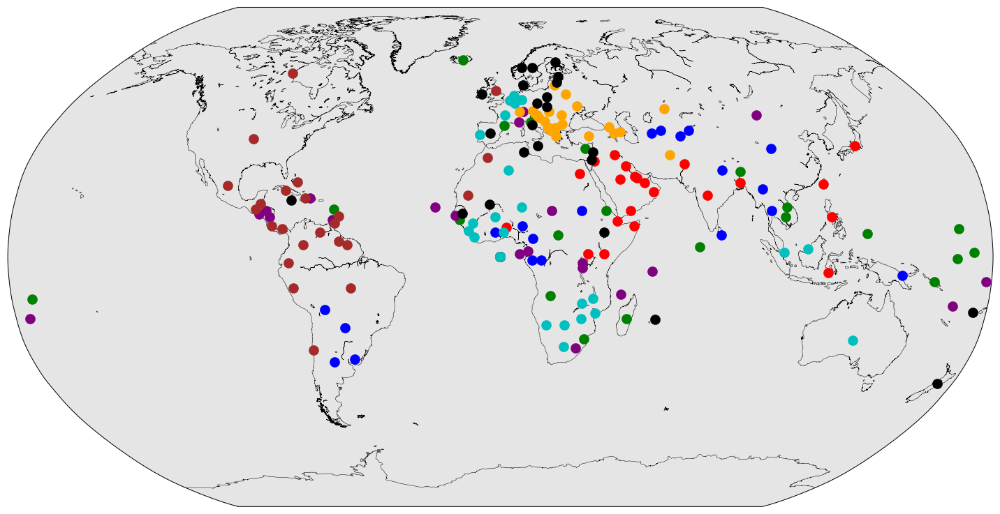

In [15]:
from mpl_toolkits.basemap import Basemap
fig = plt.figure(figsize=(20,12))
m=Basemap(projection='robin',lon_0=0,lat_0=0,resolution='l')

m.fillcontinents(lake_color='white',color='white',zorder=0)
m.drawcoastlines(linewidth=0.5)

col_list=['blue','red','green','purple','orange','black','brown','c']
k=0

for Gr in list_G:
    long=[]
    for ct in Gr.nodes():
        if ct in list(coord['Country_A']):
            long.append( coord[coord['Country_A']==ct]['Longitude'].values[0] )
        else:
            long.append(0)
    lat=[]
    for ct in Gr.nodes():
        if ct in list(coord['Country_A']):
            lat.append( coord[coord['Country_A']==ct]['Latitude'].values[0] )
        else:
            lat.append(0)
    mx,my=m(long,lat)

    # define position in basemap
    country = list(Gr.nodes())
    pos = {}
    for i in range(0,len(country)):
        pos[country[i]]=(mx[i],my[i])

    cluster_draw = nx.draw_networkx(Gr,pos,node_size=200,node_color=col_list[k],with_labels=False)
    plt.legend(facecolor='white',fontsize='x-large')
    k+=1

plt.tight_layout()
plt.savefig('Communities_map_2012_KLB')
plt.show()

#### Louvain method

In [39]:
import community as com_louvain
communities_louvain = com_louvain.best_partition(G,weight='weight')
list_cluster = []
for lab in range( len(set(list(communities_louvain.values()))) ):
    list_cluster.append([key for key,label in communities_louvain.items() if label==lab])
    print([key for key,label in communities_louvain.items() if label==lab])
    print('\n --------------------------- \n')

['United States of America', 'Canada', 'Bahamas', 'Cuba', 'Haiti', 'Dominican Republic', 'Jamaica', 'Trinidad and Tobago', 'Barbados', 'St. Lucia', 'Mexico', 'Belize', 'Guatemala', 'Honduras', 'El Salvador', 'Nicaragua', 'Costa Rica', 'Panama', 'Colombia', 'Venezuela', 'Guyana', 'Suriname', 'Ecuador', 'Peru', 'Brazil', 'Bolivia', 'Chile', 'Argentina', 'United Kingdom', 'Ireland', 'Ethiopia']

 --------------------------- 

['Paraguay', 'Uruguay', 'Netherlands', 'Spain', 'Malta', 'Iceland', 'Mauritania', 'Guinea', 'Burkina Faso', 'Ghana', 'Togo', 'Cameroon', 'Nigeria', 'Morocco', 'Sudan', 'Tajikistan', 'Kyrgyzstan', 'China', 'North Korea', 'Myanmar', 'Nepal', 'Thailand', 'Brunei']

 --------------------------- 

['Belgium', 'Luxembourg', 'France', 'Portugal', 'Germany', 'Poland', 'Hungary', 'Czech Republic', 'Slovakia', 'Bulgaria', 'Romania', 'Estonia', 'Latvia', 'Niger', 'Ivory Coast', 'Liberia', 'Sierra Leone', 'Congo', 'Mauritius', 'Algeria', 'Tunisia', 'Malaysia', 'Singapore', 'Aust

In [32]:
#generate one graph per community
list_G = []

for group in list_cluster:
    G_lv = nx.Graph()
    for ct in group:
        G_lv.add_node(ct)
    list_G.append(G_lv)

/Users/antoinegrelety/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:1767: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.

/Users/antoinegrelety/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning:

The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.



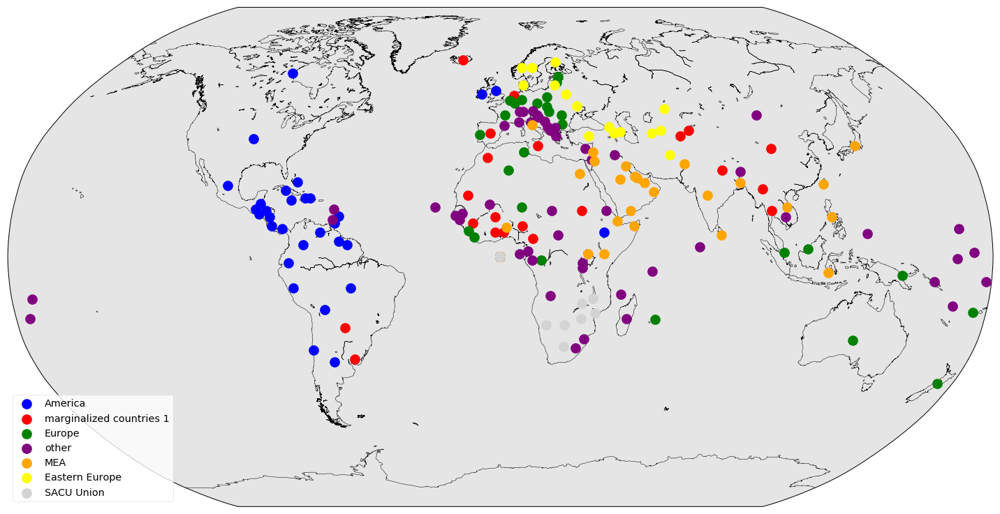

In [40]:
from mpl_toolkits.basemap import Basemap
fig = plt.figure(figsize=(20,12))
m=Basemap(projection='robin',lon_0=0,lat_0=0,resolution='l')

m.fillcontinents(lake_color='white',color='white',zorder=0)
m.drawcoastlines(linewidth=0.5)

col_list=['blue','red','green','purple','orange','yellow','lightgrey']
lab_list=['America','marginalized countries 1','Europe','other','MEA','Eastern Europe','SACU Union']
k=0

for Gr in list_G:
    long=[]
    for ct in Gr.nodes():
        if ct in list(coord['Country_A']):
            long.append( coord[coord['Country_A']==ct]['Longitude'].values[0] )
        else:
            long.append(0)
    lat=[]
    for ct in Gr.nodes():
        if ct in list(coord['Country_A']):
            lat.append( coord[coord['Country_A']==ct]['Latitude'].values[0] )
        else:
            lat.append(0)
    mx,my=m(long,lat)

    # define position in basemap
    country = list(Gr.nodes())
    pos = {}
    for i in range(0,len(country)):
        pos[country[i]]=(mx[i],my[i])

    cluster_draw = nx.draw_networkx(Gr,pos,node_size=200,node_color=col_list[k],with_labels=False,label=lab_list[k])
    plt.legend(facecolor='white',fontsize='x-large')
    k+=1

plt.tight_layout()
plt.savefig('Communities_map_2012')
plt.show()

### Dynamic Analysis

In [41]:
#list of graphs between 1965 and 2012
list_graph = []

for year in range(1965,2015):
    G_y=nx.Graph()
    df_y = df[df['year']==year]
    country = df_y['Country_A'].unique()
    for ct in country:
        G_y.add_node(ct)
    for i in range(len(df_y)):
            weighted_edge = (df_y.iloc[i,0],df_y.iloc[i,1],df_y.iloc[i,5])
            G_y.add_weighted_edges_from([weighted_edge])
    list_graph.append(G_y)

In [42]:
list_cluster = []
communities_list = []
year=1985
for g in list_graph:
    #print('\n --------------------------- \n', 'year: ',year,'\n --------------------------- \n')
    communities_louvain = com_louvain.best_partition(g,weight='weight')
    communities_list.append( communities_louvain )

In [43]:
## fill in 200x200 adjacency matrix. Takes one if country i and j are in the same cluster
nrow = len(df['Country_A'].unique())

len_period = 2014 - 1965

dict_origin = {}

i=0
for ct in country:
    dict_origin[ct] = i
    i+=1

for i in range(len_period):
    for ct in country:
        if ct in communities_list[i]:
            old_key = ct
            ct_index = [dict_origin[key] for key in list(communities_list[i].keys()) if key==ct][0]
            communities_list[i][ct_index] = communities_list[i].pop(old_key)

# now we can build the adjacency matrix, each index corresponding to one row/column
list_A = []

for k in range(len_period):
    A = np.zeros([nrow,nrow])
    for i in range(nrow):
        for j in range(nrow):
            if (i in communities_list[k].keys() ) and (j in communities_list[k].keys() ):
                if (communities_list[k][i] == communities_list[k][j]):
                    A[i,j] = 1
    list_A.append(A)


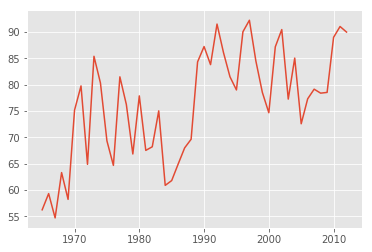

In [44]:
#comparison of matrices year to year
diff_norm = []
for i in range(len_period-1):
    diff_norm.append( np.linalg.norm(list_A[i] - list_A[i+1],ord='fro') )
    
plt.plot(range(1965,1965+len_period-1),diff_norm)
plt.show()

In [47]:
#grouping by continent
continent = eval(open("Network_data/continent.py").read())

continent_dict = {}
for i, j in enumerate(continent):
    continent_dict.update({continent[i]['name']: continent[i]['continent']})
    
continent_dict.update({'United States of America': 'North America', 'St. Lucia':'North America','St. Vincent and the Grenadines':'North America',
 'Antigua & Barbuda':'North America', 'St. Kitts and Nevis':'North America', 'Ireland':'Europe', 'Netherlands':'Europe',
 'German Federal Republic':'Europe', 'German Democratic Republic':'Europe', 'Czechoslovakia':'Europe',
 'Yugoslavia':'Europe', 'Kosovo':'Europe', 'Sao Tome and Principe':'Africa','Gambia':'Africa', 'Ivory Coast':'Africa',
 'Congo':'Africa','Zanzibar':'Africa','South Sudan':'Africa', 'Yemen Arab Republic':'Asia',
 'Yemen People\'s Republic':'Asia', 'China':'Asia', 'Taiwan':'Asia', 'Republic of Vietnam':'Asia', 'Brunei':'Asia'})

for k in continent_dict.keys():
    if (continent_dict[k]=='South America') or (continent_dict[k]=='North America'):
        continent_dict[k]='America'

In [48]:
#changing the order of the countries. Rank by continent
#first we need the dictionary of country:continent
dict_init = {}
i=0
for ct in df['Country_A'].unique():
    dict_init[ct] = i
    i+=1

missing_cty = []    
for cont in set(sorted(continent_dict.values())):
    for cty in dict_init.keys():
        if cty not in continent_dict.keys():
            missing_cty.append(cty)

continent_dict['Bavaria'] = "Europe"
continent_dict['Baden'] = "Europe"
continent_dict['Wuerttemburg'] = "Europe"
continent_dict['Austria-Hungary'] = "Europe"
continent_dict['Korea'] = "Asia"

#then we match each country ID with its continent: create a dictionary Continent:countryID
countryID_cont=[]
dict_country_ID = {}
for cont in set(sorted(continent_dict.values())):
    for cty in dict_init.keys():
        if cty in continent_dict.keys() and continent_dict[cty] == cont:
            countryID_cont.append((dict_init[cty],cont))

dict_init_reverse = {v:k for k,v in dict_init.items()}
for el in countryID_cont:
    dict_country_ID[dict_init_reverse[el[0]]] = el[0] #map a new sorted dictionary country/countryID


#sort the dictionary Continent:CountryID by continent
countryID_cont.sort(key=lambda tup:tup[1])
#fill the re-ordered countryID in a vector and re-order the A matrices in list_A
new_order = [countryID_cont[i][0] for i in range(len(countryID_cont))]

list_A_sorted = []
i=0
for a in list_A:
    list_A_sorted.append( a[new_order][:,new_order] )
    i=i+1

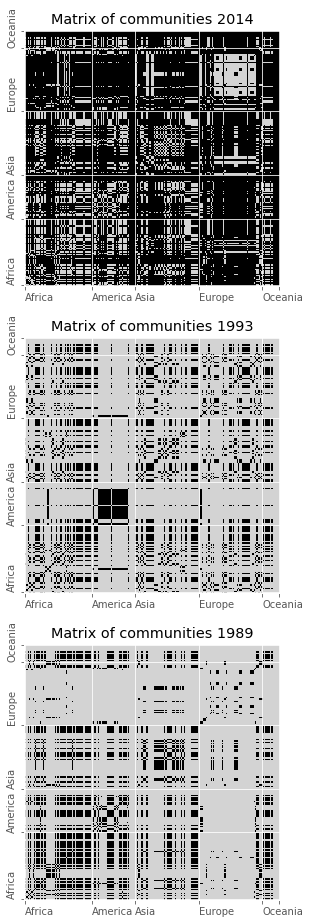

In [50]:
# display only the chosen ticks and ticklabels
fig = plt.figure(figsize=[6,16])

# define the colors
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(['lightgray', 'k'])

# create a normalize object the describes the limits of
# each color
bounds = [0., 0.5, 1.]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# pick the labels you want 
ticks = [0, 54, 89, 141, 192, 206] # C=2 because A=0 because Python is 0-indexed
#ticks_pos = [int((ticks[i]+ticks[i+1])/2) for i in range(len(ticks)-1)]

ticklabels = ['Africa','America','Asia','Europe','Oceania']

today=len(list_A_sorted)-1

ax = fig.add_subplot(311)
ax.imshow(np.ones([207,207])-abs(list_A_sorted[today]  - list_A_sorted[today-25]),\
          interpolation='none', cmap=cmap, norm=norm,origin='lower')
ax.autoscale(False)
ax.set_xticks(ticks)
ax.set_xticklabels(ticklabels,horizontalalignment='left')
ax.set_yticks(ticks)
ax.set_yticklabels(ticklabels,va='bottom',rotation='vertical',horizontalalignment='right')
ax.set_title('Matrix of communities 2014')

ax = fig.add_subplot(312)
ax.imshow(list_A_sorted[today-21] , interpolation='none', cmap=cmap, norm=norm,origin='lower')
ax.autoscale(False)
ax.set_xticks(ticks)
ax.set_xticklabels(ticklabels,horizontalalignment='left')
ax.set_yticks(ticks)
ax.set_yticklabels(ticklabels,va='bottom',rotation='vertical',horizontalalignment='right')
ax.set_title('Matrix of communities 1993')

ax = fig.add_subplot(313)
ax.imshow(list_A_sorted[today-25] , interpolation='none', cmap=cmap, norm=norm,origin='lower')
ax.autoscale(False)
ax.set_xticks(ticks)
ax.set_xticklabels(ticklabels,horizontalalignment='left')
ax.set_yticks(ticks)
ax.set_yticklabels(ticklabels,va='bottom',rotation='vertical',horizontalalignment='right')
ax.set_title('Matrix of communities 1989')

plt.savefig('matrix_communities')
plt.show()